# Análisis exploratorio de datos

## A. Estudio del conjunto de datos de accidentes definitivo

### A.1. Carga de librerías

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.style as style
style.use('ggplot')
import seaborn as sns
from scipy.spatial import distance_matrix
import zipfile
import requests
from io import BytesIO
import calendar
import locale
from dateutil.relativedelta import relativedelta
from category_encoders import MEstimateEncoder
import re
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, normalize
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, adjusted_rand_score
import scipy.cluster.hierarchy as shc
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

import matplotlib
color = sns.color_palette()
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
# from plotly import tools
# import plotly.tools as tls
# import squarify
# from mpl_toolkits.basemap import Basemap
# from numpy import array
# from matplotlib import cm

# import cufflinks and offline mode
import cufflinks as cf
cf.go_offline()

### A.2. Carga del conjunto de datos

In [2]:
# Cargamos el conjunto de datos de accidentes definitivo
df_accidentes = pd.read_csv('./Datasets/accidentes_definitivo_geo_2019_2023_v3.csv', delimiter=';', encoding='latin-1')

In [3]:
# Observamos la información principal del conjunto de datos
df_accidentes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3920 entries, 0 to 3919
Data columns (total 54 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   num_expediente           3920 non-null   object 
 1   fecha_acc                3920 non-null   object 
 2   hora_acc                 3920 non-null   object 
 3   localizacion_acc         3920 non-null   object 
 4   numero_acc               3920 non-null   object 
 5   localizacion_acc_1       3920 non-null   object 
 6   clase_via_acc_1          3846 non-null   object 
 7   nombre_via_acc_1         3920 non-null   object 
 8   numero_via_acc_1         2043 non-null   float64
 9   localizacion_acc_2       1707 non-null   object 
 10  clase_via_acc_2          1612 non-null   object 
 11  nombre_via_acc_2         1707 non-null   object 
 12  numero_via_acc_2         15 non-null     float64
 13  geometry                 3920 non-null   object 
 14  cod_distrito            

In [4]:
# Vemos sus dimensiones
print(f"El conjunto de datos tiene {df_accidentes.shape[0]} filas y {df_accidentes.shape[1]} columnas")

El conjunto de datos tiene 3920 filas y 54 columnas


In [5]:
# Vemos sus 5 primeras filas
df_accidentes.head(5)

,num_expediente,fecha_acc,hora_acc,localizacion_acc,numero_acc,localizacion_acc_1,clase_via_acc_1,nombre_via_acc_1,numero_via_acc_1,localizacion_acc_2,...,intensidad,ocupacion,carga,vmed,error,periodo_integracion,cod_cent_pmed,nombre_pmed,utm_x_pmed,utm_y_pmed
0,2019S000036,02/01/2019,20:45:00,AVDA GRAN VIA DE HORTALEZA / GTA LUIS ROSALES,65B,AVDA GRAN VIA DE HORTALEZA,AVENIDA,GRAN VIA DE HORTALEZA,NaN,GTA LUIS ROSALES,...,373,8.0,16,0.0,N,15,56002,C/. López de Hoyos - Guisona-Gran Vía de Horta...,444606.203129,4.479884e+06
1,2019S032353,07/10/2019,10:15:00,"CALL AREQUIPA, 2",2,"CALL AREQUIPA, 2",CALLE,AREQUIPA,2.0,NaN,...,1039,6.0,40,0.0,N,15,56015,C/. Ayacucho - Mar Adriatico-Valdetorres del J...,445686.526882,4.480110e+06
2,2020S007094,21/05/2020,20:40:00,CALL CARRIL DEL CONDE / CALL CAMINOS,37,CALL CARRIL DEL CONDE,CALLE,CARRIL CONDE,NaN,CALL CAMINOS,...,54,0.0,13,0.0,N,15,55034,C/. Asura - Carril del Conde-Moscatelar,444483.879535,4.478751e+06
3,2020S008367,16/06/2020,22:00:00,CALL RAMON POWER / CALL HAENDEL,25,CALL RAMON POWER,CALLE,RAMON POWER,NaN,CALL HAENDEL,...,378,1.0,18,0.0,N,15,55036,C/. Silvano - Mosqueda-Haendel,446913.154077,4.479287e+06
4,2020S008367,16/06/2020,22:00:00,CALL RAMON POWER / CALL HAENDEL,25,CALL RAMON POWER,CALLE,RAMON POWER,NaN,CALL HAENDEL,...,378,1.0,18,0.0,N,15,55036,C/. Silvano - Mosqueda-Haendel,446913.154077,4.479287e+06


In [6]:
# Y también sus últimas 5 filas
df_accidentes.tail(5)

,num_expediente,fecha_acc,hora_acc,localizacion_acc,numero_acc,localizacion_acc_1,clase_via_acc_1,nombre_via_acc_1,numero_via_acc_1,localizacion_acc_2,...,intensidad,ocupacion,carga,vmed,error,periodo_integracion,cod_cent_pmed,nombre_pmed,utm_x_pmed,utm_y_pmed
3915,2021S011682,27/06/2021,10:30:00,"CALL ENCOMIENDA DE PALACIOS, 1",1,"CALL ENCOMIENDA DE PALACIOS, 1",CALLE,ENCOMIENDA DE PALACIOS,1.0,NaN,...,264,1.0,0,77.0,N,5,05TL00PM01,05TL00PM01,444978.113804,4.472394e+06
3916,2022S012306,27/04/2022,6:00:00,CALL FUENTE CARRANTONA / AVDA PABLO NERUDA,1,CALL FUENTE CARRANTONA,CALLE,FUENTE CARRANTONA,NaN,AVDA PABLO NERUDA,...,159,0.0,3,0.0,N,15,65007,Fuente Carrantona - Arroyo Fontarron-Miguel H...,445694.217583,4.471827e+06
3917,2022S025257,07/09/2022,0:05:00,"CALL ENCOMIENDA DE PALACIOS, 35",35,"CALL ENCOMIENDA DE PALACIOS, 35",CALLE,ENCOMIENDA DE PALACIOS,35.0,NaN,...,152,22.0,25,0.0,N,13,52013,C/. Pico Artilleros - Hacienda de Pavones-Cami...,445494.142418,4.472821e+06
3918,2023S014932,12/04/2023,9:20:00,CALL CORREGIDOR DIEGO DE VALDERRABANO / CALL M...,1,CALL CORREGIDOR DIEGO DE VALDERRABANO,CALLE,CORREGIDOR DIEGO DE VALDERRABANO,NaN,CALL MANUEL MARIA ARRILLAGA,...,300,1.0,0,81.0,N,5,08RE66PM01,08RE66PM01,443689.009110,4.473095e+06
3919,2023S014932,12/04/2023,9:20:00,CALL CORREGIDOR DIEGO DE VALDERRABANO / CALL M...,1,CALL CORREGIDOR DIEGO DE VALDERRABANO,CALLE,CORREGIDOR DIEGO DE VALDERRABANO,NaN,CALL MANUEL MARIA ARRILLAGA,...,300,1.0,0,81.0,N,5,08RE66PM01,08RE66PM01,443689.009110,4.473095e+06


In [7]:
# Se analiza el tipo de dato de cada columna
df_accidentes.dtypes

num_expediente              object
fecha_acc                   object
hora_acc                    object
localizacion_acc            object
numero_acc                  object
localizacion_acc_1          object
clase_via_acc_1             object
nombre_via_acc_1            object
numero_via_acc_1           float64
localizacion_acc_2          object
clase_via_acc_2             object
nombre_via_acc_2            object
numero_via_acc_2           float64
geometry                    object
cod_distrito                 int64
nom_distrito                object
nom_barrio                  object
cod_barrio                   int64
cod_disbar                  object
tipo_ruta                   object
tipo_accidente              object
estado_meteorologico        object
tipo_vehiculo               object
implicados                   int64
implicados_peatones        float64
implicados_pesados         float64
implicados_turismos        float64
implicados_motocicletas    float64
implicados_bicicleta

In [8]:
# Se visualizan los valores únicos de cada columna, de cara a entender mejor el conjunto de datos
for col in df_accidentes.columns:
    print(f"Valores únicos de {col} ({len(df_accidentes[col].unique())}): \n {df_accidentes[col].unique()}")

Valores únicos de num_expediente (3498): 
 ['2019S000036' '2019S032353' '2020S007094' ... '2022S012306' '2022S025257'
 '2023S014932']
Valores únicos de fecha_acc (1389): 
 ['02/01/2019' '07/10/2019' '21/05/2020' ... '05/06/2023' '26/10/2020'
 '27/04/2022']
Valores únicos de hora_acc (608): 
 ['20:45:00' '10:15:00' '20:40:00' '22:00:00' '22:15:00' '5:40:00'
 '17:20:00' '10:45:00' '10:39:00' '19:20:00' '17:30:00' '12:50:00'
 '17:10:00' '8:28:00' '13:50:00' '10:10:00' '20:21:00' '10:30:00'
 '9:30:00' '17:50:00' '8:55:00' '21:42:00' '23:05:00' '9:10:00' '18:50:00'
 '7:58:00' '10:05:00' '8:15:00' '19:00:00' '18:15:00' '12:30:00' '9:05:00'
 '15:45:00' '19:30:00' '20:00:00' '10:50:00' '12:05:00' '17:02:00'
 '10:00:00' '16:27:00' '11:30:00' '11:00:00' '23:29:00' '21:00:00'
 '22:10:00' '16:15:00' '21:30:00' '8:45:00' '12:06:00' '11:35:00'
 '20:50:00' '12:40:00' '14:00:00' '14:30:00' '15:20:00' '15:15:00'
 '20:30:00' '20:10:00' '19:42:00' '18:30:00' '21:15:00' '20:37:00'
 '14:50:00' '14:28:00' '

### A.3. Búsqueda de anomalías

In [9]:
# Comprobamos qué columnas tienen nulos
df_accidentes.isnull().sum()[df_accidentes.isnull().sum()>0]

clase_via_acc_1           74
numero_via_acc_1        1877
localizacion_acc_2      2213
clase_via_acc_2         2308
nombre_via_acc_2        2213
numero_via_acc_2        3905
tipo_ruta                133
estado_meteorologico     125
cod_lesividad            522
lesividad                522
positiva_alcohol           6
positiva_droga          3913
ocupacion                  3
error                      6
nombre_pmed                3
dtype: int64

In [10]:
df_accidentes[df_accidentes.ocupacion.isnull()]

,num_expediente,fecha_acc,hora_acc,localizacion_acc,numero_acc,localizacion_acc_1,clase_via_acc_1,nombre_via_acc_1,numero_via_acc_1,localizacion_acc_2,...,intensidad,ocupacion,carga,vmed,error,periodo_integracion,cod_cent_pmed,nombre_pmed,utm_x_pmed,utm_y_pmed
2074,2022S026637,16/09/2022,22:05:00,AVDA ALBUFERA / CALL MONTE ULIA,6,AVDA ALBUFERA,AVENIDA,ALBUFERA,NaN,CALL MONTE ULIA,...,60,NaN,0,61.0,N,5,10XC18PM01,10XC18PM01,443215.818094,4.472207e+06
2224,2021S009902,05/06/2021,5:30:00,PLAZA LEGAZPI CON PASEO DE LA CHOPERA,9,PLAZA LEGAZPI,PLAZA,LEGAZPI,NaN,PASEO DE LA CHOPERA,...,204,NaN,0,75.0,N,5,13XC26PM01,13XC26PM01,440943.733736,4.471423e+06
3205,2022S025198,06/09/2022,23:30:00,MADRID,1,MADRID,NaN,MADRID,NaN,NaN,...,240,NaN,0,77.0,N,5,18NC20PM01,18NC20PM01,438776.656164,4.474437e+06


In [11]:
df_accidentes[df_accidentes['tipo_elem_pmed']=="M30"]['ocupacion']

27      3.0
28      3.0
29      1.0
30      2.0
34      6.0
       ... 
3811    0.0
3812    0.0
3829    4.0
3830    2.0
3915    1.0
Name: ocupacion, Length: 310, dtype: float64

In [12]:
""" Validación """
df_accidentes.shape

(3920, 54)

Hay 15 columnas con valores faltantes. Vamos a analizar campo por campo dichas anomalías:
* Los nulos encontrados en el campo **"clase_via_acc_1"** se deben a que hay direcciones en las que no se ha registrado dicha información. Dado que también hay problemas con las columnas **"nombre_via_acc_1"** (información aportada no hace referencia a ninguna vía) y **"numero_via_acc_1"** (no se ha proporcionado esta información), la solución que se propone es reemplazar la localización del accidente a partir de la información del callejero de Madrid y las coordenadas del accidente.
* Los nulos encontrados en el campo **"localizacion_acc_2"** se deben a que no hay una segunda calle implicada en el accidente, por lo que no se trata de una anomalía. La propuesta para gestionar esta anomalía es crear un campo binario llamado "cruce" que tome el valor de 1 si esta columna no está vacía (es decir, el accidente se produce entre dos calles, y por tanto es un cruce), y 0 en caso contrario. De esta forma, se puede prescindir también de los campos "clase_via_acc_2", "nombre_via_acc_2" y "numero_via_acc_2".
* Los nulos encontrados en el campo **"estado_meteorologico"** se deben a que no se recogió dicha información. La solución para por imputar los valores faltantes con "Se desconoce".
* Los nulos encontrados en el campo **"cod_lesividad"** se deben a que el accidentado no requirió asistencia sanitaria. El código asignado a esa casuística es el 14, por lo que se imputaran los nulos con dicho valor.
* Los nulos encontrados en el campo **"lesividad"** se deben, al igual que "cod_lesividad", a que el accidentado no requirió asistencia sanitaria. Se imputaran los nulos con el texto "Sin asistencia sanitaria".
* Los nulos encontrados en el campo **"positiva_alcohol"** se deben a que no se registró dicha información. En los 5 casos, se trata de un afectado que no precisó asistencia médica, por lo que se imputaran dichos registros con el valor "N" (negativo).
* Los nulos encontrados en el campo **"positiva_droga"** se deben a que la persona involucrada dio negativo. Por lo tanto, estos casos se imputaran con 0. (negativo).
* Los nulos encontrados en el campo **"ocupacion"** se deben a que por algún motivo no se registró dicha información. Se imputará el valor de ocupación del mismo punto de medida en el instante más próximo al accidente.
* Los nulos encontrados en el campo **"error"** se deben a que no hubo errores en la toma de registros de los puntos de medida. Se imputarán estos registros con "N" (sin errores ni sustituciones).
* Los nulos encontrados en el campo **"nombre_pmed"** se deben a que el punto de medida no tiene nombre. La solución propuesta pasa por imputar dichos registros con "Sin nombre".
* Los nulos encontrados en el campo **"tipo_ruta"** se deben a que el accidente tuvo lugar el una vía no reconocida por el Ayuntamiento de Madrid como vía ciclista. La solución propuesta pasa por imputar dichos registros con "OTRO".

BORRAR
* Los nulos encontrados en el campo **"nombre_via_acc_1"** se deben a que hay direcciones en las que la información aportada no hace referencia a ninguna vía. La solución propuesta pasa por imputar manualmente esos 2 registros a partir de las coordenadas del accidente.
* Los nulos encontrados en el campo **"numero_via_acc_1"** se deben a que no se ha proporcionado esta información. Debido al gran volumen de faltantes, en principio se opta por descartar la columna, ya que se dispone de suficiente información con los campos de nombre_via_acc_1 y clase_via_acc_1.

### A.4. Corrección de anomalías

#### A.4.1. Corrección campo "clase_via_acc1"

In [13]:
# Lo primero que se va a probar es cruzar el campo "clase_via_acc1" con el Callejero Oficial del Ayuntamiento de Madrid, concretamente la "Relación de direcciones con su evolución histórica"
# Se opta por este conjunto y no por "Relación de direcciones vigentes, con coordenadas" ya que se ha comprobado que este último contiene errores que el fichero elegido no tiene
# (registros con el mismo identificador único de la dirección).
# Este fichero permite aprovechar las coordenadas del conjunto de datos de accidentes, de tal forma que se va a buscar la dirección que está más próxima a cada accidente
# independientemente de la dirección anotada en el campo localización

# Cargamos el conjunto de datos del callejero oficial
df_callejero = pd.read_csv('./Datasets/DireccionesEvolucionHistorica_20230810.csv', delimiter=';', encoding='latin-1', decimal=',')

La "Relación de direcciones con su evolución histórica" es un conjunto de datos disponible en el Portal de datos abiertos del Ayuntamiento de Madrid que contiene la relación de todas las direcciones vigentes e históricas de la ciudad de Madrid ordenadas alfabéticamente por el nombre de la vía y su numeración, y cronológicamente de más reciente a más antigua. Cada fila se corresponde con una dirección. Su dirección de descarga es la siguiente: https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=b3c41f3cf6a6c410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default

La estructura del fichero es la siguiente:
* **COD_VIA**: Identificador único de la vía.
* **VIA_SQC**: Secuencia de la denominación de la dirección. 
* **VIA_CLASE**: Tipo de vía (calle, avenida, paseo, etc.).
* **VIA_PAR**: Partícula que se sitúa entre el tipo de vía y el nombre de la vía.
* **VIA_NOMBRE**: Nombre de la vía.
* **VIA_NOMBRE_ACENTOS**: Ídem al anterior, pero con acentos. 
* **COD_NDP**: Identificador del número de policia.
* **CLASE_NDP**: Clase de número, es decir, si hace referencia a número o kilómetro.
* **NUMERO**: Número de policia.
* **CALIFICADOR**: Calificador del número de policía.
* **TIPO_NDP**: Tipo de número. Puede ser portal, garaje, fachada, etc.
* **FECHA_DE_ALTA**: Fecha de alta de la dirección.
* **FECHA_DE_BAJA**: Fecha de baja de la dirección.
* **DISTRITO**: Código del distrito donde se ubica la dirección.
* **BARRIO**: Código del barrio donde se ubica la dirección.
* **COD_POSTAL**: Código postal de la dirección.
* **UTMX_ED**: Coordenada UTM X en sistema geodésico ED50. Actualmente está en desuso.
* **UTMY_ED**: Coordenada UTM Y en sistema geodésico ED50. Actualmente está en desuso.
* **UTMX_ETRS**: Coordenada UTM X en sistema geodésico ETRS89.
* **UTMY_ETRS**: Coordenada UTM Y en sistema geodésico ETRS89.
* **LATITUD**: Latitud de cada dirección, en el datum ETRS89.
* **LONGITUD**: Longitud de cada dirección, en el datum ETRS89.
* **ANGULO**: Ángulo de orientación del rótulo del número de policía, en función de la orientación de la fachada.

In [14]:
# Se analiza la estructura del conjunto de datos.
df_callejero.head()

,COD_VIA,VIA_SQC,VIA_CLASE,VIA_PAR,VIA_NOMBRE,VIA_NOMBRE_ACENTOS,COD_NDP,CLASE_NDP,NÚMERO,CALIFICADOR,FECHA_DE_ALTA,FECHA_DE_BAJA,TIPO_NDP,UTMX_ED,UTMY_ED,UTMX_ETRS,UTMY_ETRS,LATITUD,LONGITUD,ANGULO_ROTULACION
0,127,NaN,CALLE,DE,ISABEL COLBRAND,ISABEL COLBRAND,11049663,NUMERO,2,B,13/10/1992,NaN,PORTAL,443214.74,4485347.45,443105.38,4485139.98,40°30'54.12'' N,3°40'17.75'' W,85.86
1,127,NaN,CALLE,DE,ISABEL COLBRAND,ISABEL COLBRAND,11049663,NUMERO,2,NaN,01/01/1991,13/10/1992,PORTAL,443214.74,4485347.45,443105.38,4485139.98,40°30'54.12'' N,3°40'17.75'' W,85.86
2,127,NaN,CALLE,DE,ISABEL COLBRAND,ISABEL COLBRAND,11049664,NUMERO,4,NaN,01/01/1991,NaN,PORTAL,443212.21,4485305.01,443102.86,4485097.54,40°30'52.74'' N,3°40'17.85'' W,86.29
3,127,NaN,CALLE,DE,ISABEL COLBRAND,ISABEL COLBRAND,20057084,NUMERO,14,NaN,13/10/1992,NaN,PARCELA,442858.75,4484933.55,442749.39,4484726.08,40°30'40.61'' N,3°40'32.75'' W,27.04
4,127,NaN,CALLE,DE,ISABEL COLBRAND,ISABEL COLBRAND,20057087,NUMERO,16,A,06/11/1998,NaN,PORTAL,442750.17,4484945.03,442640.81,4484737.56,40°30'40.95'' N,3°40'37.36'' W,16.81


In [15]:
# Dado que solo se quieren las direcciones más vigentes, se filtra por aquellas en las que "FECHA_DE_BAJA" está vacío
df_callejero_vigente = df_callejero[df_callejero.FECHA_DE_BAJA.isna()]
print(f"Se pasa de {df_callejero.shape[0]} direcciones (históricas + vigentes) a {df_callejero_vigente.shape[0]} direcciones vigentes")

Se pasa de 371459 direcciones (históricas + vigentes) a 211566 direcciones vigentes


In [16]:
# Se comprueba la existencia de duplicados según la localización
df_callejero_vigente[['UTMX_ETRS', 'UTMY_ETRS']].duplicated().sum()

88

In [17]:
# Dado que hay registros duplicados en base a los campos de coordenadas, se va a eliminar los duplicados, manteniendo el registro con una FECHA_DE_ALTA más reciente
# Lo primero es convertir el campo FECHA_DE_ALTA a formato de fecha
df_callejero_vigente['FECHA_DE_ALTA'] = pd.to_datetime(df_callejero_vigente['FECHA_DE_ALTA'], format='%d/%m/%Y')

# Para facilitar el proceso, se ordena el DataFrame por las columnas 'UTMX_ETRS' y 'UTMY_ETRS' de manera ascendente, y 'FECHA_DE_ALTA' descendente
df_callejero_vigente.sort_values(by=['UTMX_ETRS', 'UTMY_ETRS', 'FECHA_DE_ALTA'], ascending=[True, True, False], inplace=True)

# Por último, se eliminan los duplicados manteniendo el primer registro (el más reciente)
df_callejero_vigente.drop_duplicates(subset=['UTMX_ETRS', 'UTMY_ETRS'], keep='first', inplace=True)
print(f"Se pasa de {df_callejero.shape[0]} direcciones (históricas + vigentes) a {df_callejero_vigente.shape[0]} direcciones vigentes sin duplicados")

Se pasa de 371459 direcciones (históricas + vigentes) a 211478 direcciones vigentes sin duplicados


In [18]:
# Se define una función que encuentre la dirección más cercana a cada accidente
# Devuelve el id de la dirección más cercana
def encuentra_direccion_mas_cercana(row, df2):
    dist_matrix = distance_matrix(row[['utm_x_acc', 'utm_y_acc']].values.reshape(1, -1), df2[['UTMX_ETRS', 'UTMY_ETRS']])
    id_direccion_mas_cercana = dist_matrix.argmin()

    return df2.iloc[id_direccion_mas_cercana]['COD_NDP']

In [19]:
df_callejero_vigente.columns

Index(['COD_VIA', 'VIA_SQC', 'VIA_CLASE', 'VIA_PAR', 'VIA_NOMBRE',
       'VIA_NOMBRE_ACENTOS', 'COD_NDP', 'CLASE_NDP', 'NÚMERO', 'CALIFICADOR',
       'FECHA_DE_ALTA', 'FECHA_DE_BAJA', 'TIPO_NDP', 'UTMX_ED', 'UTMY_ED',
       'UTMX_ETRS', 'UTMY_ETRS', 'LATITUD', 'LONGITUD', 'ANGULO_ROTULACION'],
      dtype='object')

In [20]:
df_accidentes.columns

Index(['num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc',
       'numero_acc', 'localizacion_acc_1', 'clase_via_acc_1',
       'nombre_via_acc_1', 'numero_via_acc_1', 'localizacion_acc_2',
       'clase_via_acc_2', 'nombre_via_acc_2', 'numero_via_acc_2', 'geometry',
       'cod_distrito', 'nom_distrito', 'nom_barrio', 'cod_barrio',
       'cod_disbar', 'tipo_ruta', 'tipo_accidente', 'estado_meteorologico',
       'tipo_vehiculo', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'tipo_persona', 'rango_edad', 'sexo',
       'cod_lesividad', 'lesividad', 'utm_x_acc', 'utm_y_acc',
       'positiva_alcohol', 'positiva_droga', 'fecha_hora_med',
       'id_pmed_mas_cercano', 'tipo_elem_pmed', 'intensidad', 'ocupacion',
       'carga', 'vmed', 'error', 'periodo_integracion', 'cod_cent_pmed',
       'nombre_pmed', 'utm

In [21]:
# Se añaden las columnas correspondientes al conjunto de datos de accidentes
df_accidentes['COD_NDP'] = df_accidentes.apply(encuentra_direccion_mas_cercana, axis=1, df2=df_callejero_vigente)

In [22]:
df_accidentes = df_accidentes.merge(df_callejero_vigente, left_on=['COD_NDP'], right_on=['COD_NDP'], how='left')

In [23]:
df_accidentes.columns

Index(['num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc',
       'numero_acc', 'localizacion_acc_1', 'clase_via_acc_1',
       'nombre_via_acc_1', 'numero_via_acc_1', 'localizacion_acc_2',
       'clase_via_acc_2', 'nombre_via_acc_2', 'numero_via_acc_2', 'geometry',
       'cod_distrito', 'nom_distrito', 'nom_barrio', 'cod_barrio',
       'cod_disbar', 'tipo_ruta', 'tipo_accidente', 'estado_meteorologico',
       'tipo_vehiculo', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'tipo_persona', 'rango_edad', 'sexo',
       'cod_lesividad', 'lesividad', 'utm_x_acc', 'utm_y_acc',
       'positiva_alcohol', 'positiva_droga', 'fecha_hora_med',
       'id_pmed_mas_cercano', 'tipo_elem_pmed', 'intensidad', 'ocupacion',
       'carga', 'vmed', 'error', 'periodo_integracion', 'cod_cent_pmed',
       'nombre_pmed', 'utm

In [24]:
# Se seleccionan las columnas que se van a mantener
columnas_seleccionadas = ['num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc',
       'numero_acc', 'VIA_CLASE', 'VIA_NOMBRE','NÚMERO',
       'localizacion_acc_2', 'clase_via_acc_2', 'nombre_via_acc_2', 'numero_via_acc_2', 
       'geometry', 'cod_distrito', 'nom_distrito', 'nom_barrio', 'cod_barrio',
       'cod_disbar', 'tipo_ruta', 'tipo_accidente', 'estado_meteorologico', 'tipo_vehiculo',
       'tipo_persona', 'implicados', 'implicados_peatones', 'implicados_pesados',
       'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'rango_edad', 'sexo', 'cod_lesividad', 'lesividad',
       'utm_x_acc', 'utm_y_acc', 'positiva_alcohol', 'positiva_droga',
       'fecha_hora_med', 'id_pmed_mas_cercano', 'tipo_elem_pmed', 'intensidad',
       'ocupacion', 'carga', 'vmed', 'error', 'periodo_integracion',
       'cod_cent_pmed', 'nombre_pmed', 'utm_x_pmed', 'utm_y_pmed', 'COD_NDP', 'COD_VIA'
       ]

df_accidentes = df_accidentes[columnas_seleccionadas]

In [25]:
# También se va a aprovechar para renombrarlas
columnas_renombradas = ['num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc',
       'numero_acc', 'clase_via_acc_1',
       'nombre_via_acc_1', 'numero_via_acc_1',
       'localizacion_acc_2', 'clase_via_acc_2', 'nombre_via_acc_2', 'numero_via_acc_2', 
       'geometry', 'cod_distrito', 'nom_distrito', 'nom_barrio', 'cod_barrio',
       'cod_disbar', 'tipo_ruta', 'tipo_accidente', 'estado_meteorologico', 'tipo_vehiculo',
       'tipo_persona', 'implicados', 'implicados_peatones', 'implicados_pesados',
       'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'rango_edad', 'sexo', 'cod_lesividad', 'lesividad',
       'utm_x_acc', 'utm_y_acc', 'positiva_alcohol', 'positiva_droga',
       'fecha_hora_med', 'id_pmed_mas_cercano', 'tipo_elem_pmed', 'intensidad',
       'ocupacion', 'carga', 'vmed', 'error', 'periodo_integracion',
       'cod_cent_pmed', 'nombre_pmed', 'utm_x_pmed', 'utm_y_pmed', 'COD_NDP', 'COD_VIA'
       ]

df_accidentes.columns = columnas_renombradas

In [26]:
""" Validación """
df_accidentes.shape

(3920, 55)

#### A.4.2. Corrección campo "localizacion_acc_2"

In [27]:
# En este caso, se va a crear una nueva columna llamada cruce que tomará el valor de 1 siempre que el campo "localizacion_acc_2" no esté vacío, y 0 en caso contrario
df_accidentes.loc[:,'cruce'] = np.where(df_accidentes['localizacion_acc_2'].notna(), 1, 0)

In [28]:
# Se comprueba cómo ha quedado la columna creada
df_accidentes['cruce'].value_counts()

0    2213
1    1707
Name: cruce, dtype: int64

In [29]:
# Se eliminan las columnas que ya no son necesarias
df_accidentes.drop(columns=['localizacion_acc_2', 'clase_via_acc_2', 'nombre_via_acc_2', 'numero_via_acc_2'], inplace=True)

In [30]:
""" Validación """
df_accidentes.shape

(3920, 52)

#### A.4.3. Corrección campo "estado_meteorologico"

In [31]:
# Como ya se comentó, existen valores faltantes en la columna "estado_meteorologico"
# Dado que ya existe un término para estas situaciones ("Se desconoce"), se imputar los valores faltantes con "Se desconoce"
df_accidentes["estado_meteorologico"].fillna("Se desconoce", inplace=True)

In [32]:
""" Validación """
df_accidentes.shape

(3920, 52)

#### A.4.4. Corrección campos "cod_lesividad" y "lesividad"

In [33]:
# Tal y como indica la documentación del conjunto de datos de accidentes de tráfico con implicación de bicicletas de Madrid,
# los nulos en el campo "cod_lesividad" y "lesividad" se deben a que el accidentado no requirió asistencia
# Por lo tanto, el cod_lesividad para tal situación es el 14, mientras que el término para el campo "lesividad" es "Sin asistencia sanitaria"
# Se va a realizar la imputación de estos valores
df_accidentes["cod_lesividad"].fillna(14, inplace=True)
df_accidentes["lesividad"].fillna("Sin asistencia sanitaria", inplace=True)

In [34]:
""" Validación """
df_accidentes.shape

(3920, 52)

#### A.4.5. Corrección campos "positiva_alcohol" y "positiva_droga"

In [35]:
# En este caso, los nulos presentes en la columna "positiva_alcohol" se debe a que no se registró dicha información. Tras revisar los 5 registros afectados, y al tratarse de accidentados
# que no precisaron asistencia médica, se opta por imputar dichos registros como negativos, es decir, con el valor "N"
df_accidentes["positiva_alcohol"].fillna("N", inplace=True)

# Para el campo "positiva_droga", según la documentación asociada al conjunto de datos, se debe a que la persona involucrada en el accidente resultó negativa en la prueba de drogas.
# Por lo tanto, se imputaran los nulos como negativos, eso es, con 0.
df_accidentes["positiva_droga"].fillna(0, inplace=True)

In [36]:
""" Validación """
df_accidentes.shape

(3920, 52)

#### A.4.6. Corrección campo "ocupacion"

In [37]:
# En los 3 registros en los que no existe valor de ocupación, se va a buscar el histórico de tráfico más próximo cronológicamente al punto de medida ya identificado para dichos accidentes
df_accidentes[df_accidentes.ocupacion.isna()]['id_pmed_mas_cercano']

2074    6894
2224    6873
3205    6827
Name: id_pmed_mas_cercano, dtype: int64

In [38]:
# Se añade el campo fecha_hora y AnoMes para poder buscar en los ficheros de histórico de tráfico
df_accidentes['fecha_hora'] = pd.to_datetime(df_accidentes['fecha_acc'] + ' ' + df_accidentes['hora_acc'], format='%d/%m/%Y %H:%M:%S').dt.floor('15min').dt.strftime('%Y-%m-%d %H:%M:00')
df_accidentes['AnoMes'] = pd.to_datetime(df_accidentes['fecha_acc'], format='%d/%m/%Y').dt.strftime('%Y-%m')

In [39]:
# Se revisa el AnoMes, la fecha, y el punto de medida de los registros faltantes
df_accidentes[df_accidentes.ocupacion.isna()][['id_pmed_mas_cercano','AnoMes', 'fecha_hora']]

,id_pmed_mas_cercano,AnoMes,fecha_hora
2074,6894,2022-09,2022-09-16 22:00:00
2224,6873,2021-06,2021-06-05 05:30:00
3205,6827,2022-09,2022-09-06 23:30:00


In [40]:
ids_medidas_faltantes = {'2021-06': (97,[6873]), '2022-09': (112,[6827,6894])}

In [41]:
# Se descargan los históricos de tráfico de estos puntos en concreto, para el mes AnoMes en cuestión
# Enlace para descargar cada dataset con el histórico de datos del tráfico desde 2019
trafico_url = 'https://datos.madrid.es/egob/catalogo/208627-{id}-transporte-ptomedida-historico.zip'

# Se buscan los ids que hay que pasar a la ruta anterior para conseguir los históricos de tráfico
# La clave es el AnoMes, mientras que el valor es una tupla con el id de la url y los id de los puntos de medida
ids_medidas_faltantes = {'2021-06': (97,[6873]), '2022-09': (112,[6827,6894])}

# Definimos la lista que contendrá el histórico de tráfico de los dos meses considerados, con únicamente los puntos de medida necesarios
trafico_list = []

for id_url, id_pmed in ids_medidas_faltantes.values():
    # Empezamos cargando los datos de tráfico
    response = requests.get(trafico_url.format(id=id_url))

    # En este caso, la descarga es un fichero zip
    with zipfile.ZipFile(BytesIO(response.content), 'r') as zip_ref:
        # Dado que solo hay un archivo csv en el zip, seleccionamos el primero
        csv_file_name = zip_ref.namelist()[0]

        # Leemos el archivo csv que hay dentro del zip
        with zip_ref.open(csv_file_name) as csv_file:
            # Cargamos el archivo csv directamente con pandas
            trafico_raw_df = pd.read_csv(csv_file, delimiter=';', encoding='latin-1')
            # Se filtra el punto de medida
            trafico_raw_df = trafico_raw_df[trafico_raw_df['id'].isin(id_pmed)]
            # Se añade el dataframe a la lista
            trafico_list.append(trafico_raw_df)

In [42]:
# A continuación, se realizan las comprobaciones de los 3 registros con ocupacion faltante
# En el primero de los casos, la ocupacion se puede considerar 0, ya que fue 0 15 minutos antes y después del accidente 
trafico_list[0][trafico_list[0]['fecha'].str.startswith('2021-06-05 05:')]

,id,fecha,tipo_elem,intensidad,ocupacion,carga,vmed,error,periodo_integracion
8887735,6873,2021-06-05 05:00:00,M30,60,NaN,0,54.0,N,5
8887736,6873,2021-06-05 05:15:00,M30,24,0.0,0,14.0,N,5
8887737,6873,2021-06-05 05:30:00,M30,204,NaN,0,75.0,N,5
8887738,6873,2021-06-05 05:45:00,M30,150,0.0,0,72.0,N,4


In [43]:
# En el segundo de los casos, la ocupacion se puede considerar 0, ya que el valor más próximo cronológicamente con ocupación no nula es de 0
trafico_list[1][(trafico_list[1]['id'] == 6827) & ~(trafico_list[1]['ocupacion'].isna()) & (trafico_list[1]['fecha'].str.startswith('2022-09-08'))]

,id,fecha,tipo_elem,intensidad,ocupacion,carga,vmed,error,periodo_integracion
8827900,6827,2022-09-08 04:00:00,M30,0,0.0,0,0.0,N,5
8827901,6827,2022-09-08 04:15:00,M30,0,0.0,0,0.0,N,5
8827902,6827,2022-09-08 04:30:00,M30,0,0.0,0,0.0,N,5
8827903,6827,2022-09-08 04:45:00,M30,0,0.0,0,0.0,N,5
8827904,6827,2022-09-08 05:00:00,M30,0,0.0,0,0.0,N,5
...,...,...,...,...,...,...,...,...,...
8827975,6827,2022-09-08 22:45:00,M30,0,0.0,0,0.0,N,5
8827976,6827,2022-09-08 23:00:00,M30,0,0.0,0,0.0,N,5
8827977,6827,2022-09-08 23:15:00,M30,0,0.0,0,0.0,N,5
8827978,6827,2022-09-08 23:30:00,M30,0,0.0,0,0.0,N,5


In [44]:
# En el tercero de los casos, la ocupacion se puede considerar 0, ya que el valor más próximo cronológicamente con ocupación no nula es de 0
trafico_list[1][(trafico_list[1]['id'] == 6894) & ~(trafico_list[1]['ocupacion'].isna()) & (trafico_list[1]['fecha'].str.startswith('2022-09-13'))]

,id,fecha,tipo_elem,intensidad,ocupacion,carga,vmed,error,periodo_integracion
8992447,6894,2022-09-13 00:00:00,M30,480,1.0,0,63.0,N,5
8992448,6894,2022-09-13 00:15:00,M30,432,1.0,0,67.0,N,5
8992449,6894,2022-09-13 00:30:00,M30,420,1.0,0,68.0,N,5
8992450,6894,2022-09-13 00:45:00,M30,420,1.0,0,68.0,N,5
8992451,6894,2022-09-13 01:00:00,M30,420,1.0,0,68.0,N,5
8992452,6894,2022-09-13 01:15:00,M30,420,1.0,0,68.0,N,5
8992453,6894,2022-09-13 01:30:00,M30,384,0.0,0,67.0,N,5


In [45]:
# Por lo tanto, se pueden imputar todos los valores nulos del campo ocupacion con 0
df_accidentes["ocupacion"].fillna(0, inplace=True)

In [46]:
# Antes de continuar, se eliminan las columnas creadas
df_accidentes.drop(columns=['fecha_hora', 'AnoMes'], inplace=True)

In [47]:
""" Validación """
df_accidentes.shape

(3920, 52)

#### A.4.7. Corrección campo "error"

In [48]:
# El penúltimo campo a corregir es el de "error". Tras revisar la documentación asociada al conjunto de datos del histórico de tráfico, los valores faltantes están asociados
# a que no hubo errores en la toma de los registros. Por lo tanto, se imputarán los valores nulos con "N" (sin errores ni sustituciones)
df_accidentes["error"].fillna('N', inplace=True)

#### A.4.8. Corrección campo "nombre_pmed"

In [49]:
# Por último, el campo "nombre_pmed" tiene 3 registros sin nombre, pero los 3 sí tienen un id asociado. Dado que no es un campo crítico,
# se decide imputar estos registros con el texto "Sin nombre"
df_accidentes["nombre_pmed"].fillna('Sin nombre', inplace=True)

#### A.4.9. Corrección campo "tipo_ruta"

In [50]:
# Por último, el campo "tipo_ruta" tiene 133 registros nulos, por lo que se clasificarán como del tipo "OTRO" ya que significa que no están
# próximos a ninguna vía ciclista reconocida por el consistorio de Madrid 
df_accidentes["tipo_ruta"].fillna('OTRO', inplace=True)

In [51]:
df_accidentes.shape

(3920, 52)

#### A.4.10. Guardar fichero accidentes_eda_2019_2023

In [52]:
# Vamos a guardar el dataset en fichero CSV para tenerlo en local
df_accidentes.to_csv('./Datasets/accidentes_eda_2019_2023_v2.csv', sep=';', encoding='latin-1', index=False)

In [53]:
df_accidentes.columns

Index(['num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc',
       'numero_acc', 'clase_via_acc_1', 'nombre_via_acc_1', 'numero_via_acc_1',
       'geometry', 'cod_distrito', 'nom_distrito', 'nom_barrio', 'cod_barrio',
       'cod_disbar', 'tipo_ruta', 'tipo_accidente', 'estado_meteorologico',
       'tipo_vehiculo', 'tipo_persona', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'rango_edad', 'sexo', 'cod_lesividad',
       'lesividad', 'utm_x_acc', 'utm_y_acc', 'positiva_alcohol',
       'positiva_droga', 'fecha_hora_med', 'id_pmed_mas_cercano',
       'tipo_elem_pmed', 'intensidad', 'ocupacion', 'carga', 'vmed', 'error',
       'periodo_integracion', 'cod_cent_pmed', 'nombre_pmed', 'utm_x_pmed',
       'utm_y_pmed', 'COD_NDP', 'COD_VIA', 'cruce'],
      dtype='object')

#### A.4.11. Comprobación de outliers

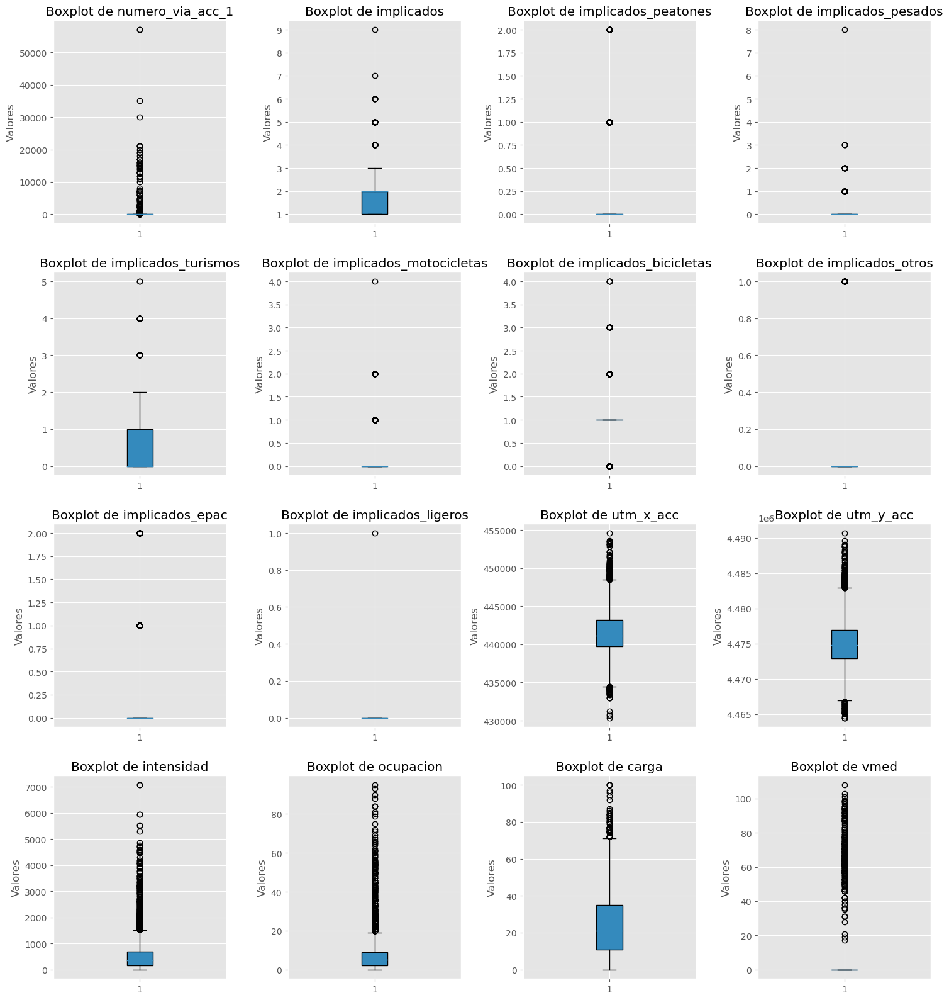

In [54]:
# Selecciona solo las columnas numéricas
numeric_columns = df_accidentes[['numero_via_acc_1', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'utm_x_acc', 'utm_y_acc', 'intensidad', 'ocupacion', 'carga', 'vmed']] 



# Define el número de columnas en cada fila de subplots
num_cols_per_row = 4

# Calcula el número total de filas necesarias para acomodar las variables
num_rows = int(np.ceil(len(numeric_columns.columns) / num_cols_per_row))

# Crea la matriz de subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols_per_row, figsize=(15, 4 * num_rows))

# Itera a través de las columnas numéricas y crea boxplots en los subplots
for i, column in enumerate(numeric_columns.columns):
    row = i // num_cols_per_row
    col = i % num_cols_per_row
    ax = axes[row, col]
    ax.boxplot(numeric_columns[column].values, patch_artist=True)
    ax.set_title(f'Boxplot de {column}')
    ax.set_ylabel('Valores')

# Asegura que los subplots vacíos no se muestren
for i in range(len(numeric_columns.columns), num_rows * num_cols_per_row):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

## B Distribución, estadísticos y representación de variables
La primera celda es para cargar el fichero, si no se ha ejecutado el código desde el principio

In [390]:
# Se carga el fichero, solo si no se ha cargado anteriormente
df_accidentes = pd.read_csv('./Datasets/accidentes_eda_2019_2023_v2.csv', delimiter=';', encoding='latin-1')

### B.1. Comprobación de nulos

In [391]:
# Como paso previo a analizar las distintas variables, se vuelve a comprobar la existencia de nulos en el conjunto de datos
df_accidentes.isnull().sum()[df_accidentes.isnull().sum()>0]

Series([], dtype: int64)

### B.2. Creación de la columna gravedad

La variable objetivo es la lesividad de los accidentes con implicación de bicicletas
En primera instancia, dicha variable categórica ordinal puede tomar 9 valores distintos
* 01: Atención en urgencias sin posterior ingreso. - LEVE
* 02: Ingreso inferior o igual a 24 horas - LEVE
* 03: Ingreso superior a 24 horas. - GRAVE
* 04: Fallecido 24 horas - FALLECIDO
* 05: Asistencia sanitaria ambulatoria con posterioridad - LEVE
* 06: Asistencia sanitaria inmediata en centro de salud o mutua - LEVE
* 07: Asistencia sanitaria sólo en el lugar del accidente - LEVE
* 14: Sin asistencia sanitaria
* 77: Se desconoce

De cara a analizar los datos, se van a tener en cuenta tanto las 9 categorías, como una segunda variable, llamada "gravedad" en la cual solo habrá dos opciones posibles: 0 para accidentes LEVES (cod_lesividad igual a 01, 02, 05, 06, 07, 14 o 77) y 1 pra accidentes GRAVES (cod_lesividad igual a 03 o 04)

Orden propuesto:

Sin asistencia sanitaria
Asistencia sanitaria sólo en el lugar del accidente
Asistencia sanitaria inmediata en centro de salud o mutua
Atención en urgencias sin posterior ingreso
Asistencia sanitaria ambulatoria con posterioridad
Ingreso inferior o igual a 24 horas
Ingreso superior a 24 horas
Fallecido 24 horas

In [392]:
df_accidentes['gravedad'] = df_accidentes['cod_lesividad'].apply(lambda x: 1 if (x == 3) | (x == 4) else 0)

In [393]:
# Frecuencia de aparición de cada una de las categorías de gravedad
df_accidentes['gravedad'].value_counts()*100/df_accidentes['lesividad'].count()

0    96.30102
1     3.69898
Name: gravedad, dtype: float64

In [394]:
# Frecuencia de aparición de cada una de las categorías de lesividad
df_accidentes['lesividad'].value_counts()*100/df_accidentes['lesividad'].count()

Asistencia sanitaria sólo en el lugar del accidente          31.938776
Sin asistencia sanitaria                                     24.566327
Ingreso inferior o igual a 24 horas                          15.586735
Atención en urgencias sin posterior ingreso                  11.556122
Asistencia sanitaria inmediata en centro de salud o mutua     8.826531
Asistencia sanitaria ambulatoria con posterioridad            3.826531
Ingreso superior a 24 horas                                   3.596939
Fallecido 24 horas                                            0.102041
Name: lesividad, dtype: float64

Fuente: https://www.kaggle.com/code/codename007/home-credit-complete-eda-feature-importance?scriptVersionId=3949647&cellId=53

In [395]:
temp = df_accidentes['gravedad'].value_counts()
df = pd.DataFrame({'labels': ['leve','grave'],
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Gravedad de los accidentes')


Se observa que el conjunto de datos está desbalanceado para ambas variables. Posteriormente se estudiarán las alternativas para aforntar los problemas que puede conllevar esto ante el modelo de clasificación.

A continuación, se van a analizar cómo afectan el resto de variables sobre las variables de lesividad y gravedad. Se va a relacionar con:
* Fecha del accidente: día (var. numérica discreta), mes (var. numérica discreta), mes-año (var. categórica ordinal), año (var. numérica discreta), día de la semana (var. numérica discreta), hora (var. numérica discreta), momento del día (var. categórica ordinal)
* Localización del accidente: tipo de vía (var. categórica nominal), vía (var. categórica nominal), barrio (var. categórica nominal), distrito (var. categórica nominal), número de policia (var. numérica discreta), cruce (var. categórica nominal)
* Tipo de accidente (var. categórica nominal)
* Estado meteorológico (var. categórica nominal)
* Tipo de vehículo (var. categórica nominal)
* Tipo de persona (var. categórica nominal)
* Rango de edad (var. categórica ordinal)
* Sexo (var. categórica nominal)
* Positivo en alcohol (var. categórica nominal)
* Positivo en droga (var. categórica nominal)
* Tráfico de la vía: tipo de elemento de medida (var. categórica nominal), intensidad (var. numérica continua), ocupación (var. numérica continua), carga (var. numérica continua), velocidad media (var. numérica continua)
* **Tipo de ruta** (var. categórica nominal)
* **Implicados** en el accidente (var. nominal continua), tanto totales como segregados por bicicletas, ligeros, turismos, peatones, pesados y otros

### B.3. Análisis de variables univariante, bivariante y multivariante

Fuente: https://www.kaggle.com/code/vipin07/heart-disease-eda-fe-resam-xgboost#EXPLORATORY-DATA-ANALYSIS

* Univariate Analysis: We'll inspect each variable individually to understand its distribution and potential outliers. This will provide insights into the characteristics of each variable and help identify any extreme values or anomalies.

* Bivariate Analysis: We'll explore the relationship between each variable and the target variables (Heart_Disease, Skin_Cancer, Other_Cancer, Diabetes). This analysis will allow us to understand how each variable is associated with the presence or absence of these diseases. We can use techniques like bar charts to visualize the distributions of the target variables based on different categories or levels of other variables.

*  Multivariate Analysis: We'll study the interactions between different variables and how they collectively relate to the target variables. This analysis will help us uncover complex relationships and patterns that may not be apparent in the univariate or bivariate analyses. Techniques such as scatter plots, correlation matrices, and 3D visualizations can be utilized to gain deeper insights into the data.


In [396]:
df_accidentes.columns

Index(['num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc',
       'numero_acc', 'clase_via_acc_1', 'nombre_via_acc_1', 'numero_via_acc_1',
       'geometry', 'cod_distrito', 'nom_distrito', 'nom_barrio', 'cod_barrio',
       'cod_disbar', 'tipo_ruta', 'tipo_accidente', 'estado_meteorologico',
       'tipo_vehiculo', 'tipo_persona', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'rango_edad', 'sexo', 'cod_lesividad',
       'lesividad', 'utm_x_acc', 'utm_y_acc', 'positiva_alcohol',
       'positiva_droga', 'fecha_hora_med', 'id_pmed_mas_cercano',
       'tipo_elem_pmed', 'intensidad', 'ocupacion', 'carga', 'vmed', 'error',
       'periodo_integracion', 'cod_cent_pmed', 'nombre_pmed', 'utm_x_pmed',
       'utm_y_pmed', 'COD_NDP', 'COD_VIA', 'cruce', 'gravedad'],
      dtype='object')

#### B.3.1. Fecha de accidente
Se analizará:
* mes-año (var. categórica ordinal),
* año (var. numérica discreta),
* mes (var. numérica discreta),
* día de la semana (var. numérica discreta),
* día (var. numérica discreta),
* hora (var. numérica discreta),
* momento del día (var. categórica ordinal)

In [397]:
# Se convierte el campo de fecha_acc a formato datetime
df_accidentes['fecha_acc'] = pd.to_datetime(df_accidentes['fecha_acc'], format="%d/%m/%Y")

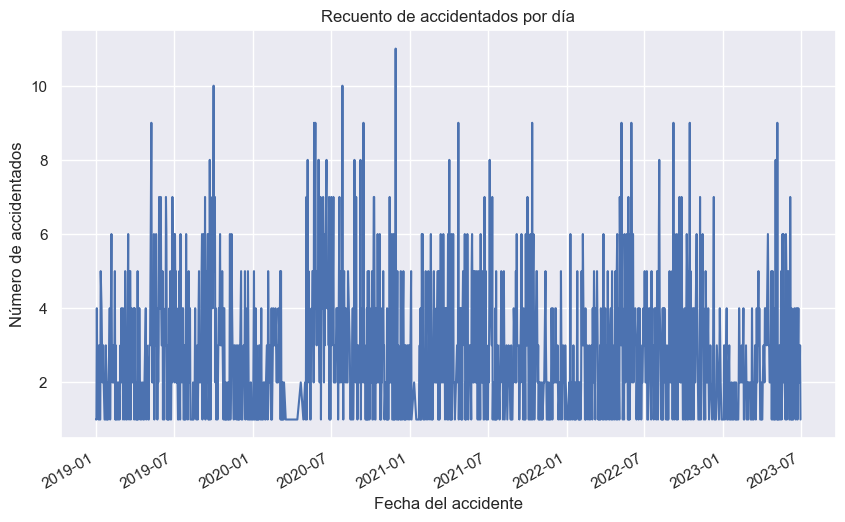

In [398]:
df_accidentes.groupby(by=['fecha_acc']).size().plot(figsize=(10,6))
plt.title('Recuento de accidentados por día')
plt.xlabel('Fecha del accidente')
plt.ylabel('Número de accidentados')
plt.show()

##### Mes-año

In [399]:
# Crear una nueva columna para el mes y el año
df_accidentes['mes_año'] = df_accidentes['fecha_acc'].dt.strftime("%Y-%m")
df_accidentes['mes_año'] = pd.to_datetime(df_accidentes['mes_año'])
accidentes_por_mes = pd.DataFrame(df_accidentes.groupby('mes_año').agg({'num_expediente': "nunique"}))

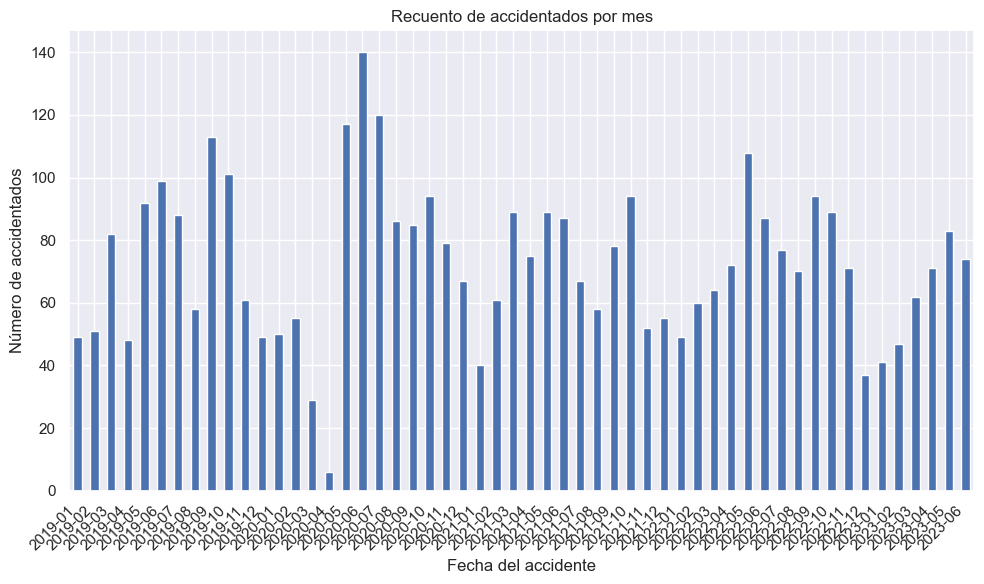

In [400]:
ax = df_accidentes.groupby(by=['mes_año']).size().plot(kind='bar', figsize=(10,6))
# Formatear el eje X para mostrar solo año-mes
# Obtener las etiquetas actuales del eje X
labels = [item.get_text() for item in ax.get_xticklabels()]

# Formatear las etiquetas para mostrar solo año-mes
new_labels = [label[:7] for label in labels]  # Tomar los primeros 7 caracteres (año-mes)
ax.set_xticklabels(new_labels, rotation=45, ha='right')  # Rotar y ajustar las etiquetas

plt.title('Recuento de accidentados por mes')
plt.xlabel('Fecha del accidente')
plt.ylabel('Número de accidentados')
plt.tight_layout()
plt.show()

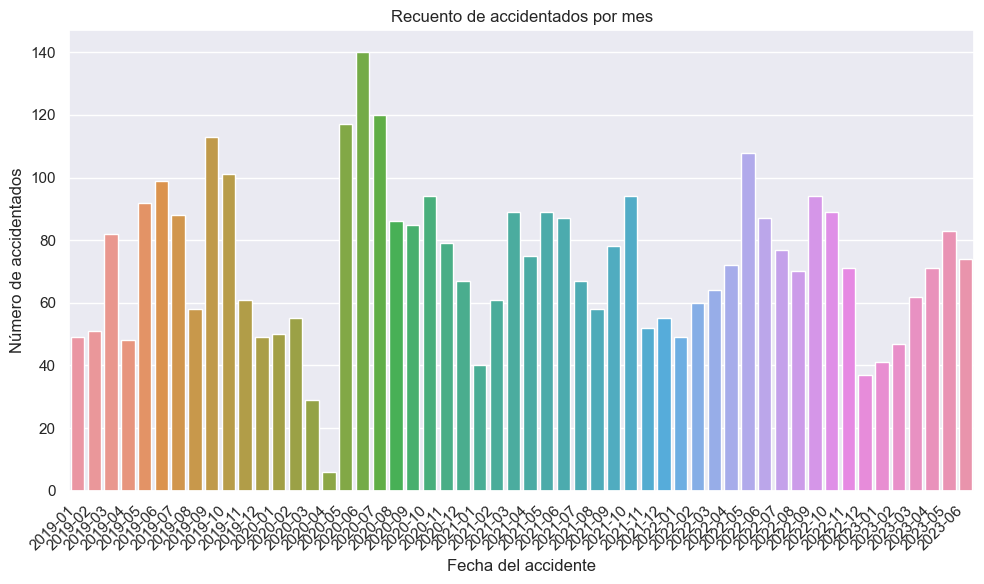

In [401]:
# Recuento de valores
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df_accidentes.sort_values(by='mes_año'), x='mes_año')

labels = [item.get_text() for item in ax.get_xticklabels()]

# Formatear las etiquetas para mostrar solo año-mes
new_labels = [label[:7] for label in labels]  # Tomar los primeros 7 caracteres (año-mes)
ax.set_xticklabels(new_labels, rotation=45, ha='right')  # Rotar y ajustar las etiquetas

plt.title('Recuento de accidentados por mes')
plt.xlabel('Fecha del accidente')
plt.ylabel('Número de accidentados')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

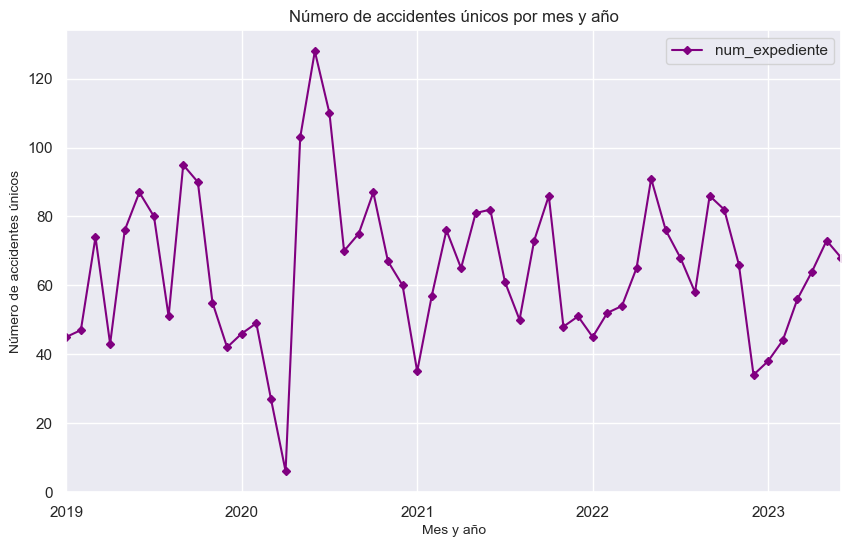

In [402]:
accidentes_por_mes.plot(marker='D', color='purple', linestyle='-', markersize=4, label='Accidentes únicos', figsize=(10, 6))
plt.xlabel('Mes y año', fontsize=10)
plt.ylabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por mes y año')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend()

#plt.tight_layout()
plt.show()

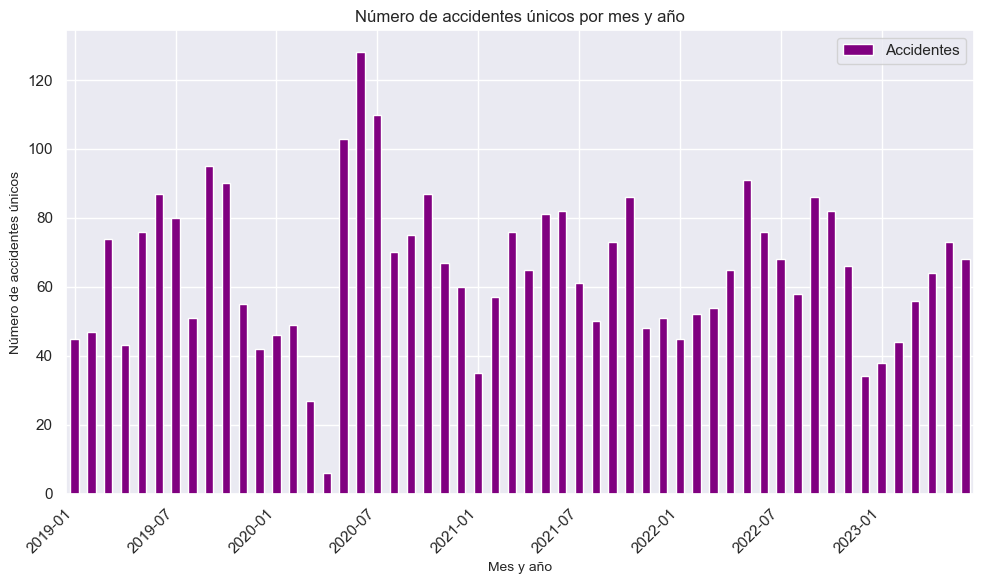

In [403]:
ax = accidentes_por_mes.plot(kind='bar', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.xlabel('Mes y año', fontsize=10)
plt.ylabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por mes y año')

labels = [item.get_text() for item in ax.get_xticklabels()]

# Formatear las etiquetas para mostrar solo año-mes
new_labels = [label[:7] for label in labels]  # Tomar los primeros 7 caracteres (año-mes)
ax.set_xticklabels(new_labels, rotation=45, ha='right')  # Rotar y ajustar las etiquetas

# Mostrar etiquetas en el eje X cada 6 meses
ticks_every_6_months = [label for i, label in enumerate(new_labels) if i % 6 == 0]
ax.set_xticks(range(0, len(new_labels), 6))
ax.set_xticklabels(ticks_every_6_months, rotation=45, ha='right')

# Cambiar el label de la leyenda
ax.legend(["Accidentes"])

plt.xlabel('Mes y año', fontsize=10)
plt.ylabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por mes y año')
plt.tight_layout()
plt.show()

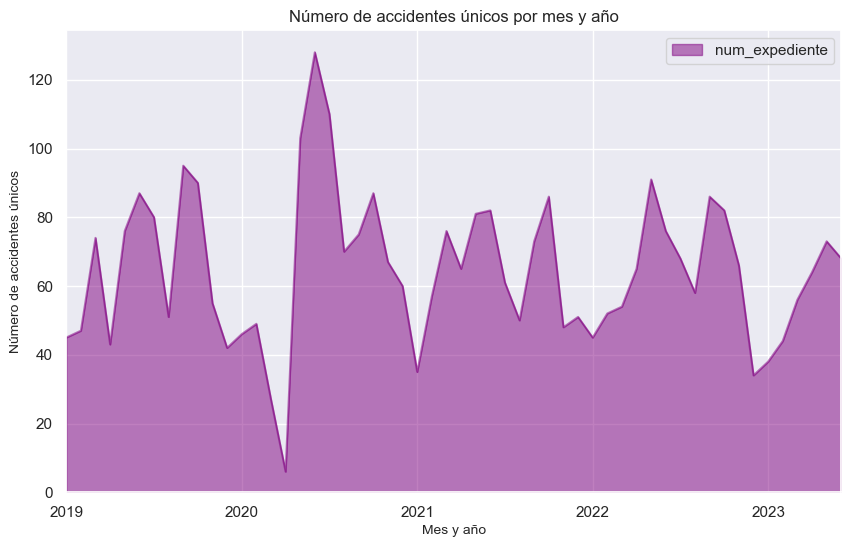

In [404]:
accidentes_por_mes.plot.area(color='purple', alpha=0.5, linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.xlabel('Mes y año', fontsize=10)
plt.ylabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por mes y año')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend()

#plt.tight_layout()
plt.show()

In [405]:
accidentes_por_lesividad_mes = pd.DataFrame(df_accidentes.groupby(['mes_año','lesividad']).agg({'num_expediente': "nunique"}).unstack()).droplevel(level=0, axis=1)

In [406]:
# Se ordenan las columnas de mayor número de accidentes a menos
accidentes_por_lesividad_mes = accidentes_por_lesividad_mes[df_accidentes.groupby(['lesividad']).agg({'num_expediente': "nunique"}).sort_values(by="num_expediente", ascending=False).index]

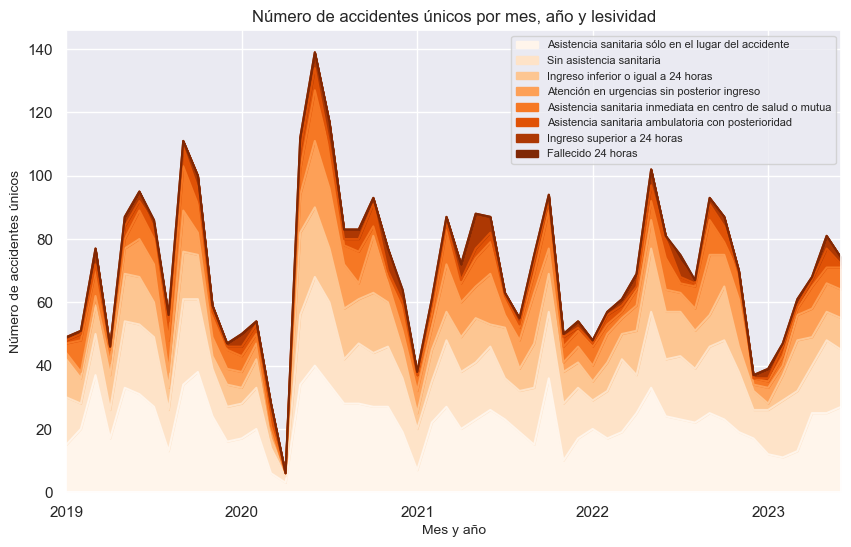

In [407]:
accidentes_por_lesividad_mes.plot.area(figsize=(10, 6), colormap='Oranges')
plt.xlabel('Mes y año', fontsize=10)
plt.ylabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por mes, año y lesividad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

#plt.tight_layout()
plt.show()

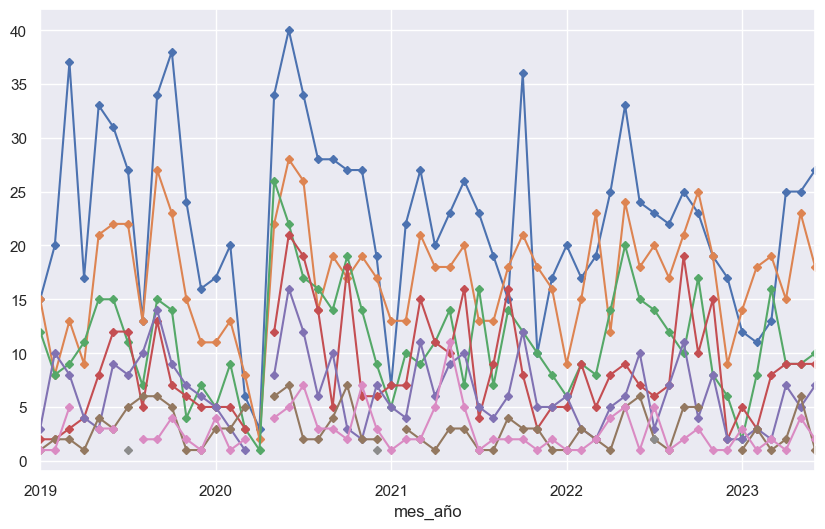

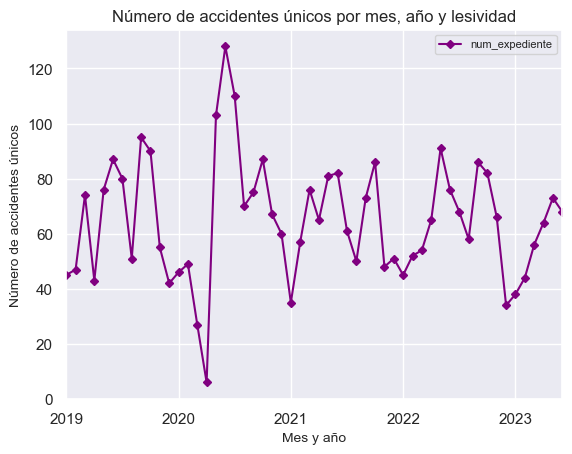

In [408]:
plt.figure(figsize=(10, 6))
for lesividad in accidentes_por_lesividad_mes.columns:
    accidentes_por_lesividad_mes[lesividad].plot(marker='D', linestyle='-', markersize=4, label=lesividad)
accidentes_por_mes.plot(marker='D', color='purple', linestyle='-', markersize=4, label='Total accidentes únicos')
plt.xlabel('Mes y año', fontsize=10)
plt.ylabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por mes, año y lesividad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

#plt.tight_layout()
plt.show()


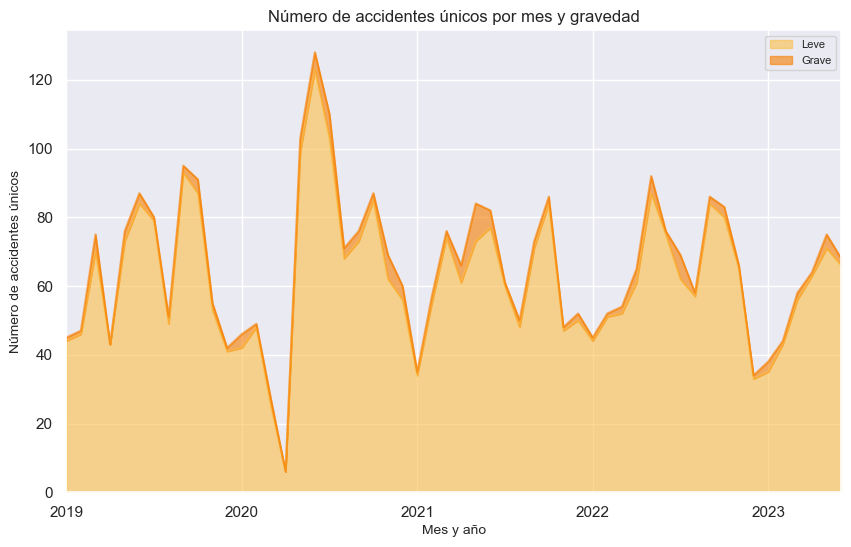

In [409]:
accidentes_por_gravedad_mes = pd.DataFrame(df_accidentes.groupby(['mes_año','gravedad']).agg({'num_expediente': "nunique"}).unstack()).droplevel(level=0, axis=1)
accidentes_por_gravedad_mes.columns = ['Leve', 'Grave']

accidentes_por_gravedad_mes.plot.area(figsize=(10, 6), color=['#fcbf4999','#f77f0099'])
plt.xlabel('Mes y año', fontsize=10)
plt.ylabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por mes y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

#plt.tight_layout()
plt.show()

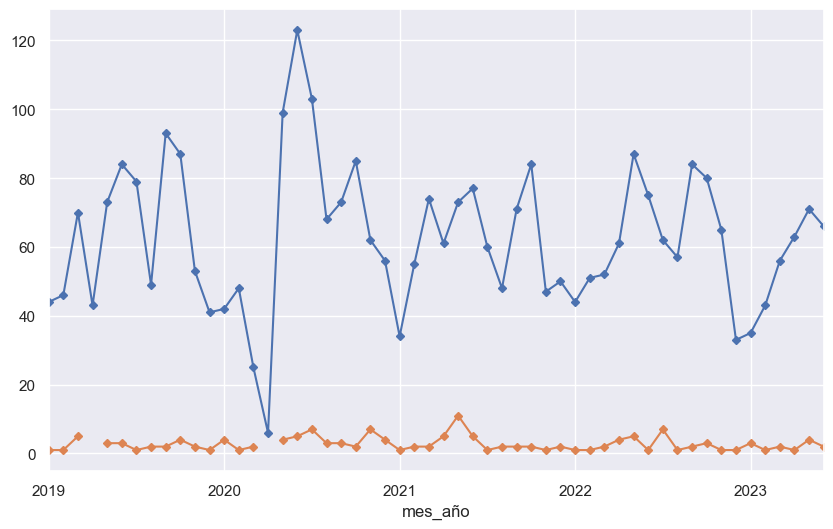

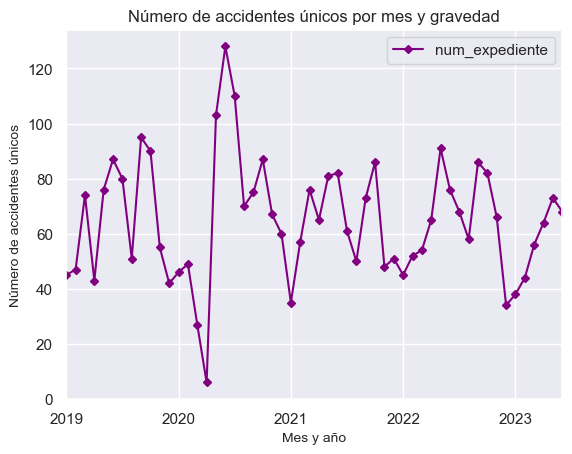

In [410]:
plt.figure(figsize=(10, 6))
for gravedad in accidentes_por_gravedad_mes.columns:
    accidentes_por_gravedad_mes[gravedad].plot(marker='D', linestyle='-', markersize=4, label=('Accidentes leves' if gravedad==0 else 'Accidentes graves'))
accidentes_por_mes.plot(marker='D', color='purple', linestyle='-', markersize=4, label='Total accidentes')
plt.xlabel('Mes y año', fontsize=10)
plt.ylabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por mes y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend()

plt.show()


##### Año

In [411]:
# Crear una nueva columna para el año
df_accidentes['año'] = df_accidentes['fecha_acc'].dt.year

In [412]:
df_accidentes.groupby(by='año').size()#.iloc[0:4].mean()

año
2019    891
2020    928
2021    845
2022    878
2023    378
dtype: int64

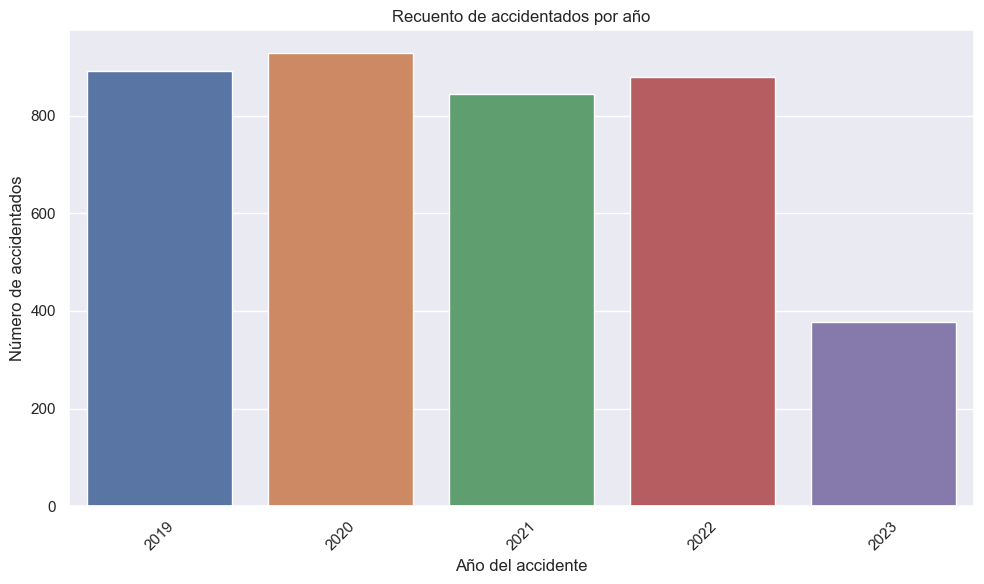

In [413]:
# Recuento de valores
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df_accidentes.sort_values(by='año'), x='año')

labels = [item.get_text() for item in ax.get_xticklabels()]

# Formatear las etiquetas para mostrar solo año-mes
# new_labels = [label[:7] for label in labels]  # Tomar los primeros 7 caracteres (año-mes)
# ax.set_xticklabels(new_labels, rotation=45, ha='right')  # Rotar y ajustar las etiquetas

plt.title('Recuento de accidentados por año')
plt.xlabel('Año del accidente')
plt.ylabel('Número de accidentados')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

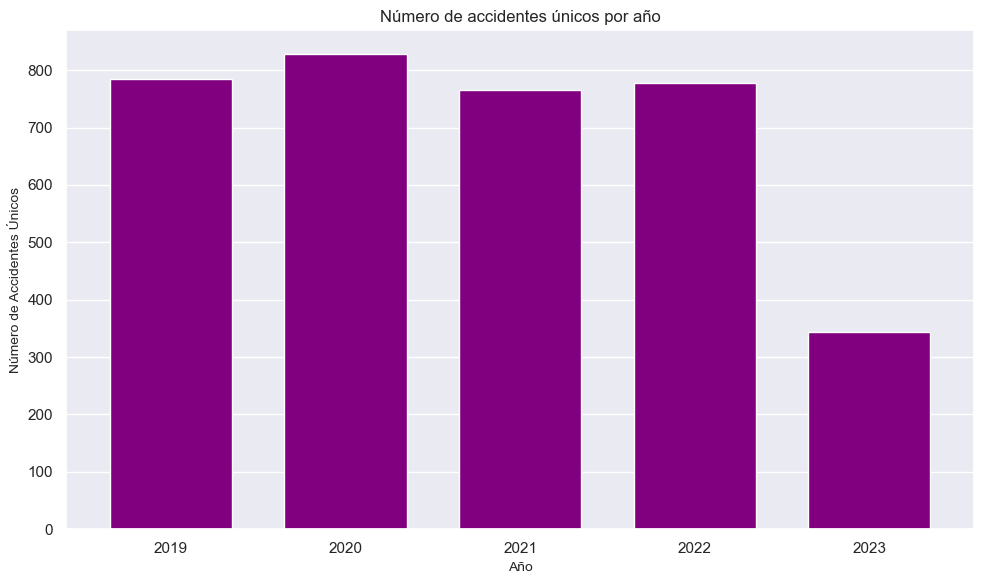

In [414]:
# Realizar el conteo de accidentes únicos por año
accidentes_por_año = df_accidentes.groupby('año')['num_expediente'].nunique()

# Crear el gráfico de barras utilizando matplotlib
plt.figure(figsize=(10, 6))
accidentes_por_año.plot(kind='bar', color='purple', width=0.7)
plt.xlabel('Año', fontsize=10)
plt.ylabel('Número de Accidentes Únicos', fontsize=10)
plt.title('Número de accidentes únicos por año')
plt.xticks(rotation=0)
plt.grid(axis='x')

# zip joins x and y coordinates in pairs
for x,y in zip(accidentes_por_año.index,accidentes_por_año):

    label = "{:.0f}".format(y)

    plt.annotate(label, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 color='black',
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center

plt.tight_layout()
plt.show()

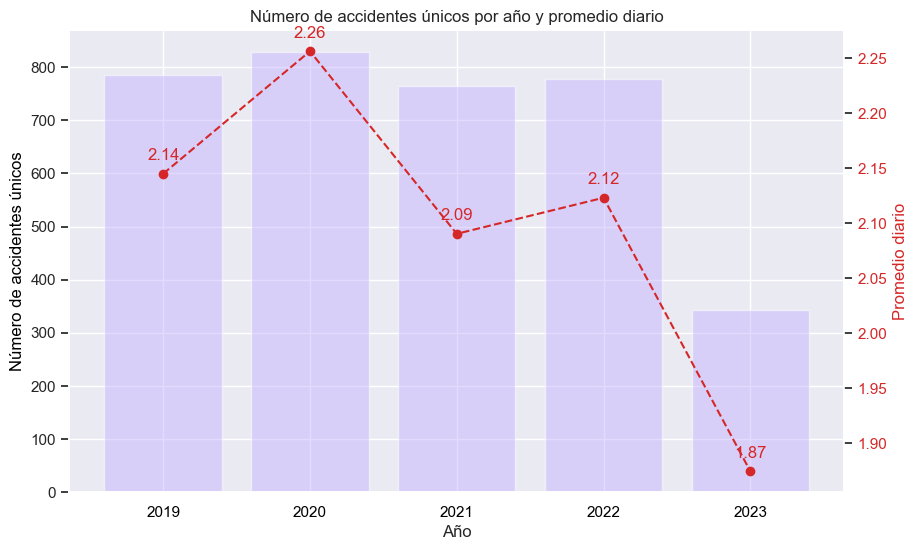

In [415]:
# Calcular el conteo de accidentes únicos por año
accidentes_por_año = df_accidentes.groupby('año')['num_expediente'].nunique()

# Calcular el promedio de accidentes por año considerando el último día con datos
promedio_accidentes_por_año = []

for año in accidentes_por_año.index:
    ultimo_mes_año = df_accidentes[df_accidentes['año'] == año]['fecha_acc'].max().month
    ultimo_dia_año = pd.Timestamp(year=año, month=ultimo_mes_año, day=1) + pd.DateOffset(days=31)
    total_accidentes_año = accidentes_por_año[año]
    dias_año = (ultimo_dia_año - pd.to_datetime(f'{año}-01-01')).days + 1
    promedio_accidentes = total_accidentes_año / dias_año
    promedio_accidentes_por_año.append(promedio_accidentes)

# Crear el gráfico de barras con línea promedio
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:blue'
ax1.set_xlabel('Año')
ax1.set_ylabel('Número de accidentes únicos', color='black')
ax1.bar(accidentes_por_año.index, accidentes_por_año, color='#c8b6ff', alpha=0.5, width=0.8)
ax1.tick_params(axis='x', labelcolor='black')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.plot(accidentes_por_año.index, promedio_accidentes_por_año, color=color, linestyle='--', marker='o', label='Promedio')
ax2.set_ylabel('Promedio diario', color=color)
ax2.tick_params(axis='y', labelcolor=color)

# zip joins x and y coordinates in pairs
for x,y in zip(accidentes_por_año.index,promedio_accidentes_por_año):

    label = "{:.2f}".format(y)

    plt.annotate(label, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 color='tab:red',
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center

#fig.tight_layout()
plt.title('Número de accidentes únicos por año y promedio diario')
plt.grid(False)
#fig.legend(loc="upper left", bbox_to_anchor=(0.1, 0.9))
plt.show()


##### Mes

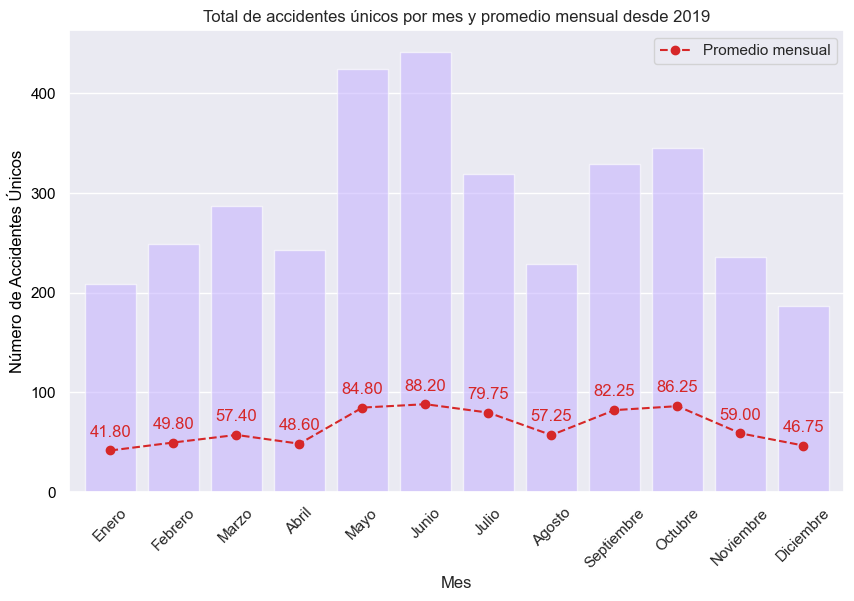

In [416]:
# Cambiar la configuración regional a español
locale.setlocale(locale.LC_TIME, 'es_ES.UTF-8')

# Crear una nueva columna para el año y mes
df_accidentes['año'] = df_accidentes['fecha_acc'].dt.year
df_accidentes['mes'] = df_accidentes['fecha_acc'].dt.month

# Calcular el recuento de accidentes por mes y año
accidentes_por_mes_y_año = df_accidentes.groupby(['año', 'mes'])['num_expediente'].nunique().reset_index()

# Calcular el recuento promedio de accidentes por mes
promedio_accidentes_por_mes = accidentes_por_mes_y_año.groupby('mes')['num_expediente'].mean().reset_index()

# Crear el gráfico de barras con línea promedio
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'black'
accidentes_por_mes_y_año.groupby('mes')['num_expediente'].sum().plot(kind='bar', ax=ax1, color='#c8b6ff', alpha=0.6, width=0.8)
ax1.set_xlabel('Mes')
ax1.set_ylabel('Número de Accidentes Únicos', color=color)
ax1.tick_params(axis='y', labelcolor=color)
plt.xticks(rotation=0)
plt.xticks(promedio_accidentes_por_mes['mes']-1, [calendar.month_name[i].capitalize() for i in promedio_accidentes_por_mes['mes']], rotation=45)

linea_promedio, = ax1.plot(promedio_accidentes_por_mes.index, promedio_accidentes_por_mes['num_expediente'], color='tab:red', linestyle='--', marker='o', label='Promedio')
ax1.legend([linea_promedio], ['Promedio mensual'], loc="upper right")

# zip joins x and y coordinates in pairs
for x,y in zip(promedio_accidentes_por_mes.index,promedio_accidentes_por_mes.num_expediente):

    label = "{:.2f}".format(y)

    plt.annotate(label, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 color='tab:red',
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center

plt.title('Total de accidentes únicos por mes y promedio mensual desde 2019')
plt.grid(axis='x')
plt.show()

In [417]:
# Se calcula un dataframe con todos los meses y años entre la fecha mínima y máxima de df_accidentes

# Obtener la fecha mínima y máxima de la columna 'fecha_acc'
fecha_minima = df_accidentes['fecha_acc'].min()
fecha_maxima = df_accidentes['fecha_acc'].max()

# Generar las fechas de inicio de mes entre la fecha mínima y máxima
fechas_meses = pd.date_range(start=fecha_minima.replace(day=1), end=fecha_maxima.replace(day=1), freq='MS')

# Crear el DataFrame con las columnas adecuadas
df_mesano = pd.DataFrame({'año': fechas_meses.year, 'mes': fechas_meses.month, 'num_expediente': 0})

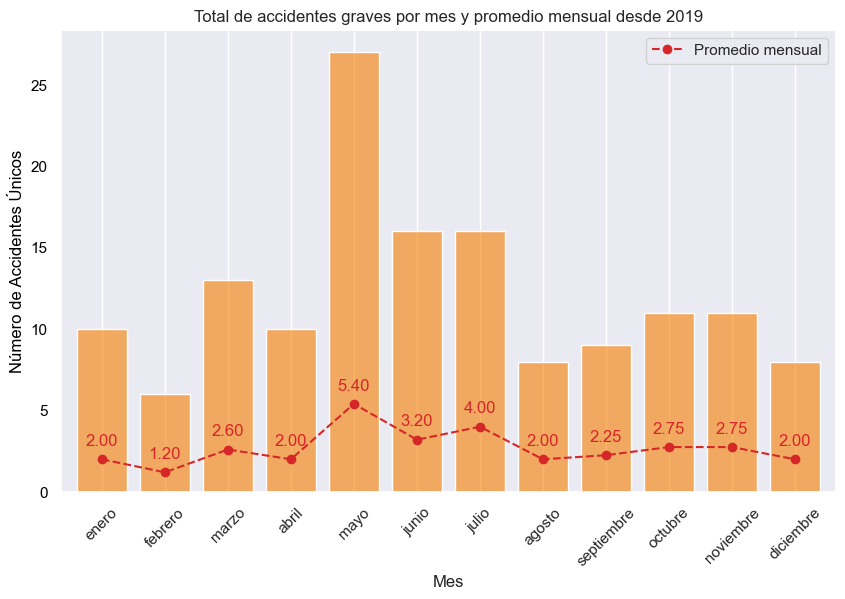

In [418]:
# Cambiar la configuración regional a español
locale.setlocale(locale.LC_TIME, 'es_ES.UTF-8')

df_accidentes_mod = df_accidentes[df_accidentes['gravedad']==1]

# Crear una nueva columna para el año y mes
df_accidentes_mod.loc[:,'año'] = df_accidentes_mod['fecha_acc'].dt.year
df_accidentes_mod.loc[:,'mes'] = df_accidentes_mod['fecha_acc'].dt.month

# Calcular el recuento de accidentes por mes y año
accidentes_por_mes_y_año = df_accidentes_mod.groupby(['año', 'mes'])['num_expediente'].nunique().reset_index()

# Se añaden las filas que puedan faltar, que se debe a que no hay accidentes para esas fechas
# Filtrar las filas de df_mesano que no están en accidentes_por_mes_y_año según 'año' y 'mes'
filtro = ~df_mesano[['año', 'mes']].apply(tuple, axis=1).isin(accidentes_por_mes_y_año[['año', 'mes']].apply(tuple, axis=1))
df2_nuevas_filas = df_mesano[filtro]

# Concatenar accidentes_por_mes_y_año con las nuevas filas de df_mesano
accidentes_por_mes_y_año = pd.concat([accidentes_por_mes_y_año, df2_nuevas_filas]).sort_values(by=['año','mes'], ignore_index=True)

# Calcular el recuento promedio de accidentes por mes
promedio_accidentes_por_mes = accidentes_por_mes_y_año.groupby('mes')['num_expediente'].mean().reset_index()

# Crear el gráfico de barras con línea promedio
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:blue'
accidentes_por_mes_y_año.groupby('mes')['num_expediente'].sum().plot(kind='bar', ax=ax1, color='#f77f0099', width=0.8)
ax1.set_xlabel('Mes')
ax1.set_ylabel('Número de Accidentes Únicos', color='black')
ax1.tick_params(axis='y', labelcolor='black')
plt.xticks(rotation=0)
plt.xticks(promedio_accidentes_por_mes['mes']-1, [calendar.month_name[i] for i in promedio_accidentes_por_mes['mes']], rotation=45)

linea_promedio, = ax1.plot(promedio_accidentes_por_mes.index, promedio_accidentes_por_mes['num_expediente'], color='tab:red', linestyle='--', marker='o', label='Promedio')
ax1.legend([linea_promedio], ['Promedio mensual'], loc="upper right")


# zip joins x and y coordinates in pairs
for x,y in zip(promedio_accidentes_por_mes.index,promedio_accidentes_por_mes.num_expediente):

    label = "{:.2f}".format(y)

    plt.annotate(label, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 color='tab:red',
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center

plt.title('Total de accidentes graves por mes y promedio mensual desde 2019')
plt.grid(axis='y')
plt.show()


In [419]:
# Filtrar las filas de df2 que no están en df1 según 'año' y 'mes'
filtro = ~df_mesano[['año', 'mes']].apply(tuple, axis=1).isin(accidentes_por_mes_y_año[['año', 'mes']].apply(tuple, axis=1))
df2_nuevas_filas = df_mesano[filtro]

# Concatenar df1 con las nuevas filas de df2
df_resultado = pd.concat([accidentes_por_mes_y_año, df2_nuevas_filas]).sort_values(by=['año','mes'], ignore_index=True)

df_resultado

,año,mes,num_expediente
0,2019,1,1
1,2019,2,1
2,2019,3,5
3,2019,4,0
4,2019,5,3
5,2019,6,3
6,2019,7,1
7,2019,8,2
8,2019,9,2
9,2019,10,4


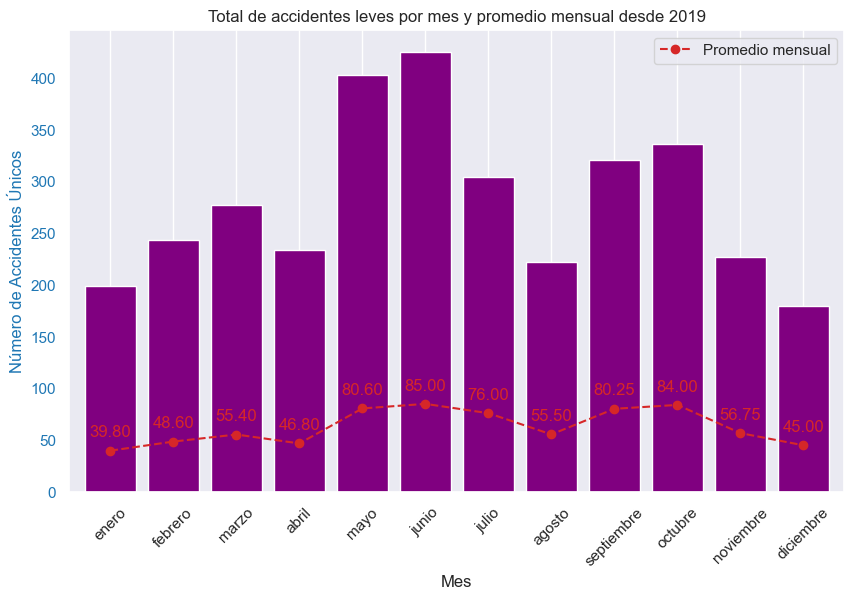

In [420]:
# Cambiar la configuración regional a español
locale.setlocale(locale.LC_TIME, 'es_ES.UTF-8')

df_accidentes_mod = df_accidentes[df_accidentes['gravedad']==0]

# Crear una nueva columna para el año y mes
df_accidentes_mod.loc[:,'año'] = df_accidentes_mod['fecha_acc'].dt.year
df_accidentes_mod.loc[:,'mes'] = df_accidentes_mod['fecha_acc'].dt.month

# Calcular el recuento de accidentes por mes y año
accidentes_por_mes_y_año = df_accidentes_mod.groupby(['año', 'mes'])['num_expediente'].nunique().reset_index()

# Se añaden las filas que puedan faltar, que se debe a que no hay accidentes para esas fechas
# Filtrar las filas de df_mesano que no están en accidentes_por_mes_y_año según 'año' y 'mes'
filtro = ~df_mesano[['año', 'mes']].apply(tuple, axis=1).isin(accidentes_por_mes_y_año[['año', 'mes']].apply(tuple, axis=1))
df2_nuevas_filas = df_mesano[filtro]

# Concatenar accidentes_por_mes_y_año con las nuevas filas de df_mesano
accidentes_por_mes_y_año = pd.concat([accidentes_por_mes_y_año, df2_nuevas_filas]).sort_values(by=['año','mes'], ignore_index=True)

# Calcular el recuento promedio de accidentes por mes
promedio_accidentes_por_mes = accidentes_por_mes_y_año.groupby('mes')['num_expediente'].mean().reset_index()

# Crear el gráfico de barras con línea promedio
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:blue'
accidentes_por_mes_y_año.groupby('mes')['num_expediente'].sum().plot(kind='bar', ax=ax1, color='purple', width=0.8)
ax1.set_xlabel('Mes')
ax1.set_ylabel('Número de Accidentes Únicos', color=color)
ax1.tick_params(axis='y', labelcolor=color)
plt.xticks(rotation=0)
plt.xticks(promedio_accidentes_por_mes['mes']-1, [calendar.month_name[i] for i in promedio_accidentes_por_mes['mes']], rotation=45)

linea_promedio, = ax1.plot(promedio_accidentes_por_mes.index, promedio_accidentes_por_mes['num_expediente'], color='tab:red', linestyle='--', marker='o', label='Promedio')
ax1.legend([linea_promedio], ['Promedio mensual'], loc="upper right")



# zip joins x and y coordinates in pairs
for x,y in zip(promedio_accidentes_por_mes.index,promedio_accidentes_por_mes.num_expediente):

    label = "{:.2f}".format(y)

    plt.annotate(label, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 color='tab:red',
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center

plt.title('Total de accidentes leves por mes y promedio mensual desde 2019')
plt.grid(axis='y')
plt.show()


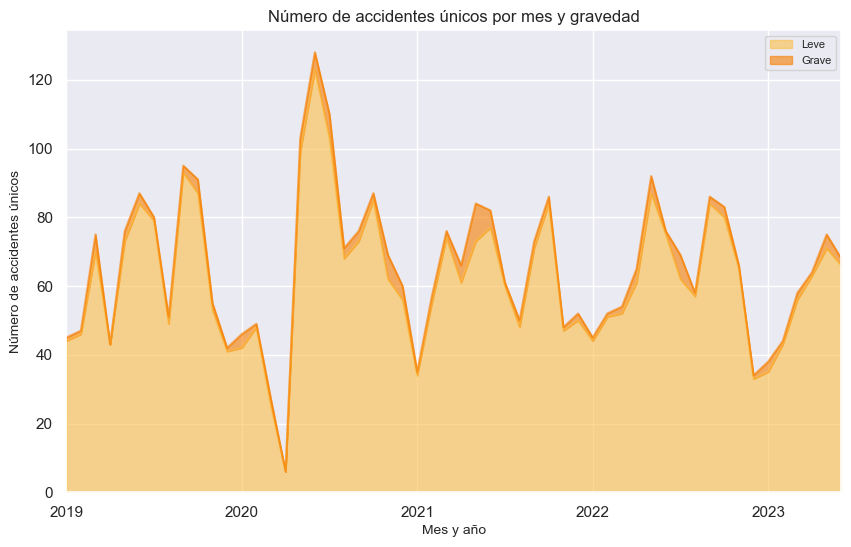

In [421]:
accidentes_por_gravedad_mes = pd.DataFrame(df_accidentes.groupby(['mes_año','gravedad']).agg({'num_expediente': "nunique"}).unstack()).droplevel(level=0, axis=1)
accidentes_por_gravedad_mes.columns = ['Leve', 'Grave']

accidentes_por_gravedad_mes.plot.area(figsize=(10, 6), color=['#fcbf4999','#f77f0099'])
plt.xlabel('Mes y año', fontsize=10)
plt.ylabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por mes y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

#plt.tight_layout()
plt.show()

##### Día de la semana

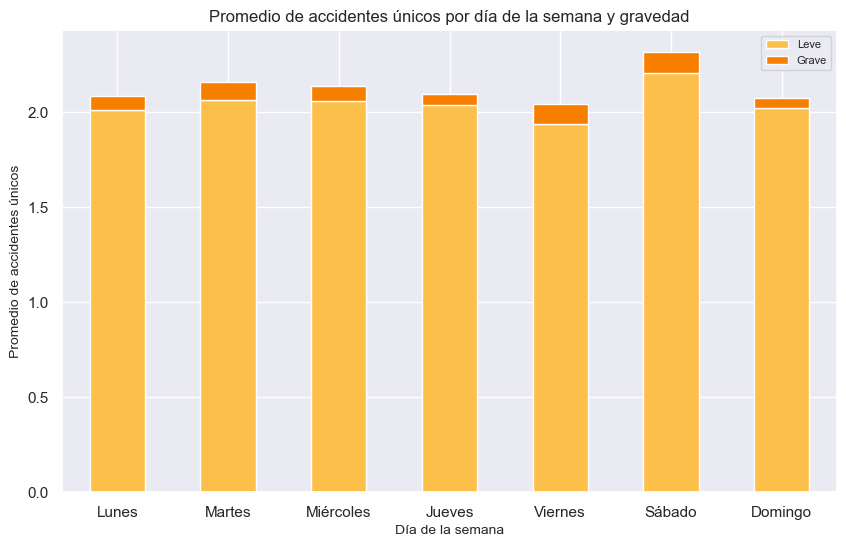

In [422]:
# Obtener los nombres de los días de la semana en español
dias_semana = [d.encode('latin1').decode('utf-8').capitalize() for d in calendar.day_name]

# Extraer el día de la semana y crear una nueva columna
df_accidentes['dia_semana'] = df_accidentes['fecha_acc'].dt.dayofweek.map(lambda x: dias_semana[x])

# Calcular el promedio de accidentes únicos por día de la semana y gravedad
total_por_dia_gravedad = df_accidentes.drop_duplicates('num_expediente').groupby(['dia_semana', 'gravedad'])['num_expediente'].count()
total_por_dia_gravedad.unstack(level=1).reindex(dias_semana)

# Se calcula el número de días de cada día de la semana en el dataframe
# Obtener la fecha mínima y máxima de la columna 'fecha_acc'
fecha_minima = df_accidentes['fecha_acc'].min()
fecha_maxima = df_accidentes['fecha_acc'].max()

# Calcular el número de días de cada día de la semana en el rango de fechas
dias_por_semana = {dia: 0 for dia in dias_semana}

for fecha in pd.date_range(start=fecha_minima, end=fecha_maxima):
    dia_semana = fecha.weekday()  # 0: lunes, 1: martes, ..., 6: domingo
    dias_por_semana[dias_semana[dia_semana]] += 1

# Crear una Serie de Pandas con los días de la semana en español como índice y el número de días como valores
serie_dias_por_semana = pd.Series(dias_por_semana, name='fecha_acc')
serie_dias_por_semana.index.name = 'dia_semana'
serie_dias_por_semana

# Calcular el promedio de accidentes por día de la semana y gravedad
promedio_por_dia_gravedad = (total_por_dia_gravedad / serie_dias_por_semana).unstack(level=1).reindex(dias_semana)
promedio_por_dia_gravedad.columns = ['Leve', 'Grave']

promedio_por_dia_gravedad.plot.bar(figsize=(10, 6), stacked=True, color=['#fcbf49','#f77f00'])
plt.xlabel('Día de la semana', fontsize=10)
plt.ylabel('Promedio de accidentes únicos', fontsize=10)
plt.title('Promedio de accidentes únicos por día de la semana y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

#plt.tight_layout()
plt.show()


In [423]:
promedio_por_dia_gravedad
#total_por_dia_gravedad.unstack(level=1).reindex(dias_semana)

,Leve,Grave
dia_semana,,
Lunes,2.012821,0.072650
Martes,2.063830,0.093617
Miércoles,2.059574,0.076596
Jueves,2.038298,0.059574
Viernes,1.936170,0.106383
Sábado,2.205128,0.111111
Domingo,2.021368,0.055556


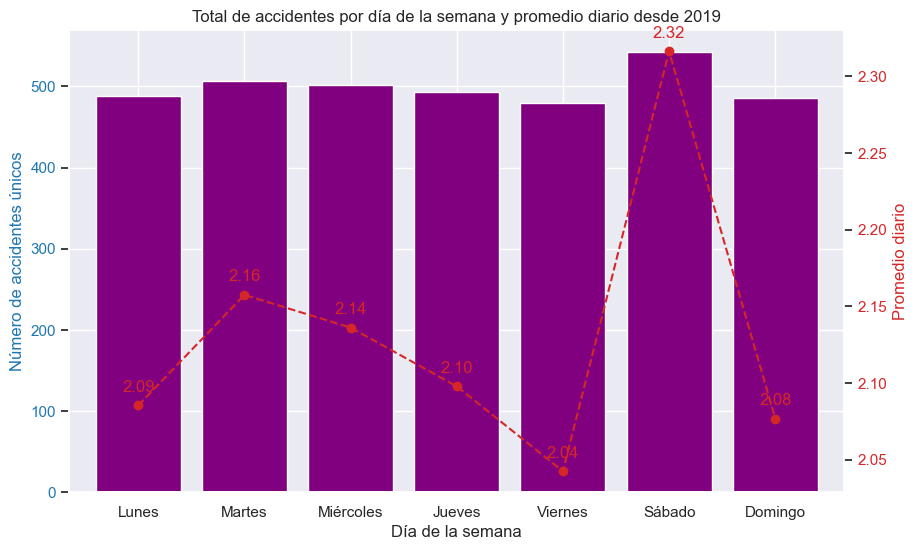

In [424]:
# Obtener los nombres de los días de la semana en español
# dias_semana = [d.encode('latin1').decode('utf-8').capitalize() for d in calendar.day_name]

# Extraer el día de la semana y crear una nueva columna
# df_accidentes['dia_semana'] = df_accidentes['fecha_acc'].dt.dayofweek.map(lambda x: dias_semana[x])

# Calcular el promedio de accidentes únicos por día de la semana
total_por_dia = df_accidentes.drop_duplicates('num_expediente').groupby('dia_semana')['num_expediente'].count().reindex(dias_semana)

# Calcular el promedio de accidentes por día de la semana
promedio_por_dia = total_por_dia / serie_dias_por_semana

# Crear el gráfico de barras con línea promedio
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:blue'
total_por_dia.plot(kind='bar', ax=ax1, color='purple', width=0.8)
ax1.set_xlabel('Día de la semana')
ax1.set_ylabel('Número de accidentes únicos', color=color)
ax1.tick_params(axis='y', labelcolor=color)
plt.xticks(rotation=0)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.plot(promedio_por_dia.index, promedio_por_dia, color=color, linestyle='--', marker='o', label='Promedio')
ax2.set_ylabel('Promedio diario', color=color)
ax2.tick_params(axis='y', labelcolor=color)


# zip joins x and y coordinates in pairs
for x,y in zip(promedio_por_dia.index,promedio_por_dia):

    label = "{:.2f}".format(y)

    plt.annotate(label, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 color='tab:red',
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center

plt.title('Total de accidentes por día de la semana y promedio diario desde 2019')
plt.grid(False)
plt.show()


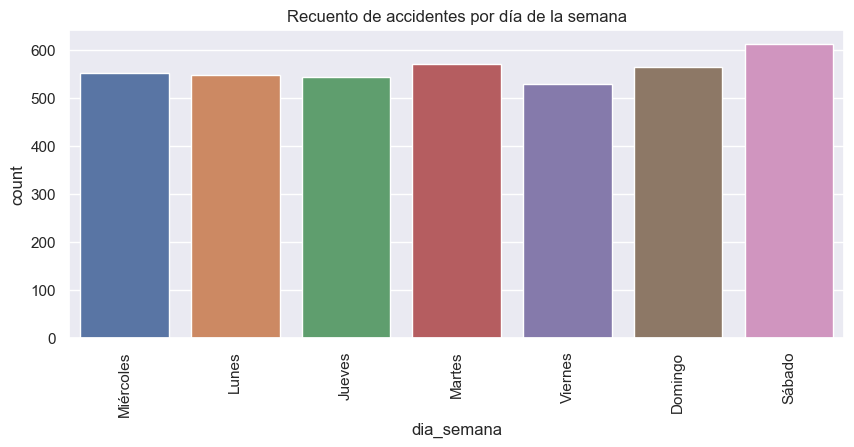

In [425]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes, x='dia_semana')
plt.title('Recuento de accidentes por día de la semana')
plt.xticks(rotation=90)
plt.show()

##### Día del mes

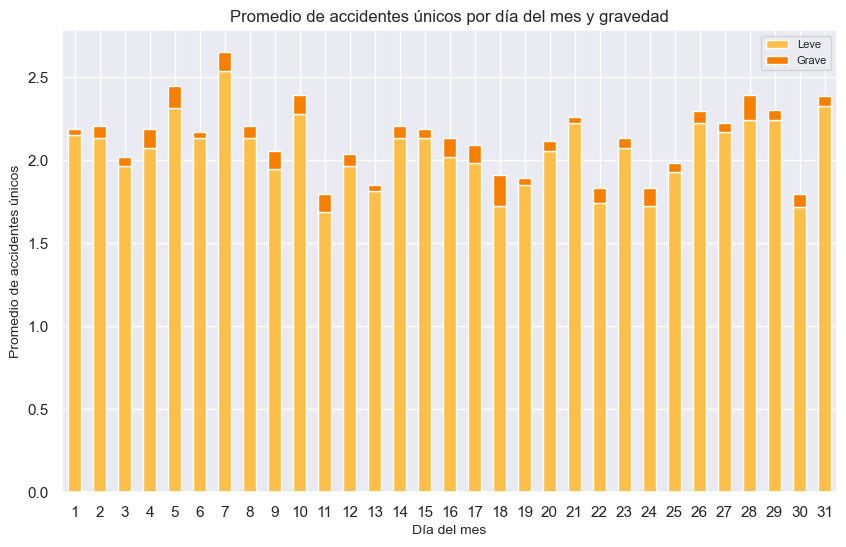

In [426]:
# Obtener los días del mes
dias_mes = list(range(1,32))

# Extraer el día del mes y crear una nueva columna
df_accidentes['dia_mes'] = df_accidentes['fecha_acc'].dt.day

# Calcular el promedio de accidentes únicos por día de la semana y gravedad
total_por_dia_mes_gravedad = df_accidentes.drop_duplicates('num_expediente').groupby(['dia_mes', 'gravedad'])['num_expediente'].count()
total_por_dia_mes_gravedad.unstack(level=1).reindex(dias_mes)

# Se calcula el número de días de cada día del mes en el dataframe
# Obtener la fecha mínima y máxima de la columna 'fecha_acc'
fecha_minima = df_accidentes['fecha_acc'].min()
fecha_maxima = df_accidentes['fecha_acc'].max()

# Calcular el número de días de cada día del mes en el rango de fechas
dias_por_mes = {dia: 0 for dia in dias_mes}

for fecha in pd.date_range(start=fecha_minima, end=fecha_maxima):
    dia_mes = fecha.day
    dias_por_mes[dias_mes[dia_mes-1]] += 1

# Crear una Serie de Pandas con los días del mes como índice y el número de días como valores
serie_dias_por_mes = pd.Series(dias_por_mes, name='fecha_acc')
serie_dias_por_mes.index.name = 'dia_mes'
serie_dias_por_mes

# Calcular el promedio de accidentes por día del mes y gravedad
promedio_por_dia_mes_gravedad = (total_por_dia_mes_gravedad / serie_dias_por_mes).unstack(level=1).reindex(dias_mes)
promedio_por_dia_mes_gravedad.columns = ['Leve', 'Grave']

promedio_por_dia_mes_gravedad.plot.bar(figsize=(10, 6), stacked=True, color=['#fcbf49','#f77f00'])
plt.xlabel('Día del mes', fontsize=10)
plt.ylabel('Promedio de accidentes únicos', fontsize=10)
plt.title('Promedio de accidentes únicos por día del mes y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

#plt.tight_layout()
plt.show()

In [427]:
promedio_por_dia_mes_gravedad

,Leve,Grave
dia_mes,,
1,2.148148,0.037037
2,2.129630,0.074074
3,1.962963,0.055556
4,2.074074,0.111111
5,2.314815,0.129630
6,2.129630,0.037037
7,2.537037,0.111111
8,2.129630,0.074074
9,1.944444,0.111111


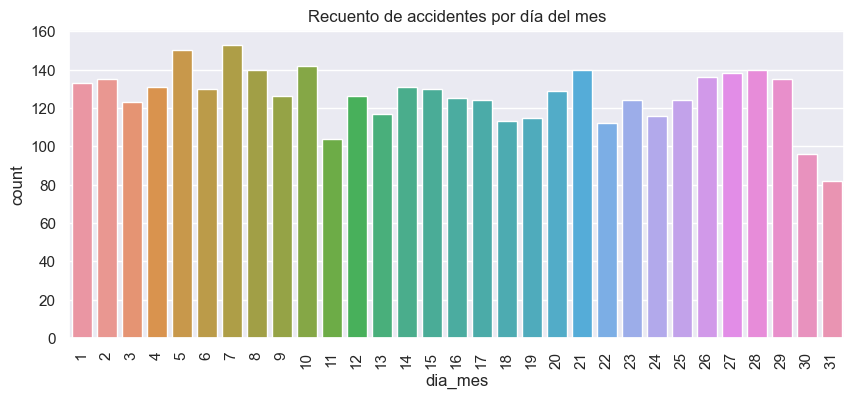

In [428]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes, x='dia_mes')
plt.title('Recuento de accidentes por día del mes')
plt.xticks(rotation=90)
plt.show()

##### Hora

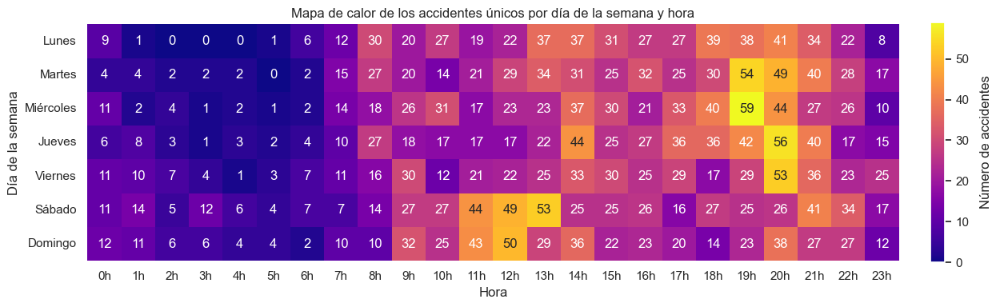

In [429]:
# Convertir la columna 'hora_acc' al formato de tiempo
df_accidentes['hora_acc'] = pd.to_datetime(df_accidentes['hora_acc'], format='%H:%M:%S')

# Extraer solo la hora de la columna 'hora_acc'
df_accidentes['hora_solo_acc'] = df_accidentes['hora_acc'].dt.hour

heatmap_pt = df_accidentes.drop_duplicates(['num_expediente']).pivot_table(columns='hora_solo_acc', index='dia_semana', aggfunc='size', fill_value=0).reindex(dias_semana)

# Si hay alguna hora que no tiene registros, se crea la columna vacía
for i in range(0,24):
    if i not in heatmap_pt.columns:
       heatmap_pt[i] = 0
heatmap_pt = heatmap_pt[list(range(24))]

fig, ax = plt.subplots(figsize=(15,4))

sns.set()
ax = sns.heatmap(heatmap_pt, cmap="plasma", annot=True, square=True, cbar=False)

# Cambiar etiquetas del eje X (horas)
horas_etiquetas = [f"{hora}h" for hora in range(24)]
ax.set_xticklabels(horas_etiquetas, rotation=0)

plt.xlabel('Hora')
plt.ylabel('Día de la semana')
plt.title('Mapa de calor de los accidentes únicos por día de la semana y hora')

plt.tight_layout() 

# Ajustar tamaño de la barra de colores
cbar_ax = fig.add_axes([0.88, 0.16, 0.012, 0.75])  # Ajusta los valores según tus preferencias
cbar = fig.colorbar(ax.collections[0], cax=cbar_ax)
cbar.set_label('Número de accidentes', fontsize=12, loc="center", labelpad=10)

plt.show()

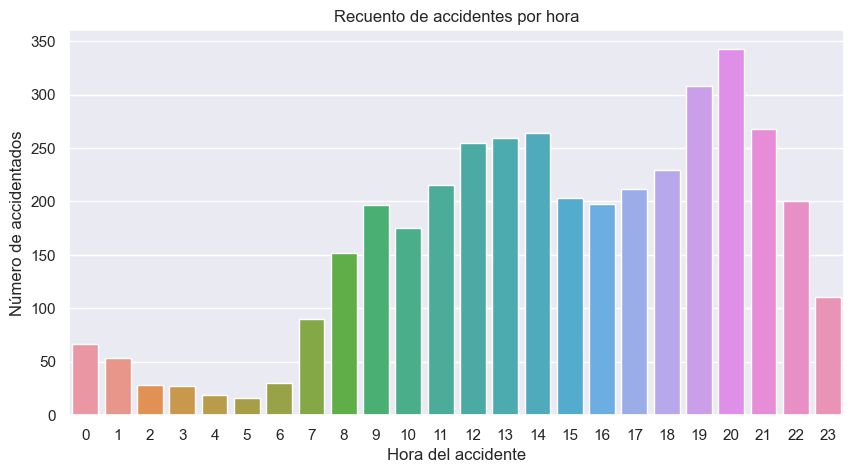

In [430]:
plt.figure(figsize=(10, 5))
sns.countplot(data=df_accidentes, x='hora_solo_acc')
plt.title('Recuento de accidentes por hora')
plt.ylabel('Número de accidentados')
plt.xlabel('Hora del accidente')
plt.xticks(rotation=0)
plt.show()

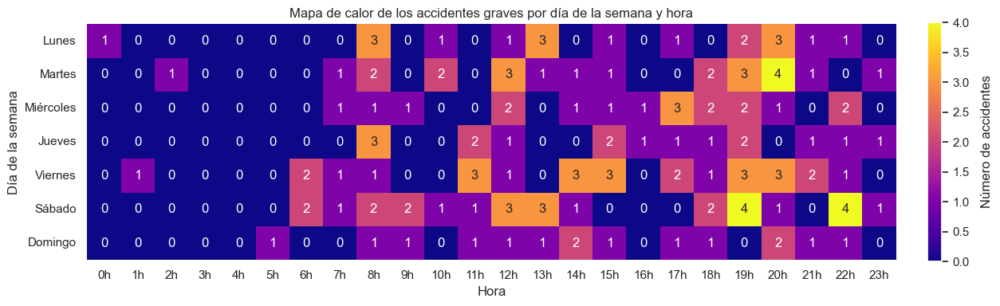

In [431]:
# Convertir la columna 'hora_acc' al formato de tiempo
df_accidentes['hora_acc'] = pd.to_datetime(df_accidentes['hora_acc'], format='%H:%M:%S')

# Extraer solo la hora de la columna 'hora_acc'
df_accidentes['hora_solo_acc'] = df_accidentes['hora_acc'].dt.hour

heatmap_pt = df_accidentes[df_accidentes.gravedad==1].drop_duplicates(['num_expediente']).pivot_table(columns='hora_solo_acc', index='dia_semana', aggfunc='size', fill_value=0).reindex(dias_semana)

# Si hay alguna hora que no tiene registros, se crea la columna vacía
for i in range(0,24):
    if i not in heatmap_pt.columns:
       heatmap_pt[i] = 0
heatmap_pt = heatmap_pt[list(range(24))]

fig, ax = plt.subplots(figsize=(15,4))

sns.set()
ax = sns.heatmap(heatmap_pt, cmap="plasma", annot=True, square=True, cbar=False)

# Cambiar etiquetas del eje X (horas)
horas_etiquetas = [f"{hora}h" for hora in range(24)]
ax.set_xticklabels(horas_etiquetas, rotation=0)

plt.xlabel('Hora')
plt.ylabel('Día de la semana')
plt.title('Mapa de calor de los accidentes graves por día de la semana y hora')

plt.tight_layout() 

# Ajustar tamaño de la barra de colores
cbar_ax = fig.add_axes([0.88, 0.16, 0.012, 0.75])  # Ajusta los valores según tus preferencias
cbar = fig.colorbar(ax.collections[0], cax=cbar_ax)
cbar.set_label('Número de accidentes', fontsize=12, loc="center", labelpad=10)

plt.show()

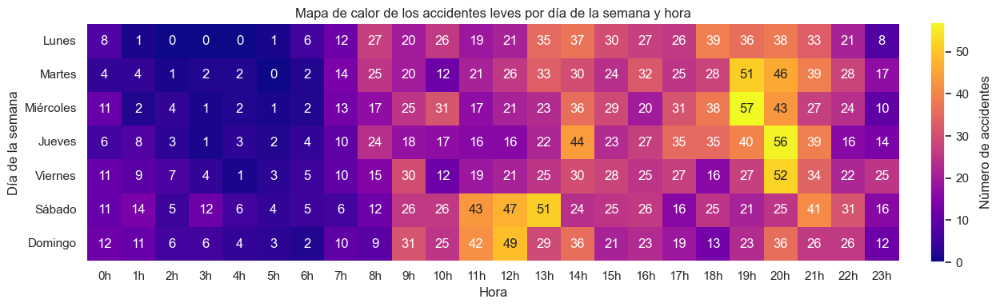

In [432]:
# Convertir la columna 'hora_acc' al formato de tiempo
df_accidentes['hora_acc'] = pd.to_datetime(df_accidentes['hora_acc'], format='%H:%M:%S')

# Extraer solo la hora de la columna 'hora_acc'
df_accidentes['hora_solo_acc'] = df_accidentes['hora_acc'].dt.hour

heatmap_pt = df_accidentes[df_accidentes.gravedad==0].drop_duplicates(['num_expediente']).pivot_table(columns='hora_solo_acc', index='dia_semana', aggfunc='size', fill_value=0).reindex(dias_semana)

fig, ax = plt.subplots(figsize=(15,4))

sns.set()
ax = sns.heatmap(heatmap_pt, cmap="plasma", annot=True, square=True, cbar=False)

# Cambiar etiquetas del eje X (horas)
horas_etiquetas = [f"{hora}h" for hora in range(24)]
ax.set_xticklabels(horas_etiquetas, rotation=0)

plt.xlabel('Hora')
plt.ylabel('Día de la semana')
plt.title('Mapa de calor de los accidentes leves por día de la semana y hora')

plt.tight_layout() 

# Ajustar tamaño de la barra de colores
cbar_ax = fig.add_axes([0.88, 0.16, 0.012, 0.75])  # Ajusta los valores según tus preferencias
cbar = fig.colorbar(ax.collections[0], cax=cbar_ax)
cbar.set_label('Número de accidentes', fontsize=12, loc="center", labelpad=10)

plt.show()

Se observa que el año más accidentado fue el 2020, impactado por la pandemia. En los primeros meses de 2020 se produjo una caída súbita de los accidentes a causa del confinamiento, situación que se revertió a mitad de año con la relajación de las medidas y las ventanas de deporte que se habilitaron a ciertas horas y que provocaron grandes concentraciones en las calles de gente practicando algún deporte. Esta gran cantidad de gente fue posiblemente el detonante de tal incremento de accidentes, si bien es cierto que la mayoría fueron leves.
Respecto a la estacionalidad de los accidentes, se aprecia que el número de accidentes sufre altibajos, llegando al máximo normalmente en septiembre-octubre y al mínimo en agosto, periodo de vacaciones por excelencia. Se intuye que las temperaturas pueden estar detrás de los accidentes, y es que en los periodos más extremos (verano e invierno) hay menos accidentes que en primavera y otoño.
El mes con más accidentes graves fue en mayo de 2021, con 11 accidentados graves.
En términos medios, el número de accidentados al año ronda los 885, siendo el año con más accidentes el 2020 y el que menos, el 2021. Si se calcula el número de accidentes promedio diario, se obtiene que el presente año presenta un tasa de 1,81 accidentes al día, un -14,6 % YoY. No obstante, hay que tener en cuenta que los meses en que más accidentes se producen son septiembre y octubre. Aún así, comparando solo los 6 primeros meses de cada año, 2023 presenta una variación del -14% YoY (df_accidentes[df_accidentes.mes.isin(range(1,7))].groupby(by='año').size())

Con respecto a los meses, sin tener en cuenta el año, es junio el mes con más accidentes, si bien está sesgado por el impacto de la pandemia. Después de este, el mes con más accidente es mayo, octubre, septiembre y julio. Con diferencia, los meses con menos accidentes, casi la mitad del máximo mensual, son enero, diciembre y agosto. Si se presta atención a los accidentes graves, el peor mes es mayo (5,4 accidentes graves de media a mes), seguido de julio (4 acc. graves/mes) y junio (3,5 acc. graves/mes). El mes con menor número de accidentes graves es febrero, con una media de 1,2 accidentes/mes.

Poniendo el foco en el día de la semana, el sábado es el día con más accidentes, con un promedio de 2,3 accidentes/día (8,7% más que el promedio), mientras que el día con menos accidentes es el viernes, con un -4,1% menos que el promedio. Conviene destacar que el día con más accidentes graves con diferencia es el sábado y el viernes, con un 35,2% y un 29,4% más que el promedio, respectivamente. Por el contrario, los días con menos accidentes son los domingos (-32,4% vs promedio) y jueves (-27,% vs promedio).
Aunque menos notorio, el día del mes con más accidentes es el 7, tanto totales como leves, algo más de un 23% más que el promedio/día. En el caso de accidentes graves, es el día 18 el que presenta peores cifras, con un 126% más que el promedio diario. Respecto a los días más seguros, en términos generales son los días 11 (-15,8% vs promedio diario), y el 1, 6, 13, 19 y 21 para accidentes graves (-54,8% vs promedio diario).

En lo que atañe a la hora del día con más accidentes, esta es las 20h, posiblemente relacionada con las peores condiciones de visibilidad de las vías y el aumento de tráfico de riders de comida y de gente que vuelve a casa del trabajo. Las horas con menos accidentes son desde las 23h hasta las 6h. El segundo pico con más accidentes es a las 14h, hora coincidentes con las comidas, y por tanto, con mayor tráfico de riders. Si se combina la hora con el día de la semana, que observan varias tendencias: entre semana, el mayor número de accidentes se concentran a las 19-20h de la tarde, y en segundo lugar, entre las 13-15h, ambas ventanas correspondientes a las horas de cena y comida, respectivamente. También es reseñable el número de accidentes entre las 8-9h, hora habitual de desplazamiento al puesto de trabajo. Los fines de semana, los mayores picos de accidentes se producen entre las 11h y las 13h, y luego entre las 20h y las 22h. En este caso, se debe en parte a un perfil de ciclistas que práctican deporte los fines de semana por la mañana. Al mediodia, y por la noche, el perfil de los accidentados se presupone distinto, relacionado más con los repartidores de comida a domicilio. También es destacable el aumento de la accidentalidad en las madrugadas del viernes, sábado y domingo, relacionado con la gente que vuelve a casa después del ocio nocturno. Si se analiza la lesividad de los accidentes, los accidentes más graves se concentran entre semana entre las 19 y 20h (hora de reparto de cena), a las 8h (desplazamiento al trabajo) y de 11h a 13h (horario de trabajo), y también los viernes a partir de las 14h hasta las 22h, y los sábados al mediodía y a partir de las 19h. Respecto a los accidentes leves, también se producen las tardes entre semana y los fines de semana por la mañana hasta al mediodía, y también por la noche aunque en menor medida.
En resumen, y respecto al momento del día, se puede afirmar que la mayoría de accidentes se producen por la noche y por la tarde, respectando esta tendencia tanto los accidentes leves como los graves.

##### Momento del día

In [433]:
# Se crea el campo momento_dia_acc
df_accidentes['momento_dia_acc'] = df_accidentes['hora_solo_acc'].apply(
    lambda x: 'Madrugada' if (x>=0) & (x<6) else
    'Mañana' if (x>=6) & (x<12) else
    'Tarde' if (x>=12) & (x<18) else 'Noche')

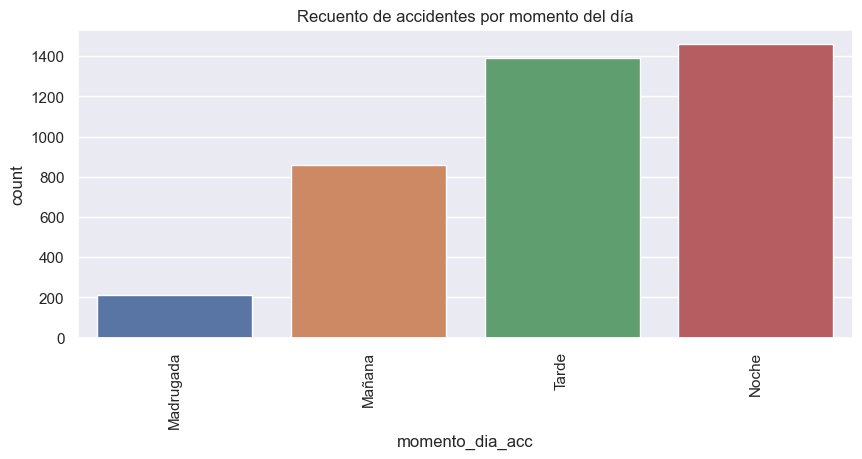

In [434]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes.sort_values(by=['hora_solo_acc']), x='momento_dia_acc')
plt.title('Recuento de accidentes por momento del día')
plt.xticks(rotation=90)
plt.show()

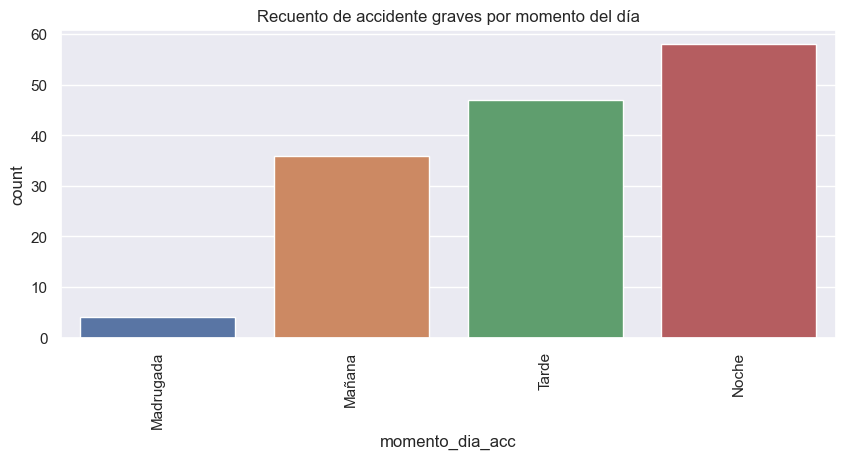

In [435]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes[df_accidentes['gravedad']==1].sort_values(by=['hora_solo_acc']), x='momento_dia_acc')
plt.title('Recuento de accidente graves por momento del día')
plt.xticks(rotation=90)
plt.show()

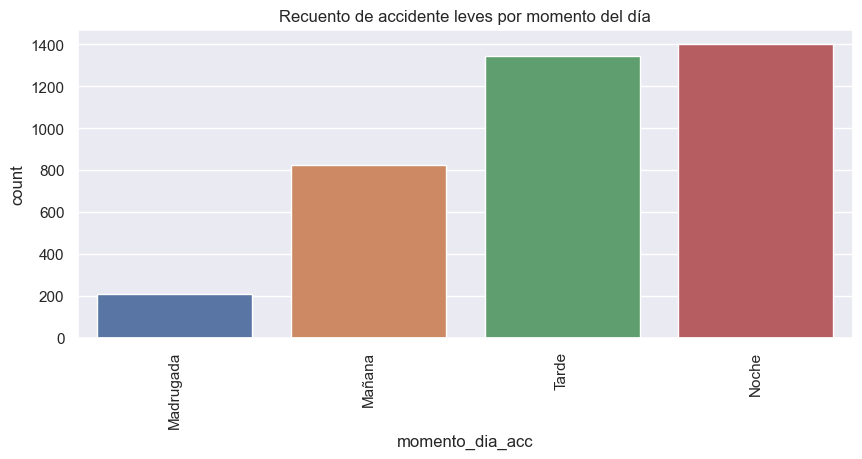

In [436]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes[df_accidentes['gravedad']==0].sort_values(by=['hora_solo_acc']), x='momento_dia_acc')
plt.title('Recuento de accidente leves por momento del día')
plt.xticks(rotation=90)
plt.show()

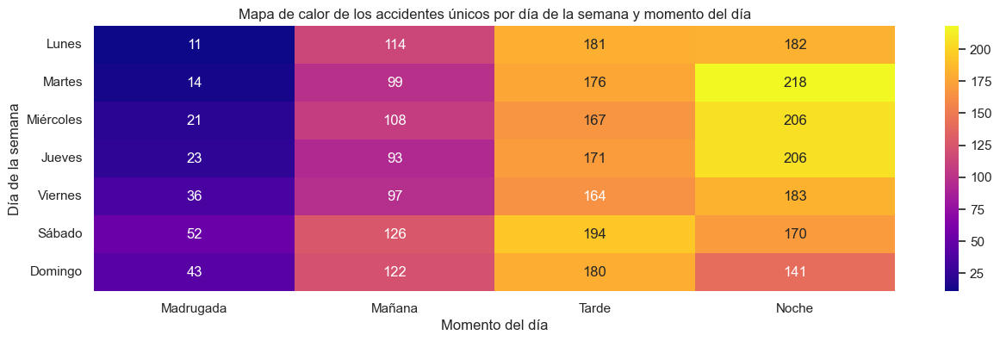

In [437]:
heatmap_pt = df_accidentes.drop_duplicates(['num_expediente']).pivot_table(columns='momento_dia_acc', index='dia_semana', aggfunc='size', fill_value=0).reindex(dias_semana)[['Madrugada','Mañana','Tarde','Noche']]

fig, ax = plt.subplots(figsize=(15,4))

sns.set()
ax = sns.heatmap(heatmap_pt, cmap="plasma", annot=True, fmt=".0f")

plt.xticks(rotation=0)
plt.xlabel('Momento del día')
plt.ylabel('Día de la semana')
plt.title('Mapa de calor de los accidentes únicos por día de la semana y momento del día')

plt.show()

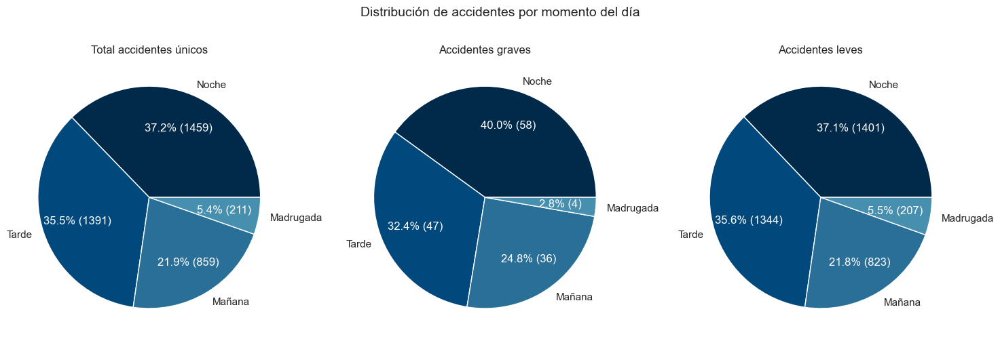

In [438]:
# Crear un pie chart con el número de accidentes por momento del día en tres columnas
plt.figure(figsize=(15, 6))
colors = ['#012a4a', '#01497c', '#2a6f97', '#468faf']

# Subplot 1
plt.subplot(1, 3, 1)
momentos_dia_counts = df_accidentes['momento_dia_acc'].value_counts()
pie1 = plt.pie(momentos_dia_counts, labels=momentos_dia_counts.index, colors=colors, autopct=lambda p: '{:.1f}% ({:.0f})'.format(p, p * sum(momentos_dia_counts) / 100), pctdistance=0.68)
plt.title('Total accidentes únicos')

# Subplot 2
plt.subplot(1, 3, 2)
momentos_dia_graves_counts = df_accidentes[df_accidentes['gravedad']==1]['momento_dia_acc'].value_counts()
pie2 = plt.pie(momentos_dia_graves_counts, labels=momentos_dia_graves_counts.index, colors=colors, autopct=lambda p: '{:.1f}% ({:.0f})'.format(p, p * sum(momentos_dia_graves_counts) / 100), pctdistance=0.68)
plt.title('Accidentes graves')

# Subplot 3
plt.subplot(1, 3, 3)
momentos_dia_leves_counts = df_accidentes[df_accidentes['gravedad']==0]['momento_dia_acc'].value_counts()
pie3 = plt.pie(momentos_dia_leves_counts, labels=momentos_dia_leves_counts.index, colors=colors, autopct=lambda p: '{:.1f}% ({:.0f})'.format(p, p * sum(momentos_dia_leves_counts) / 100), pctdistance=0.68)
plt.title('Accidentes leves')

# Modificar el color del texto de autopct a blanco
for pie in [pie1, pie2, pie3]:
    for p in pie[2]:
        p.set_color('white')

# Agregar un título global
plt.suptitle('Distribución de accidentes por momento del día', fontsize=14)

plt.tight_layout(rect=[0, 0.03, 1, 1.05])  # Ajustar el espacio superior para el título global
plt.show()

In [439]:
df_accidentes.columns


Index(['num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc',
       'numero_acc', 'clase_via_acc_1', 'nombre_via_acc_1', 'numero_via_acc_1',
       'geometry', 'cod_distrito', 'nom_distrito', 'nom_barrio', 'cod_barrio',
       'cod_disbar', 'tipo_ruta', 'tipo_accidente', 'estado_meteorologico',
       'tipo_vehiculo', 'tipo_persona', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'rango_edad', 'sexo', 'cod_lesividad',
       'lesividad', 'utm_x_acc', 'utm_y_acc', 'positiva_alcohol',
       'positiva_droga', 'fecha_hora_med', 'id_pmed_mas_cercano',
       'tipo_elem_pmed', 'intensidad', 'ocupacion', 'carga', 'vmed', 'error',
       'periodo_integracion', 'cod_cent_pmed', 'nombre_pmed', 'utm_x_pmed',
       'utm_y_pmed', 'COD_NDP', 'COD_VIA', 'cruce', 'gravedad', 'mes_año',
       'año', 'mes', 'dia_semana', 'dia

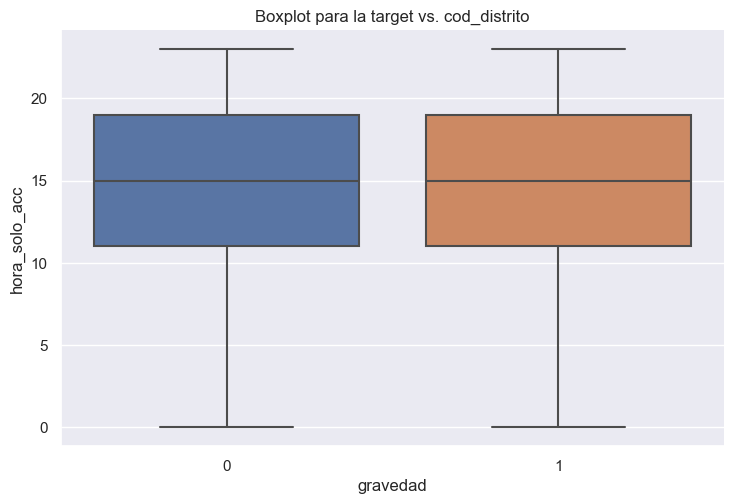

In [440]:
sns.catplot(x="gravedad", y="hora_solo_acc", data=df_accidentes, kind="box", aspect=1.5)
plt.title("Boxplot para la target vs. cod_distrito")
plt.show()

#### B.3.2. Localización del accidente
Se analizará:
* tipo de vía: var. categórica nominal
* vía: var. categórica nominal
* barrio: var. categórica nominal
* distrito: var. categórica nominal
* número de policia: var. numérica discreta
* cruce: var. categórica discreta

##### Tipo de vía

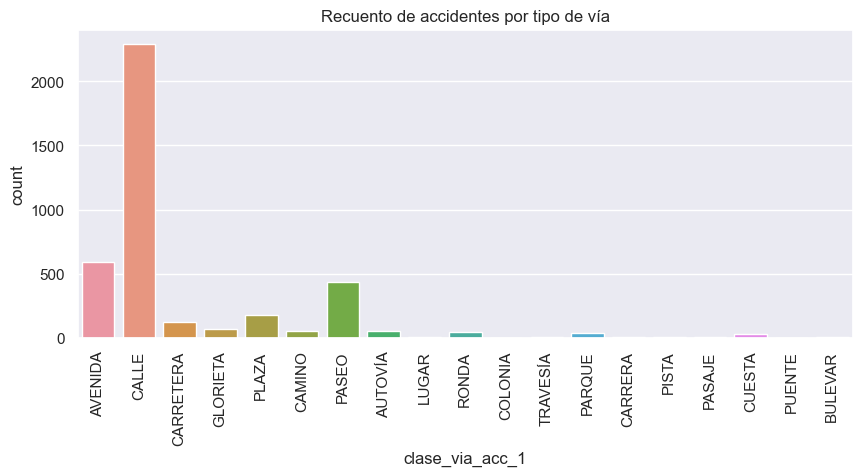

In [441]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes, x='clase_via_acc_1')
plt.title('Recuento de accidentes por tipo de vía')
plt.xticks(rotation=90)
plt.show()

In [442]:
df_accidentes.drop_duplicates(['num_expediente']).clase_via_acc_1.value_counts()*100 / df_accidentes.drop_duplicates(['num_expediente']).count()[0]

CALLE        59.662664
AVENIDA      14.979989
PASEO        10.548885
PLAZA         4.545455
CARRETERA     3.001715
GLORIETA      1.829617
CAMINO        1.257862
RONDA         1.086335
AUTOVÍA       1.086335
CUESTA        0.771870
PARQUE        0.714694
CARRERA       0.114351
PISTA         0.114351
LUGAR         0.085763
TRAVESÍA      0.085763
COLONIA       0.028588
PASAJE        0.028588
PUENTE        0.028588
BULEVAR       0.028588
Name: clase_via_acc_1, dtype: float64

In [443]:
df_accidentes[df_accidentes.gravedad==1].drop_duplicates(['num_expediente']).clase_via_acc_1.value_counts()*100 / df_accidentes[df_accidentes.gravedad==1].drop_duplicates(['num_expediente']).count()[0]

CALLE        54.482759
AVENIDA      15.172414
PASEO        13.793103
CARRETERA     4.137931
CAMINO        3.448276
GLORIETA      2.758621
PLAZA         2.068966
AUTOVÍA       1.379310
PISTA         0.689655
RONDA         0.689655
PARQUE        0.689655
CUESTA        0.689655
Name: clase_via_acc_1, dtype: float64

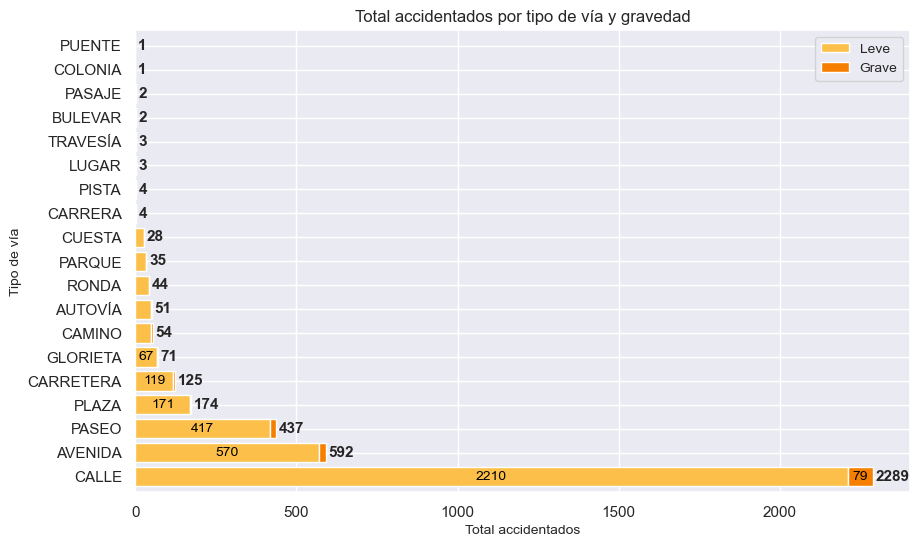

In [444]:
#accidentes_por_clase_via_gravedad = df_accidentes.drop_duplicates(['num_expediente']).groupby(['clase_via_acc_1','gravedad'])['num_expediente'].nunique().unstack(level=1)
accidentes_por_clase_via_gravedad = df_accidentes.groupby(['clase_via_acc_1','gravedad'])['num_expediente'].count().unstack(level=1)
accidentes_por_clase_via_gravedad.columns = ['Leve', 'Grave']
accidentes_por_clase_via_gravedad = accidentes_por_clase_via_gravedad.sort_values(['Leve','Grave'], ascending=False)

ax = accidentes_por_clase_via_gravedad.fillna(0.01).plot.barh(figsize=(10, 6), stacked=True, color=['#fcbf49','#f77f00'], width=0.8)

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 50 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.ylabel('Tipo de vía', fontsize=10)
plt.xlabel('Total accidentados', fontsize=10)
plt.title('Total accidentados por tipo de vía y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=10)

#plt.tight_layout()
plt.show()

##### Vía

In [445]:
df_accidentes['via_acc_1'] = df_accidentes.apply(lambda x: x['clase_via_acc_1'] + ' ' + x['nombre_via_acc_1'], axis=1)
(df_accidentes.drop_duplicates(['num_expediente']).via_acc_1.value_counts()*100 / df_accidentes.drop_duplicates(['num_expediente']).count()[0]).head(8)

CALLE ALCALA                 2.773013
CALLE BRAVO MURILLO          1.600915
PASEO CASTELLANA             1.572327
CALLE SERRANO                1.114923
CALLE GRAN VIA               1.000572
CALLE PRINCIPE DE VERGARA    0.914808
CALLE SANTA ENGRACIA         0.886221
CALLE SAN BERNARDO           0.800457
Name: via_acc_1, dtype: float64

In [446]:
df_accidentes.via_acc_1.value_counts()*100 / df_accidentes.count()[0]

CALLE ALCALA                    2.627551
PASEO CASTELLANA                1.505102
CALLE BRAVO MURILLO             1.454082
AVENIDA MANZANARES              1.224490
CALLE SANTA ENGRACIA            1.071429
                                  ...   
CARRETERA M-110                 0.025510
CALLE ESCORPION                 0.025510
CARRETERA CEMENTERIO NUEVO      0.025510
CALLE ALBAIDA                   0.025510
CALLE ENCOMIENDA DE PALACIOS    0.025510
Name: via_acc_1, Length: 1199, dtype: float64

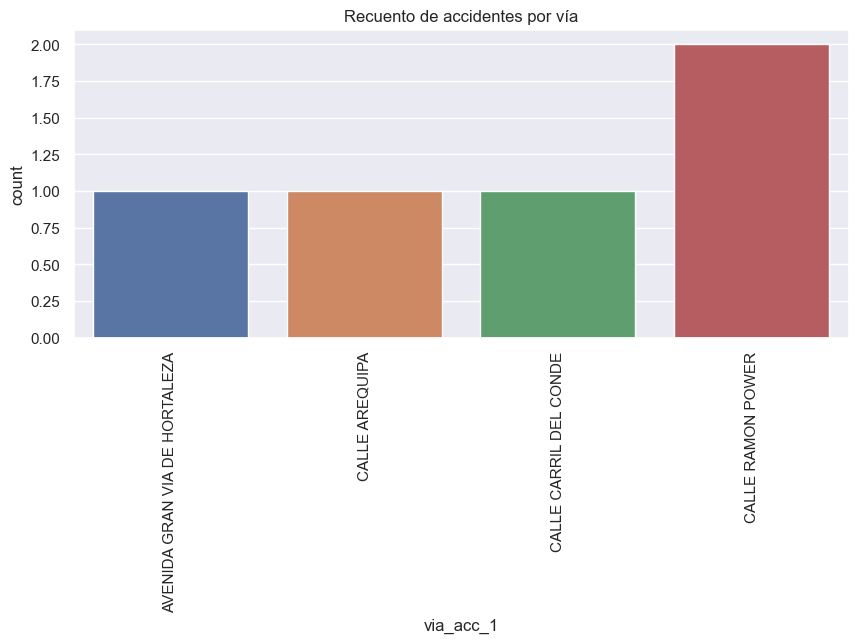

In [447]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes.head(), x='via_acc_1')
plt.title('Recuento de accidentes por vía')
plt.xticks(rotation=90)
plt.show()

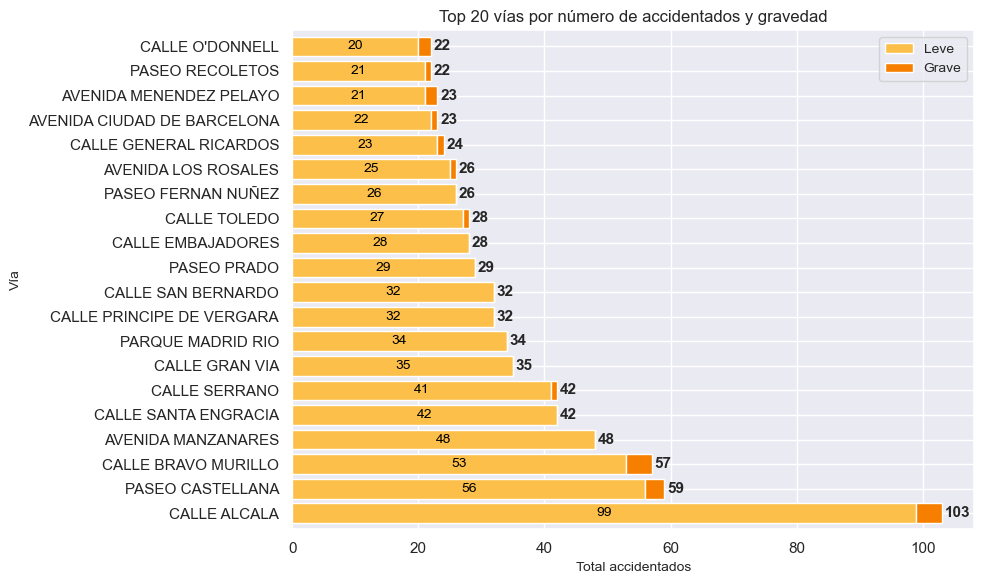

In [448]:
#accidentes_por_via_gravedad = df_accidentes.drop_duplicates(['num_expediente']).groupby(['via_acc_1','gravedad'])['num_expediente'].nunique().unstack(level=1)
accidentes_por_via_gravedad = df_accidentes.groupby(['via_acc_1','gravedad'])['num_expediente'].count().unstack(level=1)
accidentes_por_via_gravedad.columns = ['Leve', 'Grave']
accidentes_por_via_gravedad = accidentes_por_via_gravedad.sort_values(['Leve', 'Grave'], ascending=False)

ax = accidentes_por_via_gravedad.fillna(0.01).head(20).plot.barh(figsize=(10, 6), stacked=True, color=['#fcbf49','#f77f00'], width=0.8)

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 15 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.ylabel('Vía', fontsize=10)
plt.xlabel('Total accidentados', fontsize=10)
plt.title('Top 20 vías por número de accidentados y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=10)

plt.tight_layout()
plt.show()

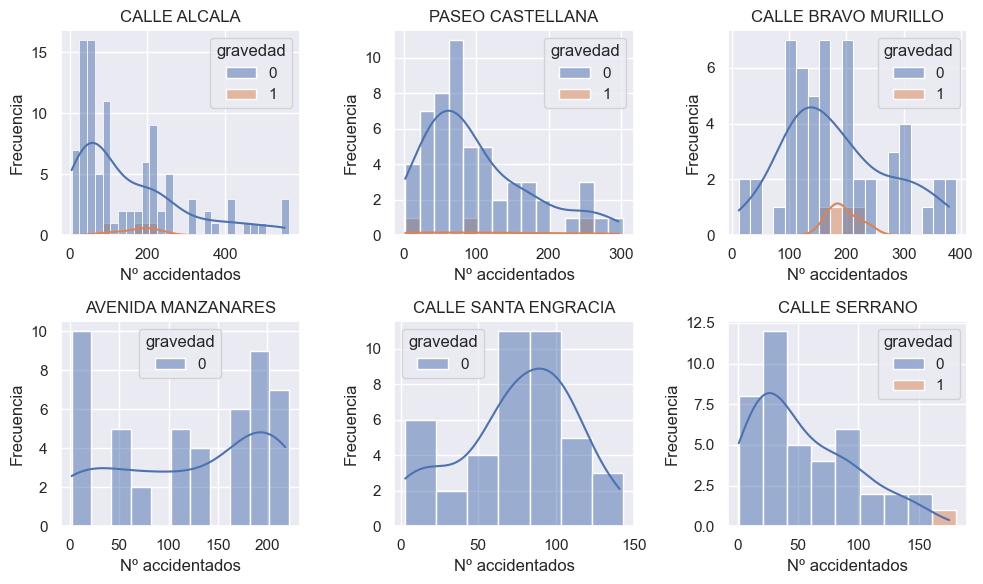

In [449]:
calles = [
    'CALLE ALCALA',
    'PASEO CASTELLANA',
    'CALLE BRAVO MURILLO',
    'AVENIDA MANZANARES',
    'CALLE SANTA ENGRACIA',
    'CALLE SERRANO'
]

# Crear una matriz de subplots 3x3
fig, axes = plt.subplots(2, 3, figsize=(10, 6))
axes = axes.flatten()  # Convertir la matriz en un arreglo 1D

# Iterar sobre las variables y los subplots para crear los gráficos
for i, calle in enumerate(calles):
    ax = axes[i]
    sns.histplot(data=df_accidentes[df_accidentes['via_acc_1']==calle], x='numero_via_acc_1', hue='gravedad', binwidth=20, kde=True, ax=ax)
    ax.set_title(calle)
    ax.set_xlabel('Nº accidentados')
    ax.set_ylabel('Frecuencia')

# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()

C:\Users\alke-\AppData\Local\Temp\ipykernel_1524\1597998942.py:17: UserWarning:

The palette list has more values (2) than needed (1), which may not be intended.

C:\Users\alke-\AppData\Local\Temp\ipykernel_1524\1597998942.py:17: UserWarning:

The palette list has more values (2) than needed (1), which may not be intended.



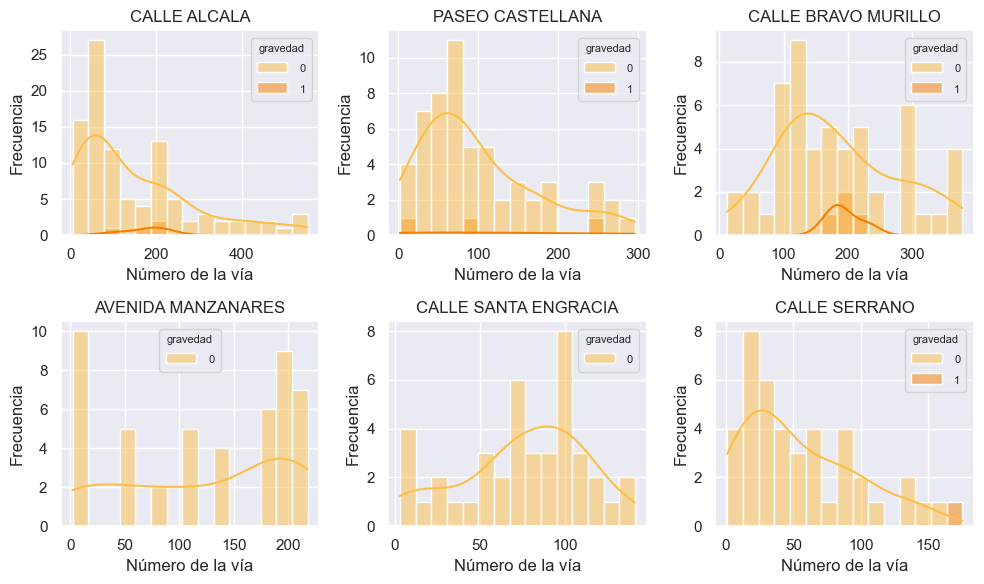

In [450]:
calles = [
    'CALLE ALCALA',
    'PASEO CASTELLANA',
    'CALLE BRAVO MURILLO',
    'AVENIDA MANZANARES',
    'CALLE SANTA ENGRACIA',
    'CALLE SERRANO'
]

# Crear una matriz de subplots 3x3
fig, axes = plt.subplots(2, 3, figsize=(10, 6))
axes = axes.flatten()  # Convertir la matriz en un arreglo 1D

# Iterar sobre las variables y los subplots para crear los gráficos
for i, calle in enumerate(calles):
    ax = axes[i]
    sns.histplot(data=df_accidentes[df_accidentes['via_acc_1']==calle], x='numero_via_acc_1', hue='gravedad', bins=15, kde=True, ax=ax, palette=['#fcbf49','#f77f00'], alpha=0.5)
    ax.set_title(calle)
    ax.set_xlabel('Número de la vía')
    ax.set_ylabel('Frecuencia')
    plt.setp(ax.get_legend().get_texts(), fontsize='8') # for legend text
    plt.setp(ax.get_legend().get_title(), fontsize='8') # for legend title

# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()

In [451]:
df_accidentes[df_accidentes['via_acc_1']=='CALLE ALCALA'].groupby(by=['nom_barrio', 'gravedad']).agg({'num_expediente':'count', 'numero_via_acc_1':['min','max']}).droplevel(0, axis=1).sort_values('min')

count  min  max
nom_barrio       gravedad                 
Sol              0             4    5   15
Cortes           0            18   23   46
Justicia         0            11   41   51
Los Jerónimos    0            10   50   95
Recoletos        0            13   53  117
                 1             1  103  103
Goya             0             7  136  185
Fuente del Berro 1             2  180  220
                 0             8  186  206
Guindalera       1             1  197  197
                 0             6  201  235
Ventas           0             4  224  321
La Concepción    0             4  249  261
Quintana         0             2  317  319
Pueblo Nuevo     0             4  346  406
Simancas         0             6  420  549
Canillejas       0             2  553  553

In [452]:
df_accidentes[df_accidentes['via_acc_1']=='PASEO CASTELLANA'].groupby(by=['nom_barrio', 'gravedad']).agg({'num_expediente':'count', 'numero_via_acc_1':['min','max']}).droplevel(0, axis=1).sort_values('min')

,,count,min,max
nom_barrio,gravedad,,,
Recoletos,1,1,2,2
Almagro,0,10,5,51
Recoletos,0,3,10,16
Castellana,0,6,22,68
Ríos Rosas,0,4,59,108
Cuatro Caminos,0,11,69,109
El Viso,0,8,70,138
Cuatro Caminos,1,1,83,83
Hispanoamérica,0,2,154,158


In [453]:
df_accidentes[df_accidentes['via_acc_1']=='CALLE BRAVO MURILLO'].groupby(by=['nom_barrio', 'gravedad']).agg({'num_expediente':'count', 'numero_via_acc_1':['min','max']}).droplevel(0, axis=1).sort_values('min')

count  min  max
nom_barrio     gravedad                 
Trafalgar      0             2   12   20
Ríos Rosas     0             1   46   46
Arapiles       0             1   49   49
Vallehermoso   0             4   83   99
Cuatro Caminos 0            16   96  208
Bellas Vistas  0            11  107  171
               1             1  171  171
Cuatro Caminos 1             2  186  192
Berruguete     0             4  201  235
Castillejos    0             8  224  376
Berruguete     1             1  231  231
Valdeacederas  0             3  289  305
Almenara       0             3  355  379

In [454]:
df_accidentes.columns

Index(['num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc',
       'numero_acc', 'clase_via_acc_1', 'nombre_via_acc_1', 'numero_via_acc_1',
       'geometry', 'cod_distrito', 'nom_distrito', 'nom_barrio', 'cod_barrio',
       'cod_disbar', 'tipo_ruta', 'tipo_accidente', 'estado_meteorologico',
       'tipo_vehiculo', 'tipo_persona', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'rango_edad', 'sexo', 'cod_lesividad',
       'lesividad', 'utm_x_acc', 'utm_y_acc', 'positiva_alcohol',
       'positiva_droga', 'fecha_hora_med', 'id_pmed_mas_cercano',
       'tipo_elem_pmed', 'intensidad', 'ocupacion', 'carga', 'vmed', 'error',
       'periodo_integracion', 'cod_cent_pmed', 'nombre_pmed', 'utm_x_pmed',
       'utm_y_pmed', 'COD_NDP', 'COD_VIA', 'cruce', 'gravedad', 'mes_año',
       'año', 'mes', 'dia_semana', 'dia

##### Barrio

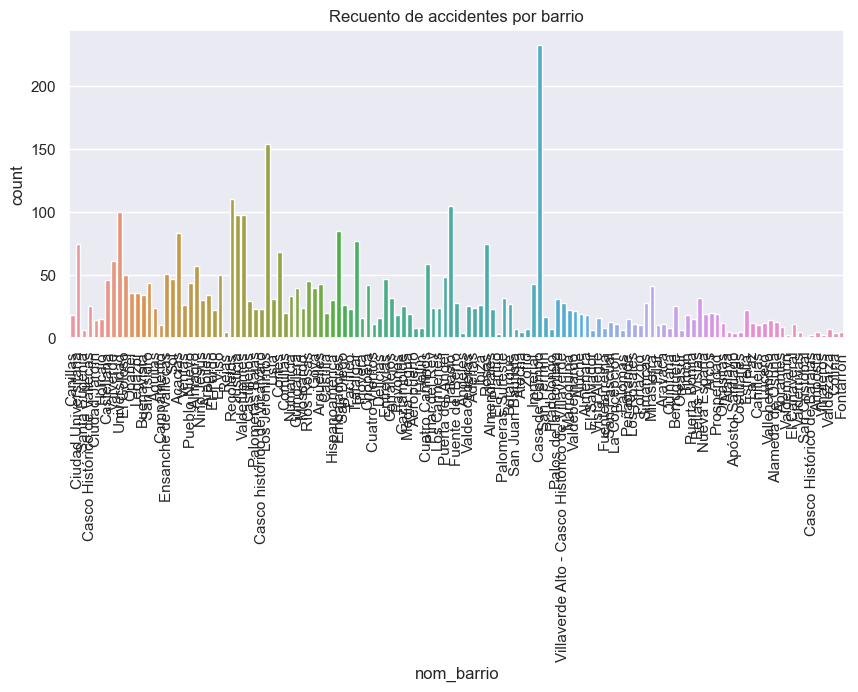

In [455]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes, x='nom_barrio')
plt.title('Recuento de accidentes por barrio')
plt.xticks(rotation=90)
plt.show()

In [456]:
df_accidentes.drop_duplicates(['num_expediente']).nom_barrio.value_counts()*100 / df_accidentes.drop_duplicates(['num_expediente']).count()[0]

Casa de Campo                 5.202973
Los Jerónimos                 3.802173
Recoletos                     2.973128
Palacio                       2.773013
Justicia                      2.601487
                                ...   
Apóstol Santiago              0.085763
Valdemarín                    0.057176
Casco Histórico de Barajas    0.057176
Vinateros                     0.057176
San Cristóbal                 0.028588
Name: nom_barrio, Length: 131, dtype: float64

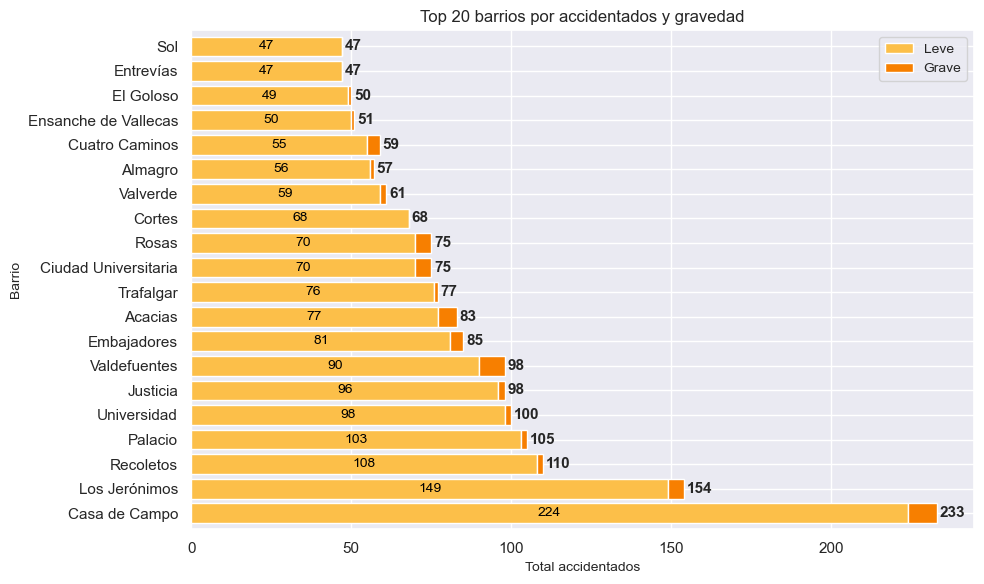

In [457]:
accidentes_por_barrio_gravedad = df_accidentes.groupby(['nom_barrio','gravedad'])['num_expediente'].count().unstack(level=1)
#accidentes_por_barrio_gravedad = df_accidentes.drop_duplicates(['num_expediente']).groupby(['nom_barrio','gravedad'])['num_expediente'].nunique().unstack(level=1)
accidentes_por_barrio_gravedad.columns = ['Leve', 'Grave']
accidentes_por_barrio_gravedad = accidentes_por_barrio_gravedad.sort_values(['Leve', 'Grave'], ascending=False)

ax = accidentes_por_barrio_gravedad.fillna(0.01).head(20).plot.barh(figsize=(10, 6), stacked=True, color=['#fcbf49','#f77f00'], width=0.8)

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 25 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.ylabel('Barrio', fontsize=10)
plt.xlabel('Total accidentados', fontsize=10)
plt.title('Top 20 barrios por accidentados y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=10)

plt.tight_layout()
plt.show()

##### Distrito

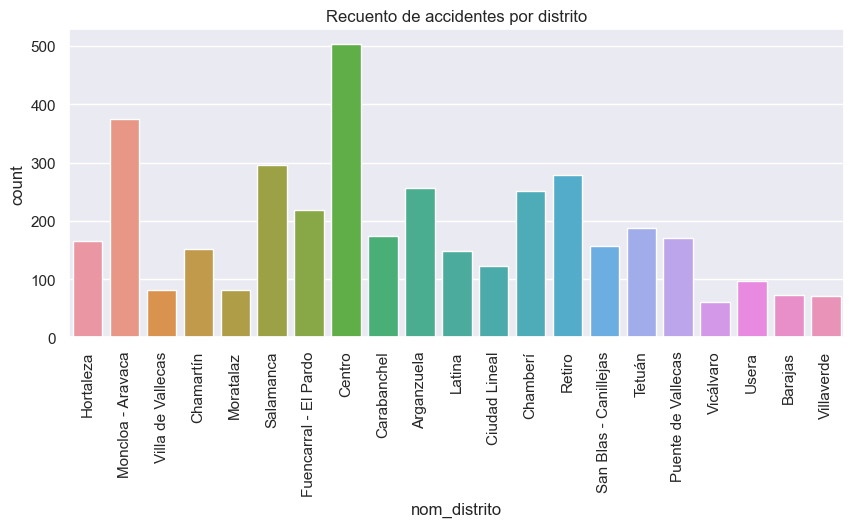

In [458]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes, x='nom_distrito')
plt.title('Recuento de accidentes por distrito')
plt.xticks(rotation=90)
plt.show()

In [459]:
df_accidentes.drop_duplicates(['num_expediente']).nom_distrito.value_counts()*100 / df_accidentes.drop_duplicates(['num_expediente']).count()[0]

Centro                   13.007433
Moncloa - Aravaca         8.833619
Salamanca                 8.090337
Retiro                    7.175529
Chamberí                  6.518010
Arganzuela                6.203545
Fuencarral - El Pardo     5.460263
Tetuán                    5.002859
Puente de Vallecas        4.545455
Carabanchel               4.259577
Hortaleza                 4.202401
Chamartín                 4.088050
San Blas - Canillejas     3.859348
Latina                    3.687822
Ciudad Lineal             3.230417
Usera                     2.429960
Villa de Vallecas         2.058319
Moratalaz                 2.029731
Barajas                   1.943968
Villaverde                1.772441
Vicálvaro                 1.600915
Name: nom_distrito, dtype: float64

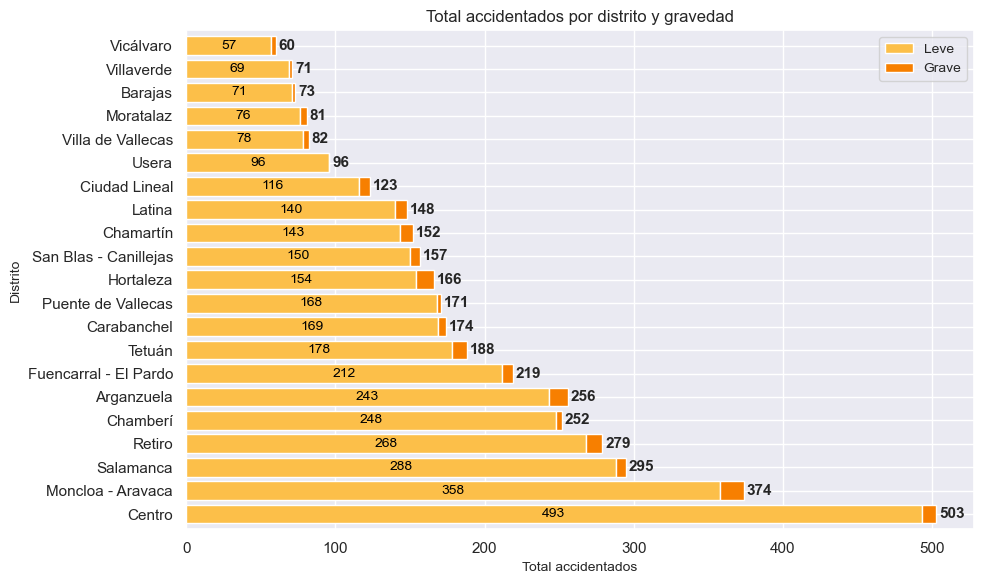

In [460]:
#accidentes_por_distrito_gravedad = df_accidentes.drop_duplicates(['num_expediente']).groupby(['nom_distrito','gravedad'])['num_expediente'].nunique().unstack(level=1)
accidentes_por_distrito_gravedad = df_accidentes.groupby(['nom_distrito','gravedad'])['num_expediente'].count().unstack(level=1)
accidentes_por_distrito_gravedad.columns = ['Leve', 'Grave']
accidentes_por_distrito_gravedad = accidentes_por_distrito_gravedad.sort_values(['Leve', 'Grave'], ascending=False)

ax = accidentes_por_distrito_gravedad.fillna(0.01).plot.barh(figsize=(10, 6), stacked=True, color=['#fcbf49','#f77f00'], width=0.8)

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 25 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.ylabel('Distrito', fontsize=10)
plt.xlabel('Total accidentados', fontsize=10)
plt.title('Total accidentados por distrito y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=10)

plt.tight_layout()
plt.show()

##### Número

Fuente: https://www.kaggle.com/code/codename007/home-credit-complete-eda-feature-importance/notebook

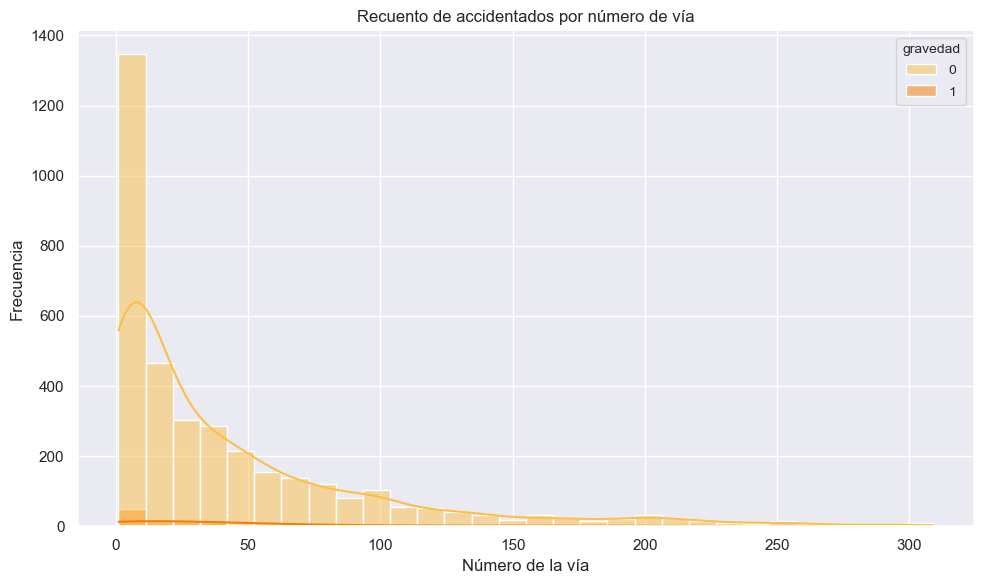

In [461]:
# Cálculo de Outliers
q25 = df_accidentes['numero_via_acc_1'].quantile(0.25)
q75 = df_accidentes['numero_via_acc_1'].quantile(0.75)
IRQ = q75-q25
mult = 4

df_accidentes[(df_accidentes['numero_via_acc_1'] < (q25 - mult * IRQ)) | (df_accidentes['numero_via_acc_1'] > (q75 + mult * IRQ))].head()

fig, ax = plt.subplots(1,1, figsize=(10, 6))
ax = axes.flatten()  # Convertir la matriz en un arreglo 1D

ax = sns.histplot(data=df_accidentes[~((df_accidentes['numero_via_acc_1'] < (q25 - mult * IRQ)) | (df_accidentes['numero_via_acc_1'] > (q75 + mult * IRQ)))], x='numero_via_acc_1', hue='gravedad', bins=30, kde=True, palette=['#fcbf49','#f77f00'], alpha=0.5)
ax.set_title('Recuento de accidentados por número de vía')
ax.set_xlabel('Número de la vía')
ax.set_ylabel('Frecuencia')
plt.setp(ax.get_legend().get_texts(), fontsize='10') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='10') # for legend title

# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()

C:\Users\alke-\AppData\Local\Temp\ipykernel_1524\897670537.py:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




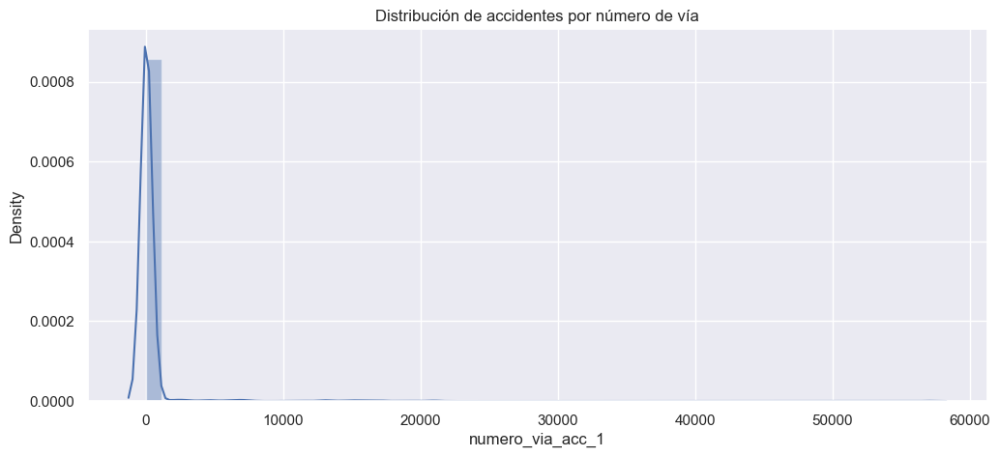

In [462]:
plt.figure(figsize=(12,5))
plt.title("Distribución de accidentes por número de vía")
ax = sns.distplot(df_accidentes["numero_via_acc_1"])
plt.show()

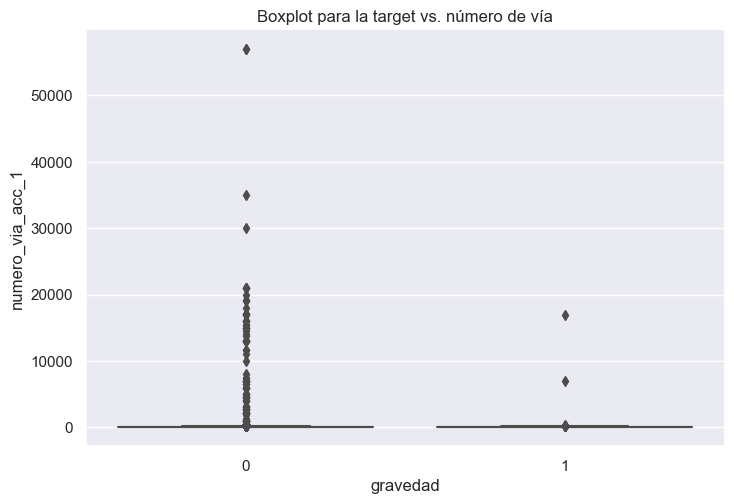

In [463]:
sns.catplot(x="gravedad", y="numero_via_acc_1", data=df_accidentes, kind="box", aspect=1.5)
plt.title("Boxplot para la target vs. número de vía")
plt.show()

In [464]:
# Cálculo de Outliers
q25 = df_accidentes['numero_via_acc_1'].quantile(0.25)
q75 = df_accidentes['numero_via_acc_1'].quantile(0.75)
IRQ = q75-q25
mult = 10

df_accidentes[(df_accidentes['numero_via_acc_1'] < (q25 - mult * IRQ)) | (df_accidentes['numero_via_acc_1'] > (q75 + mult * IRQ))].head()

,num_expediente,fecha_acc,hora_acc,localizacion_acc,numero_acc,clase_via_acc_1,nombre_via_acc_1,numero_via_acc_1,geometry,cod_distrito,...,cruce,gravedad,mes_año,año,mes,dia_semana,dia_mes,hora_solo_acc,momento_dia_acc,via_acc_1
66,2022S009329,2022-04-02,1900-01-01 12:40:00,CTRA DEHESA DE LA VILLA / ANILLO VERDE CICLISTA,14,CARRETERA,DEHESA DE LA VILLA,1800,POINT (-415651.7487350634 4932398.802784882),9,...,1,0,2022-04-01,2022,4,Sábado,2,12,Tarde,CARRETERA DEHESA DE LA VILLA
67,2022S013286,2022-04-29,1900-01-01 14:00:00,CALL ANILLO VERDE / CLUB,1,AUTOVÍA,CALLE 30,21000,POINT (-416221.56238115125 4929614.782628089),9,...,1,0,2022-04-01,2022,4,Viernes,29,14,Tarde,AUTOVÍA CALLE 30
362,2019S017873,2019-04-02,1900-01-01 13:50:00,"AUTOV M-607, +01500S",+01500S,AUTOVÍA,M-607,15400,POINT (-411387.5064373673 4943879.431015161),8,...,0,0,2019-04-01,2019,4,Martes,2,13,Tarde,AUTOVÍA M-607
363,2019S017873,2019-04-02,1900-01-01 13:50:00,"AUTOV M-607, +01500S",+01500S,AUTOVÍA,M-607,15400,POINT (-411387.5064373673 4943879.431015161),8,...,0,0,2019-04-01,2019,4,Martes,2,13,Tarde,AUTOVÍA M-607
365,2019S021957,2019-05-23,1900-01-01 19:20:00,"CTRA M-616, +00500S",+00500S,CARRETERA,M-616,7000,POINT (-412244.7112781473 4945887.205108001),8,...,0,0,2019-05-01,2019,5,Jueves,23,19,Noche,CARRETERA M-616


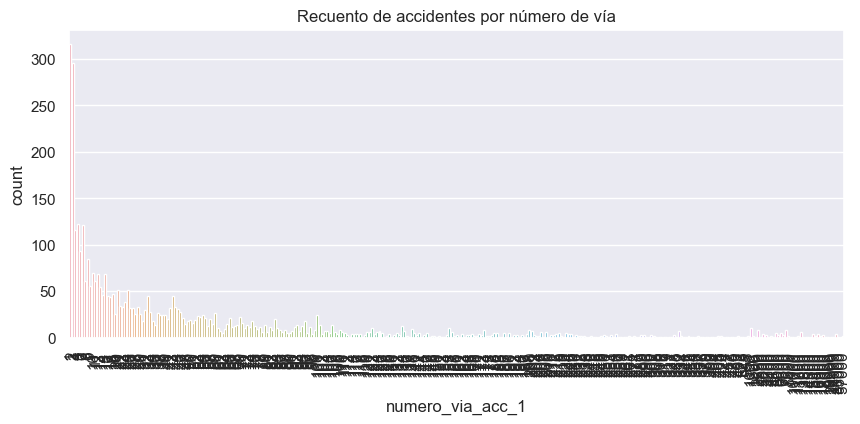

In [465]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes, x='numero_via_acc_1')
plt.title('Recuento de accidentes por número de vía')
plt.xticks(rotation=90)
plt.show()

##### Cruce

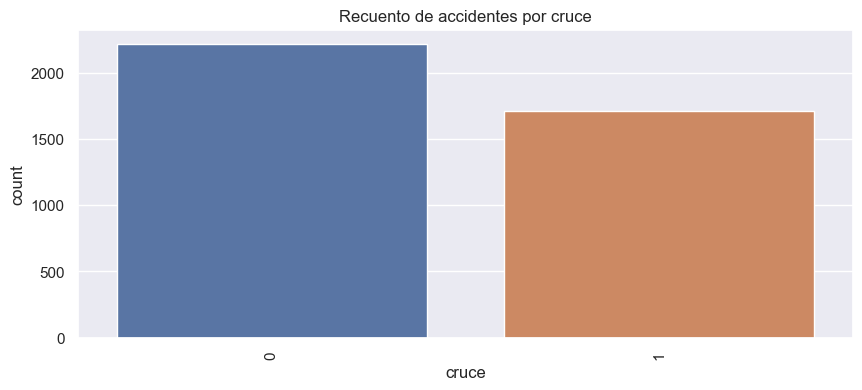

In [466]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes, x='cruce')
plt.title('Recuento de accidentes por cruce')
plt.xticks(rotation=90)
plt.show()

##### Análisis multivariante

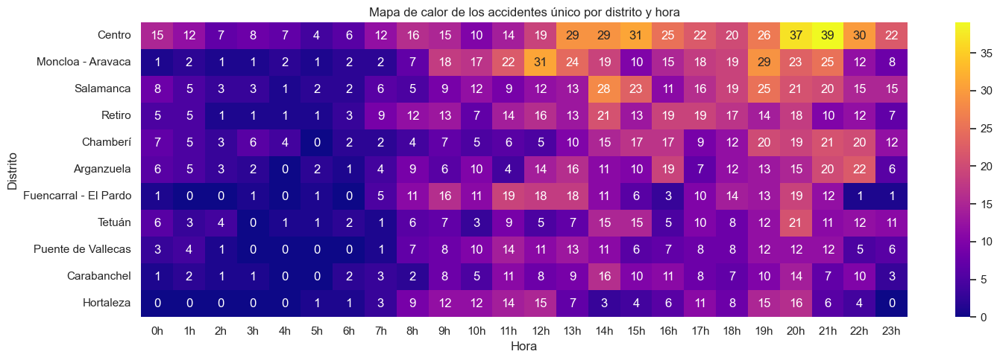

In [467]:
# Convertir la columna 'hora_acc' al formato de tiempo
df_accidentes['hora_acc'] = pd.to_datetime(df_accidentes['hora_acc'], format='%H:%M:%S')

# Extraer solo la hora de la columna 'hora_acc'
df_accidentes['hora_solo_acc'] = df_accidentes['hora_acc'].dt.hour

heatmap_pt = df_accidentes.drop_duplicates(['num_expediente']).pivot_table(columns='hora_solo_acc', index='nom_distrito', aggfunc='size', fill_value=0)

# Se ordenan de mayor a menor número de accidentes
heatmap_pt['Total'] = heatmap_pt.sum(axis=1)
heatmap_pt = heatmap_pt.sort_values(['Total'], ascending = False).drop(columns=['Total']).head(11)

# Si hay alguna hora que no tiene registros, se crea la columna vacía
for i in range(0,24):
    if i not in heatmap_pt.columns:
       heatmap_pt[i] = 0
heatmap_pt = heatmap_pt[list(range(24))]

fig, ax = plt.subplots(figsize=(15,5))

sns.set()
ax = sns.heatmap(heatmap_pt, cmap="plasma", annot=True, square=False, cbar=True)

# Cambiar etiquetas del eje X (horas)
horas_etiquetas = [f"{hora}h" for hora in range(24)]
ax.set_xticklabels(horas_etiquetas, rotation=0)

plt.xlabel('Hora')
plt.ylabel('Distrito')
plt.title('Mapa de calor de los accidentes único por distrito y hora')

plt.tight_layout() 

# Ajustar tamaño de la barra de colores
#cbar_ax = fig.add_axes([0.88, 0.16, 0.012, 0.75])  # Ajusta los valores según tus preferencias
#cbar = fig.colorbar(ax.collections[0], cax=cbar_ax)
#cbar.set_label('Número de accidentes', fontsize=12, loc="center", labelpad=10)

plt.show()

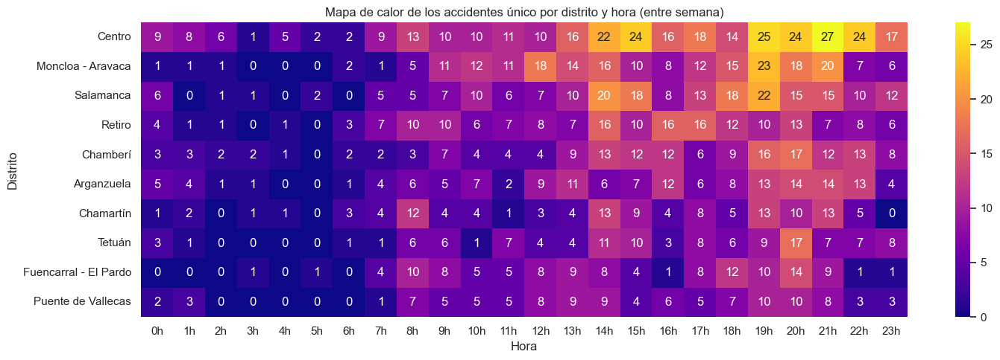

In [468]:
# Convertir la columna 'hora_acc' al formato de tiempo
df_accidentes['hora_acc'] = pd.to_datetime(df_accidentes['hora_acc'], format='%H:%M:%S')

# Extraer solo la hora de la columna 'hora_acc'
df_accidentes['hora_solo_acc'] = df_accidentes['hora_acc'].dt.hour

heatmap_pt = df_accidentes[df_accidentes.dia_semana.isin(['Lunes','Martes','Miércoles','Jueves','Viernes'])].drop_duplicates(['num_expediente']).pivot_table(columns='hora_solo_acc', index='nom_distrito', aggfunc='size', fill_value=0)

# Se ordenan de mayor a menor número de accidentes
heatmap_pt['Total'] = heatmap_pt.sum(axis=1)
heatmap_pt = heatmap_pt.sort_values(['Total'], ascending = False).drop(columns=['Total']).head(10)

# Si hay alguna hora que no tiene registros, se crea la columna vacía
for i in range(0,24):
    if i not in heatmap_pt.columns:
       heatmap_pt[i] = 0
heatmap_pt = heatmap_pt[list(range(24))]

fig, ax = plt.subplots(figsize=(15,5))

sns.set()
ax = sns.heatmap(heatmap_pt, cmap="plasma", annot=True, square=False, cbar=True)

# Cambiar etiquetas del eje X (horas)
horas_etiquetas = [f"{hora}h" for hora in range(24)]
ax.set_xticklabels(horas_etiquetas, rotation=0)

plt.xlabel('Hora')
plt.ylabel('Distrito')
plt.title('Mapa de calor de los accidentes único por distrito y hora (entre semana)')

plt.tight_layout() 

# Ajustar tamaño de la barra de colores
#cbar_ax = fig.add_axes([0.88, 0.16, 0.012, 0.75])  # Ajusta los valores según tus preferencias
#cbar = fig.colorbar(ax.collections[0], cax=cbar_ax)
#cbar.set_label('Número de accidentes', fontsize=12, loc="center", labelpad=10)

plt.show()

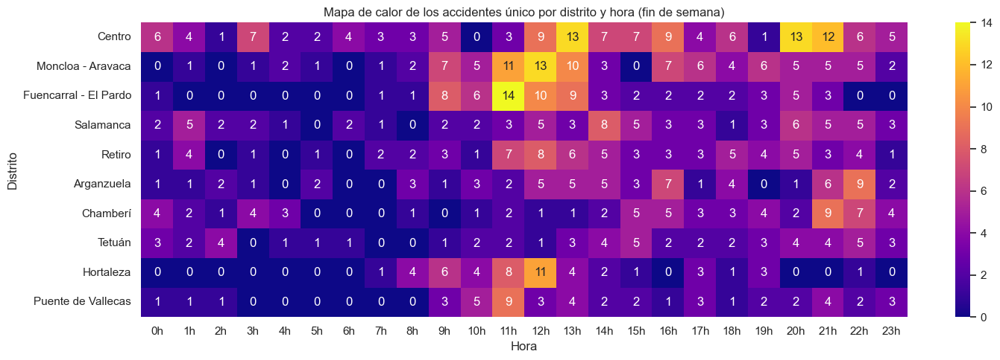

In [469]:
# Convertir la columna 'hora_acc' al formato de tiempo
df_accidentes['hora_acc'] = pd.to_datetime(df_accidentes['hora_acc'], format='%H:%M:%S')

# Extraer solo la hora de la columna 'hora_acc'
df_accidentes['hora_solo_acc'] = df_accidentes['hora_acc'].dt.hour

heatmap_pt = df_accidentes[df_accidentes.dia_semana.isin(['Sábado','Domingo'])].drop_duplicates(['num_expediente']).pivot_table(columns='hora_solo_acc', index='nom_distrito', aggfunc='size', fill_value=0)

# Se ordenan de mayor a menor número de accidentes
heatmap_pt['Total'] = heatmap_pt.sum(axis=1)
heatmap_pt = heatmap_pt.sort_values(['Total'], ascending = False).drop(columns=['Total']).head(10)

# Si hay alguna hora que no tiene registros, se crea la columna vacía
for i in range(0,24):
    if i not in heatmap_pt.columns:
       heatmap_pt[i] = 0
heatmap_pt = heatmap_pt[list(range(24))]

fig, ax = plt.subplots(figsize=(15,5))

sns.set()
ax = sns.heatmap(heatmap_pt, cmap="plasma", annot=True, square=False, cbar=True)

# Cambiar etiquetas del eje X (horas)
horas_etiquetas = [f"{hora}h" for hora in range(24)]
ax.set_xticklabels(horas_etiquetas, rotation=0)

plt.xlabel('Hora')
plt.ylabel('Distrito')
plt.title('Mapa de calor de los accidentes único por distrito y hora (fin de semana)')

plt.tight_layout() 

# Ajustar tamaño de la barra de colores
#cbar_ax = fig.add_axes([0.88, 0.16, 0.012, 0.75])  # Ajusta los valores según tus preferencias
#cbar = fig.colorbar(ax.collections[0], cax=cbar_ax)
#cbar.set_label('Número de accidentes', fontsize=12, loc="center", labelpad=10)

plt.show()

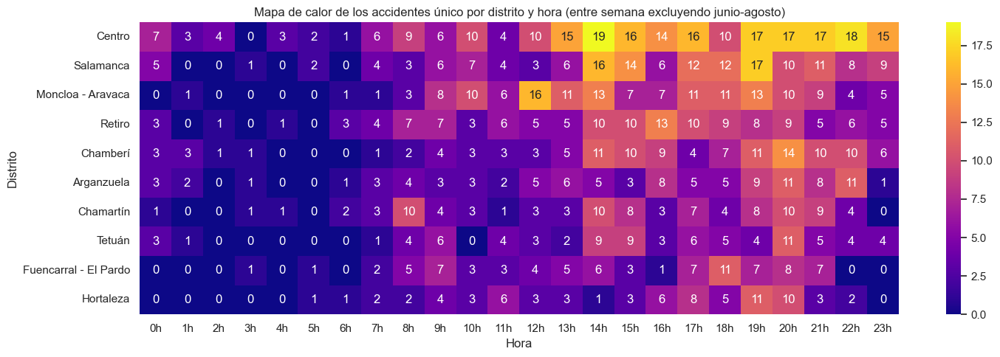

In [470]:
# Convertir la columna 'hora_acc' al formato de tiempo
df_accidentes['hora_acc'] = pd.to_datetime(df_accidentes['hora_acc'], format='%H:%M:%S')

# Extraer solo la hora de la columna 'hora_acc'
df_accidentes['hora_solo_acc'] = df_accidentes['hora_acc'].dt.hour

heatmap_pt = df_accidentes[df_accidentes.dia_semana.isin(['Lunes','Martes','Miércoles','Jueves','Viernes']) & df_accidentes.mes.isin([1,2,3,4,5,9,10,11,12])].drop_duplicates(['num_expediente']).pivot_table(columns='hora_solo_acc', index='nom_distrito', aggfunc='size', fill_value=0)

# Se ordenan de mayor a menor número de accidentes
heatmap_pt['Total'] = heatmap_pt.sum(axis=1)
heatmap_pt = heatmap_pt.sort_values(['Total'], ascending = False).drop(columns=['Total']).head(10)

# Si hay alguna hora que no tiene registros, se crea la columna vacía
for i in range(0,24):
    if i not in heatmap_pt.columns:
       heatmap_pt[i] = 0
heatmap_pt = heatmap_pt[list(range(24))]

fig, ax = plt.subplots(figsize=(15,5))

sns.set()
ax = sns.heatmap(heatmap_pt, cmap="plasma", annot=True, square=False, cbar=True)

# Cambiar etiquetas del eje X (horas)
horas_etiquetas = [f"{hora}h" for hora in range(24)]
ax.set_xticklabels(horas_etiquetas, rotation=0)

plt.xlabel('Hora')
plt.ylabel('Distrito')
plt.title('Mapa de calor de los accidentes único por distrito y hora (entre semana excluyendo junio-agosto)')

plt.tight_layout() 

# Ajustar tamaño de la barra de colores
#cbar_ax = fig.add_axes([0.88, 0.16, 0.012, 0.75])  # Ajusta los valores según tus preferencias
#cbar = fig.colorbar(ax.collections[0], cax=cbar_ax)
#cbar.set_label('Número de accidentes', fontsize=12, loc="center", labelpad=10)

plt.show()

In [471]:
# Calles con más accidentes por gravedad
for x in df_accidentes['gravedad'].unique():
    print(f"gravedad: {x}")
    print((df_accidentes[df_accidentes['gravedad']==x]['clase_via_acc_1'] + ' ' + df_accidentes[df_accidentes['gravedad']==x]['nombre_via_acc_1']).value_counts().head(5), "\n")

gravedad: 1
CALLE ALCALA              4
CALLE BRAVO MURILLO       4
PASEO CASTELLANA          3
PASEO ERMITA DEL SANTO    2
PASEO MELANCOLICOS        2
dtype: int64 

gravedad: 0
CALLE ALCALA            99
PASEO CASTELLANA        56
CALLE BRAVO MURILLO     53
AVENIDA MANZANARES      48
CALLE SANTA ENGRACIA    42
dtype: int64 



In [472]:
# Calles con más accidentes por lesividad
for x in df_accidentes['lesividad'].unique():
    print(f"Levisidad: {x}")
    print((df_accidentes[df_accidentes['lesividad']==x]['clase_via_acc_1'] + ' ' + df_accidentes[df_accidentes['lesividad']==x]['nombre_via_acc_1']).value_counts().head(5), "\n")

Levisidad: Ingreso superior a 24 horas
CALLE BRAVO MURILLO              4
CALLE ALCALA                     4
PASEO CASTELLANA                 3
AVENIDA GRAN VIA DE HORTALEZA    2
PASEO ESPERANZA                  2
dtype: int64 

Levisidad: Asistencia sanitaria sólo en el lugar del accidente
CALLE ALCALA           39
AVENIDA MANZANARES     21
CALLE BRAVO MURILLO    17
CALLE SERRANO          15
PASEO CASTELLANA       15
dtype: int64 

Levisidad: Ingreso inferior o igual a 24 horas
PASEO CASTELLANA       10
CALLE ALCALA           10
CALLE TOLEDO            8
CALLE EMBAJADORES       8
AVENIDA LOS ROSALES     7
dtype: int64 

Levisidad: Sin asistencia sanitaria
CALLE ALCALA           31
CALLE BRAVO MURILLO    20
CALLE GRAN VIA         17
AVENIDA MANZANARES     15
PASEO CASTELLANA       12
dtype: int64 

Levisidad: Asistencia sanitaria inmediata en centro de salud o mutua
CALLE ALCALA                   11
CALLE SERRANO                   8
PASEO EMBARCADERO               6
PASEO CASTELLANA   

In [473]:
# Se añaden campos para inteligencia de tiempo
# anomes_acc con el año y el mes del accidentes

# 
df_accidentes.head()

,num_expediente,fecha_acc,hora_acc,localizacion_acc,numero_acc,clase_via_acc_1,nombre_via_acc_1,numero_via_acc_1,geometry,cod_distrito,...,cruce,gravedad,mes_año,año,mes,dia_semana,dia_mes,hora_solo_acc,momento_dia_acc,via_acc_1
0,2019S000036,2019-01-02,1900-01-01 20:45:00,AVDA GRAN VIA DE HORTALEZA / GTA LUIS ROSALES,65B,AVENIDA,GRAN VIA DE HORTALEZA,32,POINT (-406716.1221869677 4934023.304391169),16,...,1,1,2019-01-01,2019,1,Miércoles,2,20,Noche,AVENIDA GRAN VIA DE HORTALEZA
1,2019S032353,2019-10-07,1900-01-01 10:15:00,"CALL AREQUIPA, 2",2,CALLE,AREQUIPA,2,POINT (-405439.4187378348 4934342.06706891),16,...,0,0,2019-10-01,2019,10,Lunes,7,10,Mañana,CALLE AREQUIPA
2,2020S007094,2020-05-21,1900-01-01 20:40:00,CALL CARRIL DEL CONDE / CALL CAMINOS,37,CALLE,CARRIL DEL CONDE,37,POINT (-406842.8280438097 4932951.709207284),16,...,1,0,2020-05-01,2020,5,Jueves,21,20,Noche,CALLE CARRIL DEL CONDE
3,2020S008367,2020-06-16,1900-01-01 22:00:00,CALL RAMON POWER / CALL HAENDEL,25,CALLE,RAMON POWER,23,POINT (-403552.7719903521 4933555.092716991),16,...,1,0,2020-06-01,2020,6,Martes,16,22,Noche,CALLE RAMON POWER
4,2020S008367,2020-06-16,1900-01-01 22:00:00,CALL RAMON POWER / CALL HAENDEL,25,CALLE,RAMON POWER,23,POINT (-403552.7719903521 4933555.092716991),16,...,1,0,2020-06-01,2020,6,Martes,16,22,Noche,CALLE RAMON POWER


In [474]:
# Barrios con más accidentes por gravedad
for x in df_accidentes['gravedad'].unique():
    print(f"Gravedad: {x}")
    print((df_accidentes[df_accidentes['gravedad']==x]['nom_barrio'] + ' (' + df_accidentes[df_accidentes['gravedad']==x]['nom_distrito'] + ')').value_counts().head(5), "\n")

Gravedad: 1
Casa de Campo (Moncloa - Aravaca)           9
Valdefuentes (Hortaleza)                    8
Acacias (Arganzuela)                        6
Imperial (Arganzuela)                       5
Ciudad Universitaria (Moncloa - Aravaca)    5
dtype: int64 

Gravedad: 0
Casa de Campo (Moncloa - Aravaca)    224
Los Jerónimos (Retiro)               149
Recoletos (Salamanca)                108
Palacio (Centro)                     103
Universidad (Centro)                  98
dtype: int64 



In [475]:
# Distritos con más accidentes por gravedad
for x in df_accidentes['gravedad'].unique():
    print(f"Gravedad: {x}")
    print(df_accidentes[df_accidentes['gravedad']==x]['nom_distrito'].value_counts().head(5), "\n")

Gravedad: 1
Moncloa - Aravaca    16
Arganzuela           13
Hortaleza            12
Retiro               11
Tetuán               10
Name: nom_distrito, dtype: int64 

Gravedad: 0
Centro               493
Moncloa - Aravaca    358
Salamanca            288
Retiro               268
Chamberí             248
Name: nom_distrito, dtype: int64 



#### Tipo de accidente

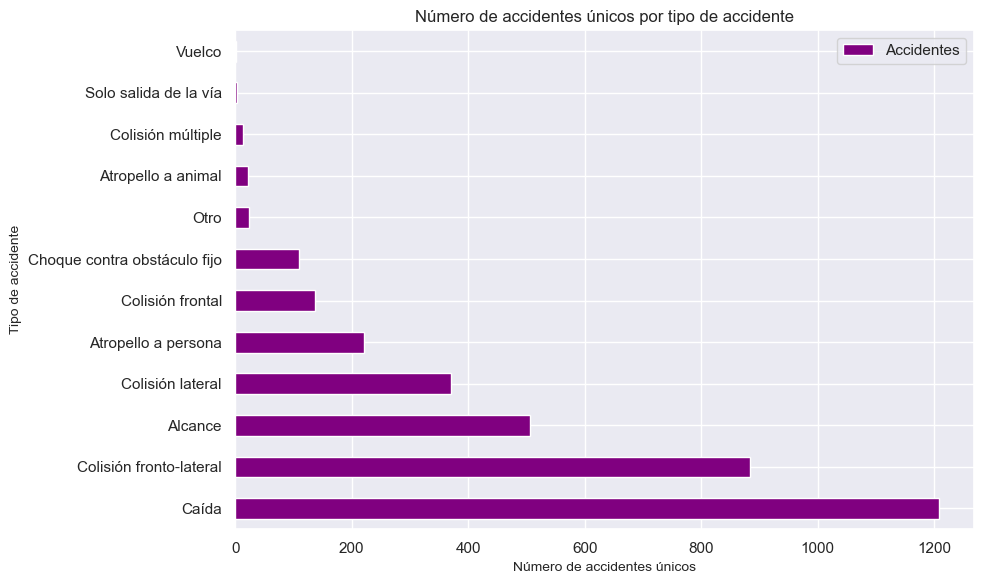

In [476]:
ax = df_accidentes.groupby(by='tipo_accidente').agg({'num_expediente':'nunique'}).sort_values(by='num_expediente', ascending=False).plot(kind='barh', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.ylabel('Tipo de accidente', fontsize=10)
plt.xlabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por tipo de accidente')

labels = [item.get_text() for item in ax.get_xticklabels()]


# Cambiar el label de la leyenda
ax.legend(["Accidentes"])
plt.tight_layout()
plt.show()

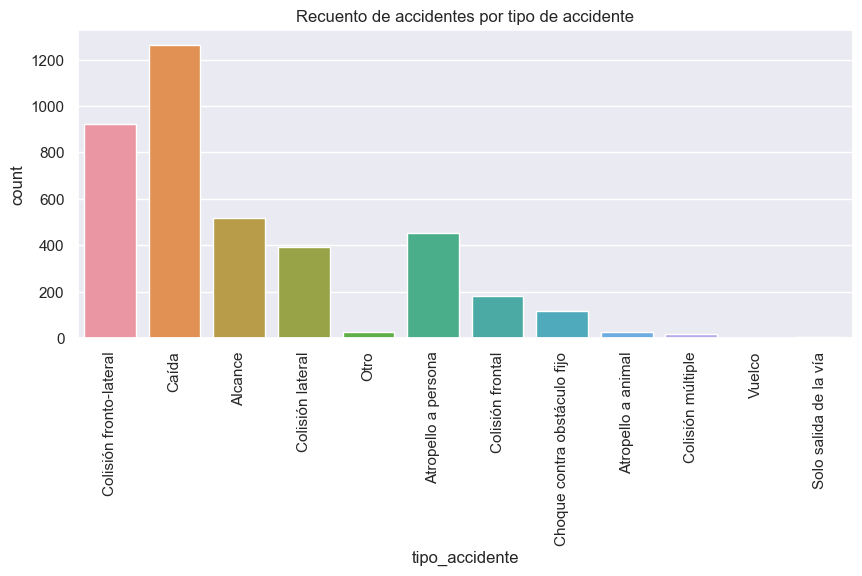

In [477]:
plt.figure(figsize=(10, 4))
sns.countplot(data=df_accidentes, x='tipo_accidente')
plt.title('Recuento de accidentes por tipo de accidente')
plt.xticks(rotation=90)
plt.show()

In [478]:
df_accidentes.drop_duplicates(['num_expediente']).tipo_accidente.value_counts()*100 / df_accidentes.drop_duplicates(['num_expediente']).count()[0]

Caída                           34.534019
Colisión fronto-lateral         25.242996
Alcance                         14.465409
Colisión lateral                10.577473
Atropello a persona              6.346484
Colisión frontal                 3.916524
Choque contra obstáculo fijo     3.116066
Otro                             0.657519
Atropello a animal               0.628931
Colisión múltiple                0.400229
Solo salida de la vía            0.085763
Vuelco                           0.028588
Name: tipo_accidente, dtype: float64

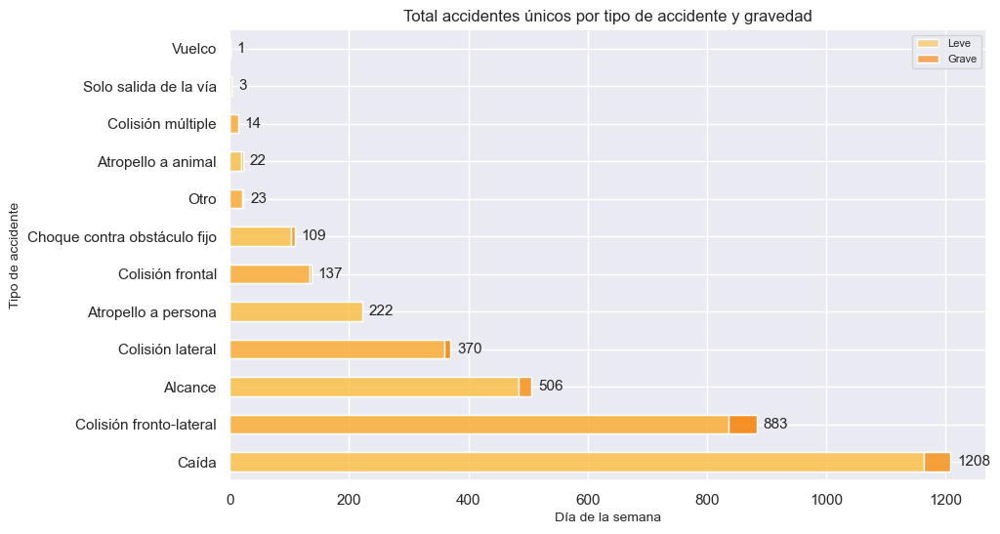

In [479]:
# ELIMINAR
# Calcular el promedio de accidentes únicos por tipo de accidente y gravedad
total_por_tipo_accidente_gravedad = df_accidentes.drop_duplicates('num_expediente').groupby(['tipo_accidente', 'gravedad'])['num_expediente'].count().unstack(level=1)
total_por_tipo_accidente_gravedad.columns = ['Leve', 'Grave']

# Se ordenan de mayor a menor número de accidentes
total_por_tipo_accidente_gravedad['Total'] = total_por_tipo_accidente_gravedad.sum(axis=1)
total_por_tipo_accidente_gravedad = total_por_tipo_accidente_gravedad.sort_values(['Total'], ascending = False).drop(columns=['Total'])

total_por_tipo_accidente = total_por_tipo_accidente_gravedad.sum(axis=1)

ax = total_por_tipo_accidente.plot.barh(figsize=(10, 6), stacked=True, color=['#fcbf4999','#f77f0099'])

for c in ax.containers:

    # Optional: if the segment is small or 0, customize the labels
    #labels = [v.get_width() if v.get_width() > 50 else '' for v in c]
    
    # remove the labels parameter if it's not needed for customized labels
    #ax.bar_label(c, labels=labels, label_type='center')

    ax.bar_label(c, fmt=lambda x: f'{x:.0f}' if x > 0 else '', label_type='edge', padding=5, fontsize=11)

total_por_tipo_accidente_gravedad.plot.barh(figsize=(10, 6), stacked=True, color=['#fcbf4999','#f77f0099'], ax=ax)

plt.xlabel('Día de la semana', fontsize=10)
plt.ylabel('Tipo de accidente', fontsize=10)
plt.title('Total accidentes únicos por tipo de accidente y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

#plt.tight_layout()
plt.show()

                                Leve  Grave
tipo_accidente                             
Caída                         1221.0   44.0
Colisión fronto-lateral        876.0   47.0
Alcance                        497.0   21.0
Atropello a persona            446.0    8.0
Colisión lateral               382.0   10.0
Colisión frontal               179.0    4.0
Choque contra obstáculo fijo   108.0    7.0
Otro                            24.0    2.0
Atropello a animal              22.0    2.0
Colisión múltiple               16.0    NaN
Solo salida de la vía            3.0    NaN
Vuelco                           1.0    NaN


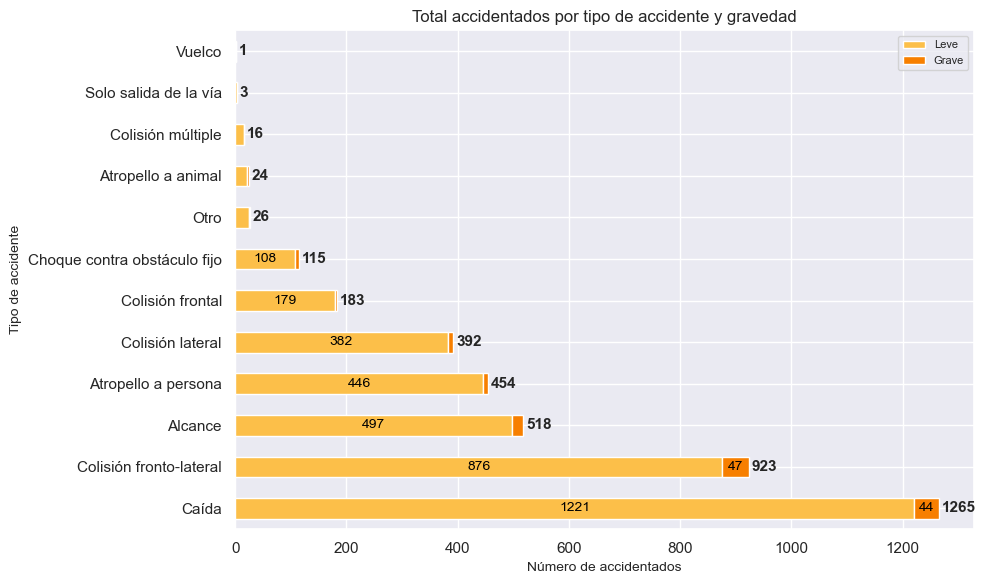

In [480]:
# Calcular el promedio de accidentes únicos por tipo de accidente y gravedad
total_por_tipo_accidente_gravedad = df_accidentes.groupby(['tipo_accidente', 'gravedad'])['num_expediente'].count().unstack(level=1)
#total_por_tipo_accidente_gravedad = df_accidentes.drop_duplicates('num_expediente').groupby(['tipo_accidente', 'gravedad'])['num_expediente'].count().unstack(level=1)
total_por_tipo_accidente_gravedad.columns = ['Leve', 'Grave']

# Se ordenan de mayor a menor número de accidentes
total_por_tipo_accidente_gravedad['Total'] = total_por_tipo_accidente_gravedad.sum(axis=1)
total_por_tipo_accidente_gravedad = total_por_tipo_accidente_gravedad.sort_values(['Total'], ascending = False).drop(columns=['Total'])

print(total_por_tipo_accidente_gravedad)

ax = total_por_tipo_accidente_gravedad.fillna(0.01).plot.barh(stacked=True, figsize=(10, 6), color=['#fcbf49','#f77f00'])

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 25 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.xlabel('Número de accidentados', fontsize=10)
plt.ylabel('Tipo de accidente', fontsize=10)
plt.title('Total accidentados por tipo de accidente y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

plt.tight_layout()
plt.show()


In [481]:
total_por_tipo_accidente_gravedad['Grave'] * 100 / (total_por_tipo_accidente_gravedad['Leve'] )

tipo_accidente
Caída                           3.603604
Colisión fronto-lateral         5.365297
Alcance                         4.225352
Atropello a persona             1.793722
Colisión lateral                2.617801
Colisión frontal                2.234637
Choque contra obstáculo fijo    6.481481
Otro                            8.333333
Atropello a animal              9.090909
Colisión múltiple                    NaN
Solo salida de la vía                NaN
Vuelco                               NaN
dtype: float64

#### Estado meteorológico

In [482]:
# Se corrije una errata
df_accidentes['estado_meteorologico'] = df_accidentes['estado_meteorologico'].replace('LLuvia intensa', 'Lluvia intensa')

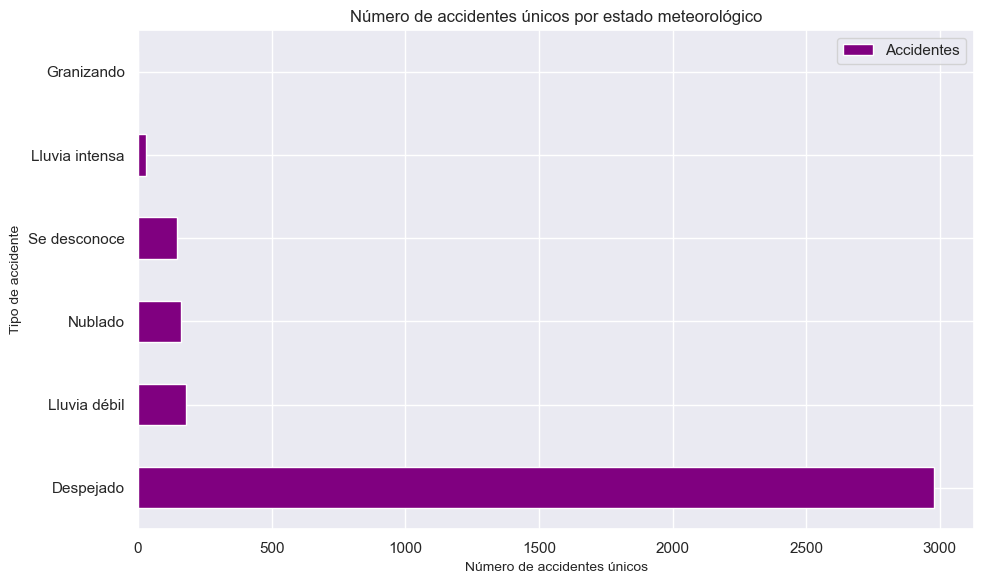

In [483]:
ax = df_accidentes.groupby(by='estado_meteorologico').agg({'num_expediente':'nunique'}).sort_values(by='num_expediente', ascending=False).plot(kind='barh', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.ylabel('Tipo de accidente', fontsize=10)
plt.xlabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por estado meteorológico')

labels = [item.get_text() for item in ax.get_xticklabels()]


# Cambiar el label de la leyenda
ax.legend(["Accidentes"])
plt.tight_layout()
plt.show()

In [484]:
df_accidentes.drop_duplicates(['num_expediente']).estado_meteorologico.value_counts()*100 / df_accidentes.drop_duplicates(['num_expediente']).count()[0]

Despejado         85.162950
Lluvia débil       5.117210
Nublado            4.631218
Se desconoce       4.173814
Lluvia intensa     0.886221
Granizando         0.028588
Name: estado_meteorologico, dtype: float64

                        Leve  Grave
estado_meteorologico               
Despejado             3227.0  132.0
Lluvia débil           185.0    4.0
Nublado                175.0    8.0
Se desconoce           154.0    NaN
Lluvia intensa          33.0    1.0
Granizando               1.0    NaN


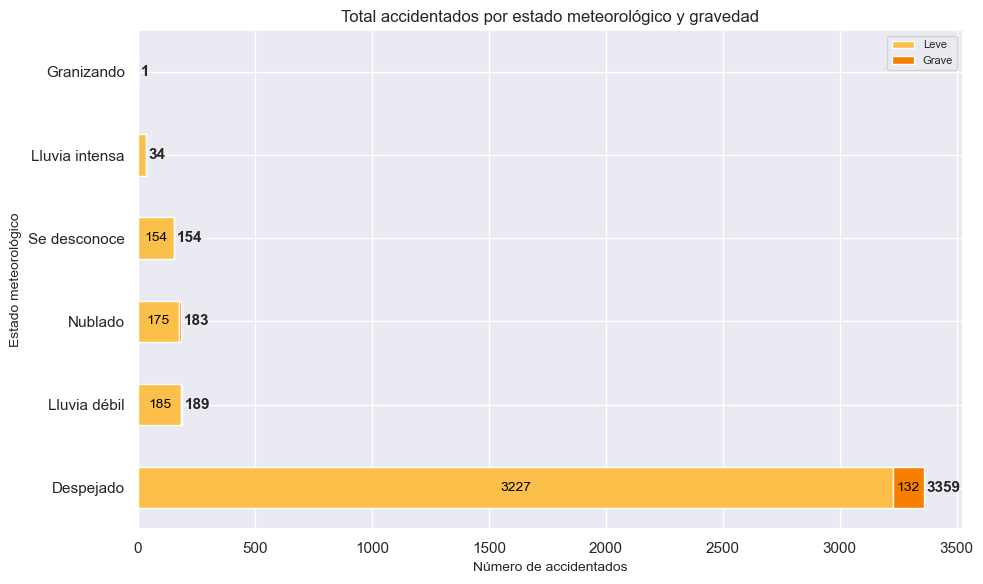

In [485]:
# Calcular el promedio de accidentes únicos por estado_meteorologico y gravedad
total_por_estado_meteorologico_gravedad = df_accidentes.groupby(['estado_meteorologico', 'gravedad'])['num_expediente'].count().unstack(level=1)
#total_por_estado_meteorologico_gravedad = df_accidentes.drop_duplicates('num_expediente').groupby(['estado_meteorologico', 'gravedad'])['num_expediente'].count().unstack(level=1)
total_por_estado_meteorologico_gravedad.columns = ['Leve', 'Grave']

# Se ordenan de mayor a menor número de accidentes
total_por_estado_meteorologico_gravedad['Total'] = total_por_estado_meteorologico_gravedad.sum(axis=1)
total_por_estado_meteorologico_gravedad = total_por_estado_meteorologico_gravedad.sort_values(['Total'], ascending = False).drop(columns=['Total'])

print(total_por_estado_meteorologico_gravedad)

ax = total_por_estado_meteorologico_gravedad.fillna(0.01).plot.barh(stacked=True, figsize=(10, 6), color=['#fcbf49','#f77f00'])

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 100 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.xlabel('Número de accidentados', fontsize=10)
plt.ylabel('Estado meteorológico', fontsize=10)
plt.title('Total accidentados por estado meteorológico y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

plt.tight_layout()
plt.show()


#### Tipo de vehículo

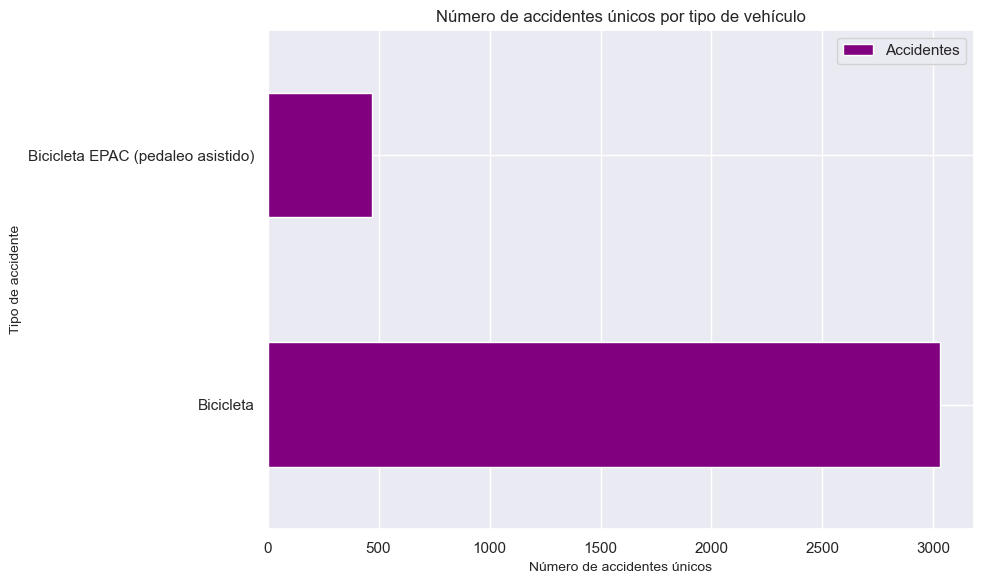

In [486]:
ax = df_accidentes.groupby(by='tipo_vehiculo').agg({'num_expediente':'nunique'}).sort_values(by='num_expediente', ascending=False).plot(kind='barh', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.ylabel('Tipo de accidente', fontsize=10)
plt.xlabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por tipo de vehículo')

labels = [item.get_text() for item in ax.get_xticklabels()]


# Cambiar el label de la leyenda
ax.legend(["Accidentes"])
plt.tight_layout()
plt.show()

In [487]:
df_accidentes.tipo_vehiculo.value_counts()*100 / df_accidentes.count()[0]

Bicicleta                            86.862245
Bicicleta EPAC (pedaleo asistido)    13.137755
Name: tipo_vehiculo, dtype: float64

                                   Leve  Grave
tipo_vehiculo                                 
Bicicleta                          3277    128
Bicicleta EPAC (pedaleo asistido)   498     17


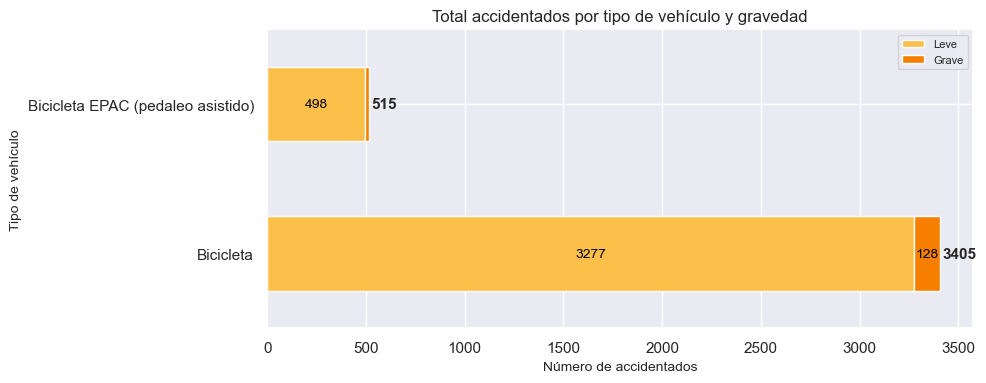

In [488]:
# Calcular el promedio de accidentes únicos por tipo_vehiculo y gravedad
total_por_tipo_vehiculo_gravedad = df_accidentes.groupby(['tipo_vehiculo', 'gravedad'])['num_expediente'].count().unstack(level=1)
total_por_tipo_vehiculo_gravedad.columns = ['Leve', 'Grave']

# Se ordenan de mayor a menor número de accidentes
total_por_tipo_vehiculo_gravedad['Total'] = total_por_tipo_vehiculo_gravedad.sum(axis=1)
total_por_tipo_vehiculo_gravedad = total_por_tipo_vehiculo_gravedad.sort_values(['Total'], ascending = False).drop(columns=['Total'])

print(total_por_tipo_vehiculo_gravedad)

ax = total_por_tipo_vehiculo_gravedad.fillna(0.01).plot.barh(stacked=True, figsize=(10, 4), color=['#fcbf49','#f77f00'])

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 25 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.xlabel('Número de accidentados', fontsize=10)
plt.ylabel('Tipo de vehículo', fontsize=10)
plt.title('Total accidentados por tipo de vehículo y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [489]:
total_por_tipo_vehiculo_gravedad['Grave'] * 100 / (total_por_tipo_vehiculo_gravedad['Leve'] )

tipo_vehiculo
Bicicleta                            3.906012
Bicicleta EPAC (pedaleo asistido)    3.413655
dtype: float64

#### Tipo de persona

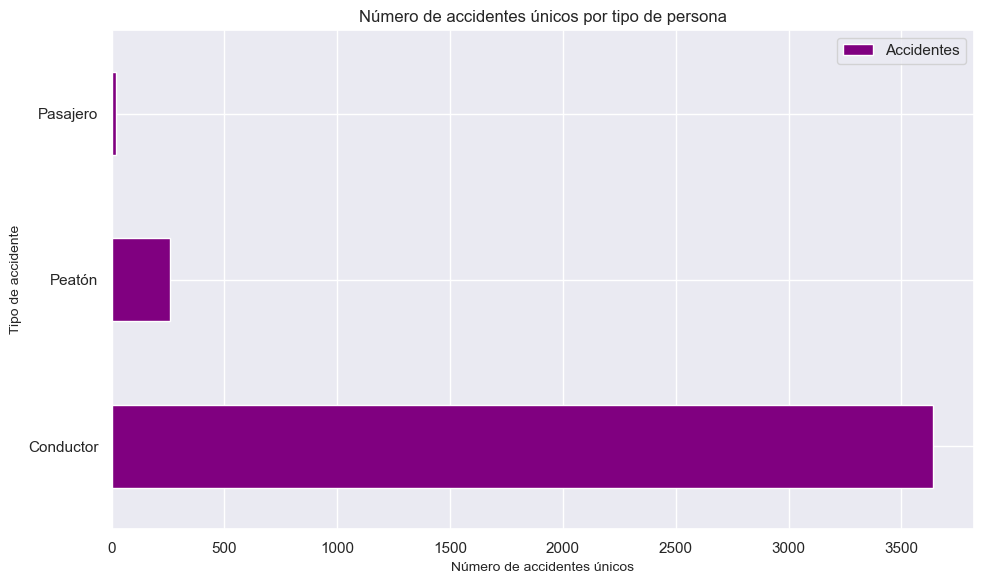

In [490]:
ax = df_accidentes.groupby(by='tipo_persona').agg({'num_expediente':'count'}).sort_values(by='num_expediente', ascending=False).plot(kind='barh', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.ylabel('Tipo de accidente', fontsize=10)
plt.xlabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por tipo de persona')

labels = [item.get_text() for item in ax.get_xticklabels()]


# Cambiar el label de la leyenda
ax.legend(["Accidentes"])
plt.tight_layout()
plt.show()

In [491]:
df_accidentes.tipo_persona.value_counts()*100 / df_accidentes.count()[0]

Conductor    92.857143
Peatón        6.632653
Pasajero      0.510204
Name: tipo_persona, dtype: float64

                Leve  Grave
tipo_persona               
Conductor     3503.0  137.0
Peatón         252.0    8.0
Pasajero        20.0    NaN


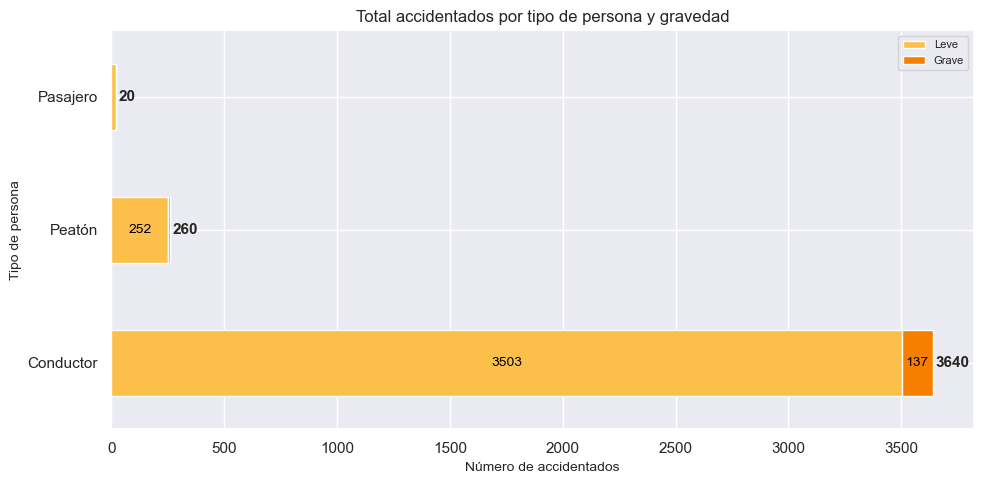

In [492]:
# Calcular el promedio de accidentes únicos por tipo_persona y gravedad
total_por_tipo_persona_gravedad = df_accidentes.groupby(['tipo_persona', 'gravedad'])['num_expediente'].count().unstack(level=1)
total_por_tipo_persona_gravedad.columns = ['Leve', 'Grave']

# Se ordenan de mayor a menor número de accidentes
total_por_tipo_persona_gravedad['Total'] = total_por_tipo_persona_gravedad.sum(axis=1)
total_por_tipo_persona_gravedad = total_por_tipo_persona_gravedad.sort_values(['Total'], ascending = False).drop(columns=['Total'])

print(total_por_tipo_persona_gravedad)

ax = total_por_tipo_persona_gravedad.fillna(0.01).plot.barh(stacked=True, figsize=(10, 5), color=['#fcbf49','#f77f00'])

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 25 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.xlabel('Número de accidentados', fontsize=10)
plt.ylabel('Tipo de persona', fontsize=10)
plt.title('Total accidentados por tipo de persona y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [493]:
total_por_tipo_persona_gravedad['Grave'] * 100 / (total_por_tipo_persona_gravedad['Leve'] )

tipo_persona
Conductor    3.910933
Peatón       3.174603
Pasajero          NaN
dtype: float64

#### Rango de edad

In [494]:
df_accidentes.rango_edad.value_counts()*100 / df_accidentes.count()[0]

De 25 a 29 años    13.188776
De 30 a 34 años    11.479592
De 35 a 39 años    10.102041
De 40 a 44 años     9.413265
De 45 a 49 años     8.724490
De 21 a 24 años     8.596939
De 50 a 54 años     7.653061
De 55 a 59 años     6.683673
De 18 a 20 años     5.408163
De 60 a 64 años     3.494898
De 15 a 17 años     3.214286
De 10 a 14 años     3.035714
De 65 a 69 años     2.295918
Desconocido         1.913265
Más de 74 años      1.581633
De 70 a 74 años     1.505102
De 6 a 9 años       0.994898
Menor de 5 años     0.714286
Name: rango_edad, dtype: float64

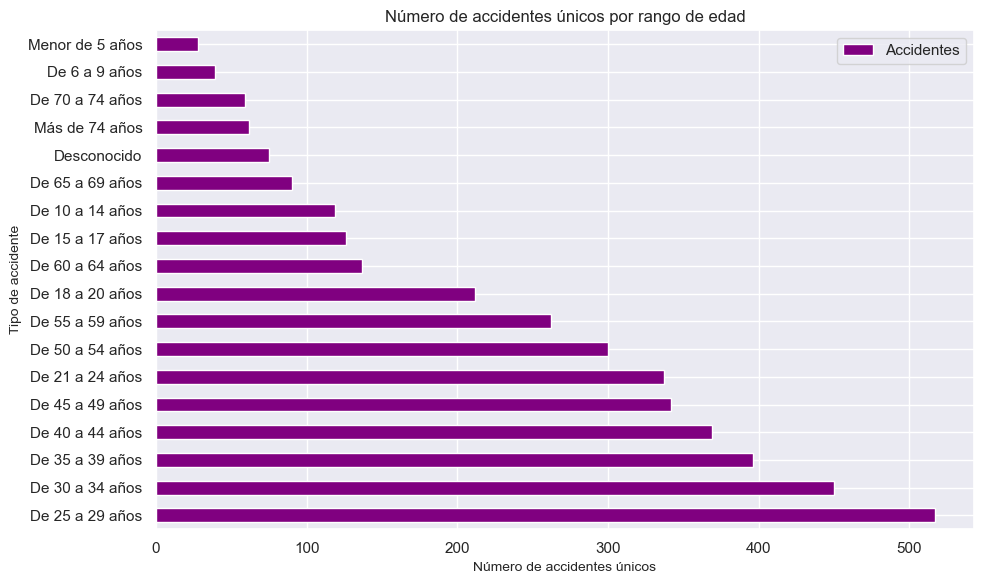

In [495]:
ax = df_accidentes.groupby(by='rango_edad').agg({'num_expediente':'count'}).sort_values(by='num_expediente', ascending=False).plot(kind='barh', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.ylabel('Tipo de accidente', fontsize=10)
plt.xlabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por rango de edad')

labels = [item.get_text() for item in ax.get_xticklabels()]


# Cambiar el label de la leyenda
ax.legend(["Accidentes"])
plt.tight_layout()
plt.show()

                  Leve  Grave
rango_edad                   
De 25 a 29 años  509.0    8.0
De 30 a 34 años  432.0   18.0
De 35 a 39 años  384.0   12.0
De 40 a 44 años  348.0   21.0
De 45 a 49 años  322.0   20.0
De 21 a 24 años  333.0    4.0
De 50 a 54 años  286.0   14.0
De 55 a 59 años  253.0    9.0
De 18 a 20 años  209.0    3.0
De 60 a 64 años  128.0    9.0
De 15 a 17 años  123.0    3.0
De 10 a 14 años  113.0    6.0
De 65 a 69 años   84.0    6.0
Desconocido       75.0    NaN
Más de 74 años    58.0    4.0
De 70 a 74 años   53.0    6.0
De 6 a 9 años     38.0    1.0
Menor de 5 años   27.0    1.0


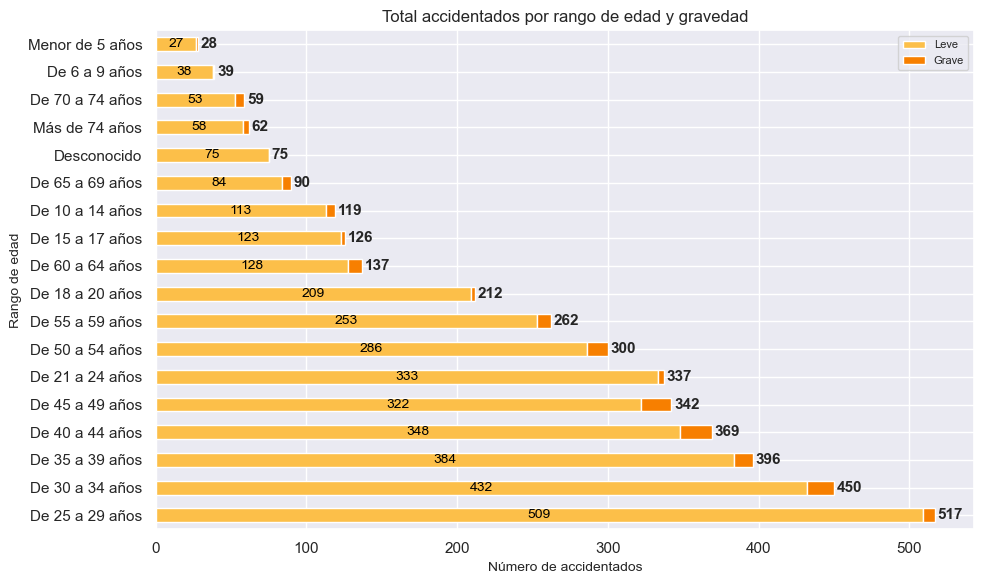

In [496]:
# Calcular el promedio de accidentes únicos por rango_edad y gravedad
total_por_rango_edad_gravedad = df_accidentes.groupby(['rango_edad', 'gravedad'])['num_expediente'].count().unstack(level=1)
total_por_rango_edad_gravedad.columns = ['Leve', 'Grave']

# Se ordenan de mayor a menor número de accidentes
total_por_rango_edad_gravedad['Total'] = total_por_rango_edad_gravedad.sum(axis=1)
total_por_rango_edad_gravedad = total_por_rango_edad_gravedad.sort_values(['Total'], ascending = False).drop(columns=['Total'])

print(total_por_rango_edad_gravedad)

ax = total_por_rango_edad_gravedad.fillna(0.01).plot.barh(stacked=True, figsize=(10, 6), color=['#fcbf49','#f77f00'])

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 25 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.xlabel('Número de accidentados', fontsize=10)
plt.ylabel('Rango de edad', fontsize=10)
plt.title('Total accidentados por rango de edad y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [497]:
(total_por_rango_edad_gravedad['Grave'] * 100 / (total_por_rango_edad_gravedad['Leve'] )).sort_values(ascending=False)

rango_edad
De 70 a 74 años    11.320755
De 65 a 69 años     7.142857
De 60 a 64 años     7.031250
Más de 74 años      6.896552
De 45 a 49 años     6.211180
De 40 a 44 años     6.034483
De 10 a 14 años     5.309735
De 50 a 54 años     4.895105
De 30 a 34 años     4.166667
Menor de 5 años     3.703704
De 55 a 59 años     3.557312
De 35 a 39 años     3.125000
De 6 a 9 años       2.631579
De 15 a 17 años     2.439024
De 25 a 29 años     1.571709
De 18 a 20 años     1.435407
De 21 a 24 años     1.201201
Desconocido              NaN
dtype: float64

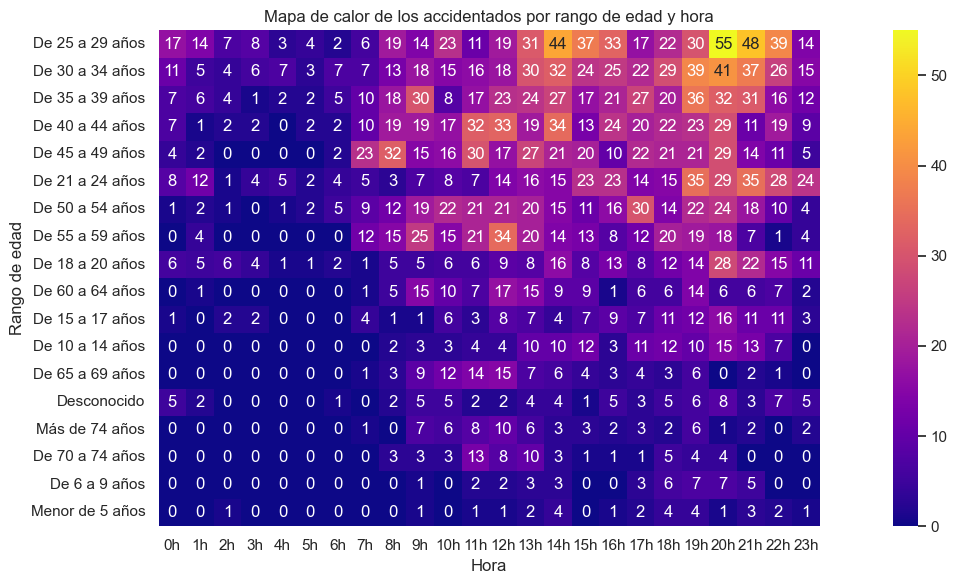

In [498]:
# Convertir la columna 'hora_acc' al formato de tiempo
df_accidentes['hora_acc'] = pd.to_datetime(df_accidentes['hora_acc'], format='%H:%M:%S')

# Extraer solo la hora de la columna 'hora_acc'
df_accidentes['hora_solo_acc'] = df_accidentes['hora_acc'].dt.hour

heatmap_pt = df_accidentes.pivot_table(columns='hora_solo_acc', index='rango_edad', aggfunc='size', fill_value=0)

# Se ordenan de mayor a menor número de accidentes
heatmap_pt['Total'] = heatmap_pt.sum(axis=1)
heatmap_pt = heatmap_pt.sort_values(['Total'], ascending = False).drop(columns=['Total']).head(30)

# Si hay alguna hora que no tiene registros, se crea la columna vacía
for i in range(0,24):
    if i not in heatmap_pt.columns:
       heatmap_pt[i] = 0
heatmap_pt = heatmap_pt[list(range(24))]

fig, ax = plt.subplots(figsize=(15,6))

sns.set()
ax = sns.heatmap(heatmap_pt, cmap="plasma", annot=True, square=True, cbar=True)

# Cambiar etiquetas del eje X (horas)
horas_etiquetas = [f"{hora}h" for hora in range(24)]
ax.set_xticklabels(horas_etiquetas, rotation=0)

plt.xlabel('Hora')
plt.ylabel('Rango de edad')
plt.title('Mapa de calor de los accidentados por rango de edad y hora')

plt.tight_layout() 

# Ajustar tamaño de la barra de colores
#cbar_ax = fig.add_axes([0.88, 0.16, 0.012, 0.75])  # Ajusta los valores según tus preferencias
#cbar = fig.colorbar(ax.collections[0], cax=cbar_ax)
#cbar.set_label('Número de accidentes', fontsize=12, loc="center", labelpad=10)

plt.show()

#### Sexo

In [499]:
df_accidentes.sexo.value_counts()*100 / df_accidentes.count()[0]

Hombre         74.897959
Mujer          23.392857
Desconocido     1.709184
Name: sexo, dtype: float64

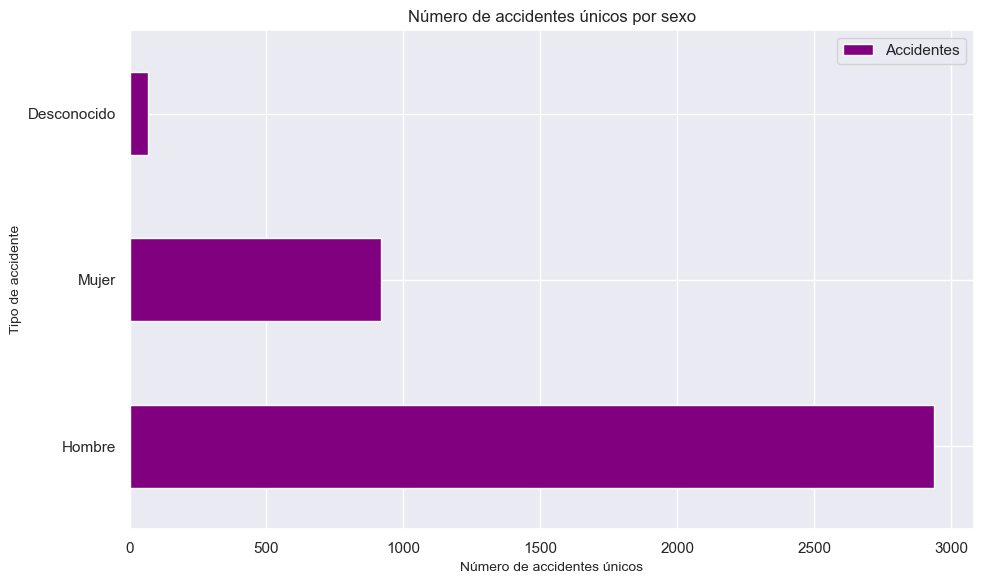

In [500]:
ax = df_accidentes.groupby(by='sexo').agg({'num_expediente':'count'}).sort_values(by='num_expediente', ascending=False).plot(kind='barh', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.ylabel('Tipo de accidente', fontsize=10)
plt.xlabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por sexo')

labels = [item.get_text() for item in ax.get_xticklabels()]


# Cambiar el label de la leyenda
ax.legend(["Accidentes"])
plt.tight_layout()
plt.show()

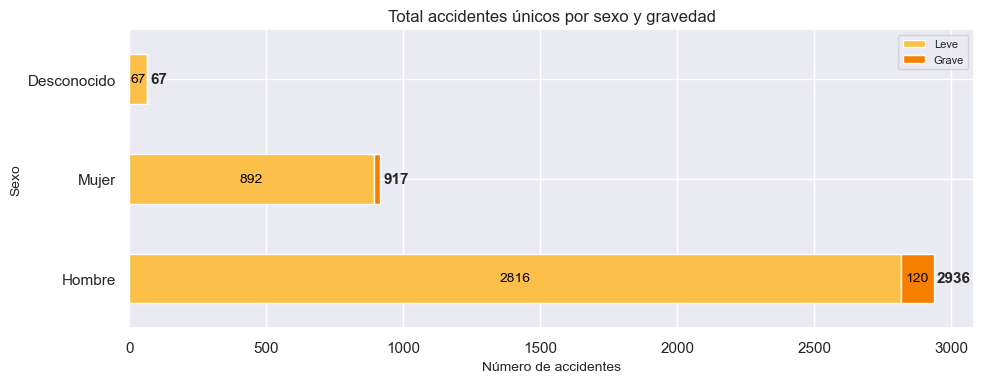

In [501]:
# Calcular el promedio de accidentes únicos por sexo y gravedad
total_por_sexo_gravedad = df_accidentes.groupby(['sexo', 'gravedad'])['num_expediente'].count().unstack(level=1)
total_por_sexo_gravedad.columns = ['Leve', 'Grave']

# Se ordenan de mayor a menor número de accidentes
total_por_sexo_gravedad['Total'] = total_por_sexo_gravedad.sum(axis=1)
total_por_sexo_gravedad = total_por_sexo_gravedad.sort_values(['Total'], ascending = False).drop(columns=['Total'])

total_por_sexo_gravedad

ax = total_por_sexo_gravedad.fillna(0.01).plot.barh(stacked=True, figsize=(10, 4), color=['#fcbf49','#f77f00'])

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 25 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.xlabel('Número de accidentes', fontsize=10)
plt.ylabel('Sexo', fontsize=10)
plt.title('Total accidentes únicos por sexo y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [502]:
(total_por_sexo_gravedad['Grave'] * 100 / (total_por_sexo_gravedad['Leve'] )).sort_values(ascending=False)

sexo
Hombre         4.261364
Mujer          2.802691
Desconocido         NaN
dtype: float64

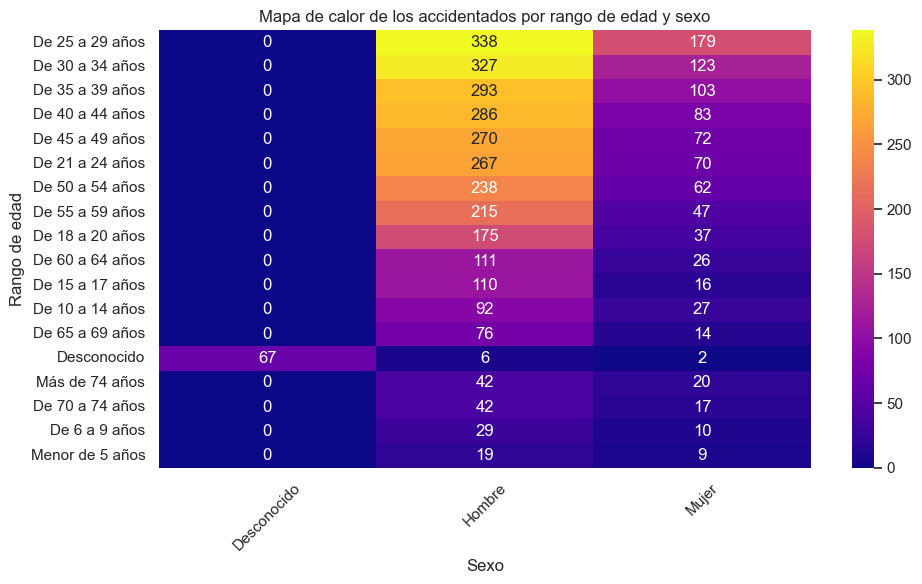

In [503]:
heatmap_pt = df_accidentes.pivot_table(columns='sexo', index='rango_edad', aggfunc='size', fill_value=0)

# Se ordenan de mayor a menor número de accidentes
heatmap_pt['Total'] = heatmap_pt.sum(axis=1)
heatmap_pt = heatmap_pt.sort_values(['Total'], ascending = False).drop(columns=['Total']).head(30)


fig, ax = plt.subplots(figsize=(10,6))

sns.set()
ax = sns.heatmap(heatmap_pt, cmap="plasma", annot=True, fmt='.0f', square=False, cbar=True)

# Cambiar etiquetas del eje X (horas)
horas_etiquetas = heatmap_pt.columns
ax.set_xticklabels(horas_etiquetas, rotation=45)

plt.xlabel('Sexo')
plt.ylabel('Rango de edad')
plt.title('Mapa de calor de los accidentados por rango de edad y sexo')

plt.tight_layout() 

# Ajustar tamaño de la barra de colores
#cbar_ax = fig.add_axes([0.88, 0.16, 0.012, 0.75])  # Ajusta los valores según tus preferencias
#cbar = fig.colorbar(ax.collections[0], cax=cbar_ax)
#cbar.set_label('Número de accidentes', fontsize=12, loc="center", labelpad=10)

plt.show()

#### Positivo en alcohol

In [504]:
df_accidentes.positiva_alcohol.value_counts()*100 / df_accidentes.count()[0]

N    98.647959
S     1.352041
Name: positiva_alcohol, dtype: float64

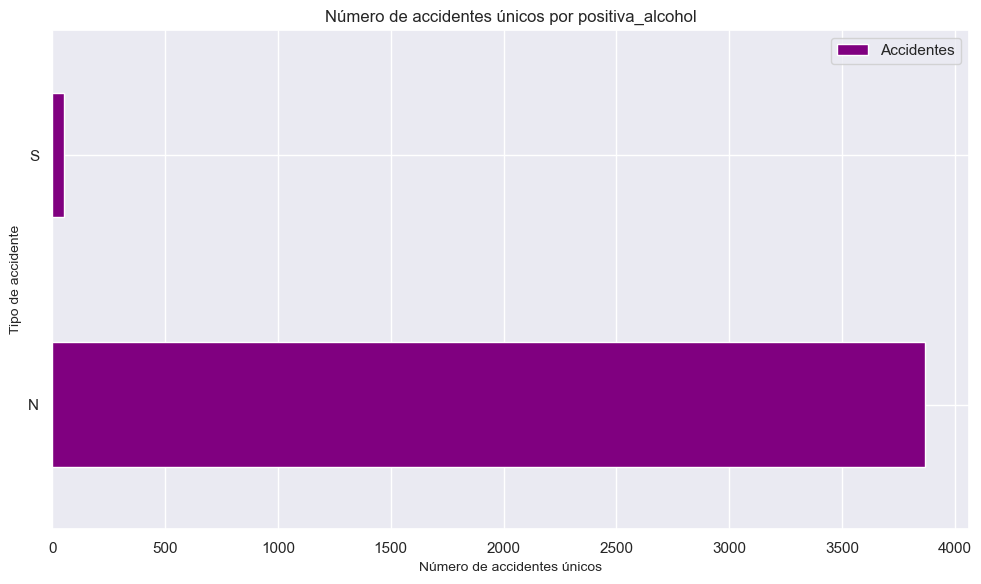

In [505]:
ax = df_accidentes.groupby(by='positiva_alcohol').agg({'num_expediente':'count'}).sort_values(by='num_expediente', ascending=False).plot(kind='barh', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.ylabel('Tipo de accidente', fontsize=10)
plt.xlabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por positiva_alcohol')

labels = [item.get_text() for item in ax.get_xticklabels()]


# Cambiar el label de la leyenda
ax.legend(["Accidentes"])
plt.tight_layout()
plt.show()

                  Leve  Grave
positiva_alcohol             
N                 3723    144
S                   52      1


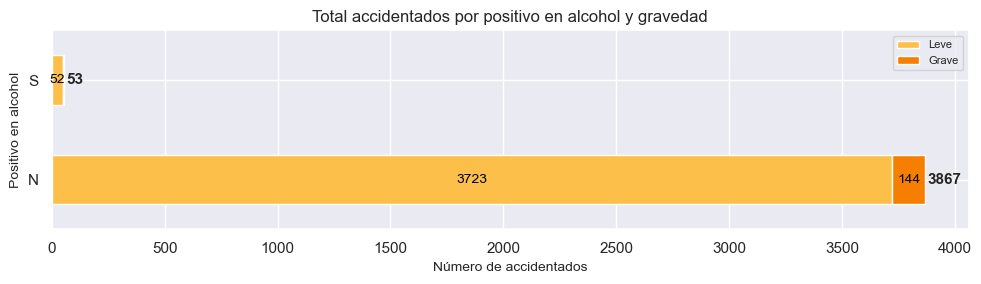

In [506]:
# Calcular el promedio de accidentes únicos por ##### y gravedad
total_por_positiva_alcohol_gravedad = df_accidentes.groupby(['positiva_alcohol', 'gravedad'])['num_expediente'].count().unstack(level=1)
total_por_positiva_alcohol_gravedad.columns = ['Leve', 'Grave']

# Se ordenan de mayor a menor número de accidentes
total_por_positiva_alcohol_gravedad['Total'] = total_por_positiva_alcohol_gravedad.sum(axis=1)
total_por_positiva_alcohol_gravedad = total_por_positiva_alcohol_gravedad.sort_values(['Total'], ascending = False).drop(columns=['Total'])

print(total_por_positiva_alcohol_gravedad)

ax = total_por_positiva_alcohol_gravedad.fillna(0.01).plot.barh(stacked=True, figsize=(10, 3), color=['#fcbf49','#f77f00'])

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 25 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.xlabel('Número de accidentados', fontsize=10)
plt.ylabel('Positivo en alcohol', fontsize=10)
plt.title('Total accidentados por positivo en alcohol y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [507]:
(total_por_positiva_alcohol_gravedad['Grave'] * 100 / (total_por_positiva_alcohol_gravedad['Leve'] )).sort_values(ascending=False)

positiva_alcohol
N    3.867849
S    1.923077
dtype: float64

#### Positivo en droga

In [508]:
df_accidentes.positiva_droga.value_counts()*100 / df_accidentes.count()[0]

0.0    99.821429
1.0     0.178571
Name: positiva_droga, dtype: float64

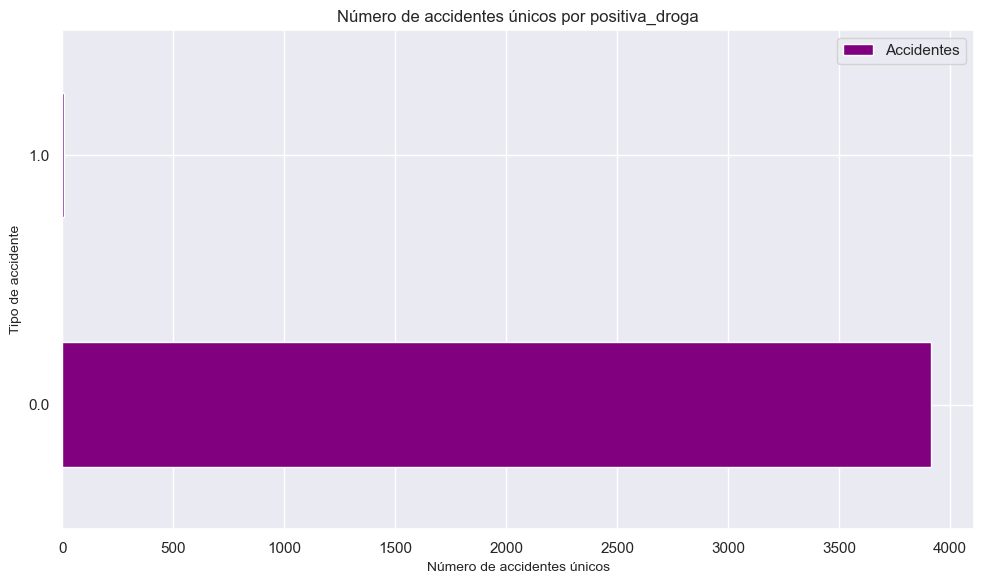

In [509]:
ax = df_accidentes.groupby(by='positiva_droga').agg({'num_expediente':'count'}).sort_values(by='num_expediente', ascending=False).plot(kind='barh', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.ylabel('Tipo de accidente', fontsize=10)
plt.xlabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por positiva_droga')

labels = [item.get_text() for item in ax.get_xticklabels()]


# Cambiar el label de la leyenda
ax.legend(["Accidentes"])
plt.tight_layout()
plt.show()

                  Leve  Grave
positiva_droga               
0.0             3768.0  145.0
1.0                7.0    NaN


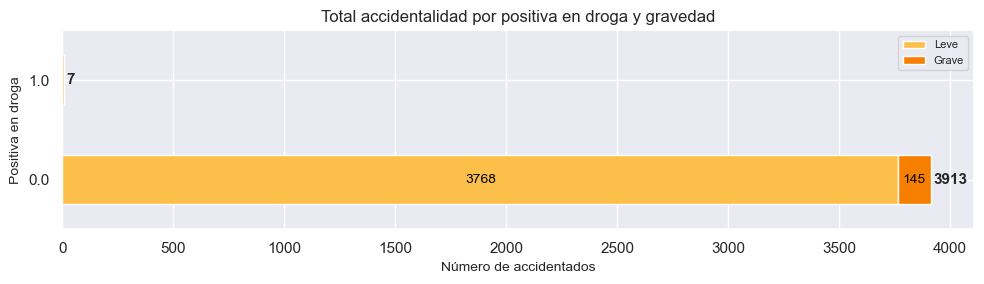

In [510]:
# Calcular el promedio de accidentes únicos por positiva_droga y gravedad
total_por_positiva_droga_gravedad = df_accidentes.groupby(['positiva_droga', 'gravedad'])['num_expediente'].count().unstack(level=1)
total_por_positiva_droga_gravedad.columns = ['Leve', 'Grave']

# Se ordenan de mayor a menor número de accidentes
total_por_positiva_droga_gravedad['Total'] = total_por_positiva_droga_gravedad.sum(axis=1)
total_por_positiva_droga_gravedad = total_por_positiva_droga_gravedad.sort_values(['Total'], ascending = False).drop(columns=['Total'])

print(total_por_positiva_droga_gravedad)

ax = total_por_positiva_droga_gravedad.fillna(0.01).plot.barh(stacked=True, figsize=(10, 3), color=['#fcbf49','#f77f00'])

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 25 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.xlabel('Número de accidentados', fontsize=10)
plt.ylabel('Positiva en droga', fontsize=10)
plt.title('Total accidentalidad por positiva en droga y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [511]:
(total_por_positiva_droga_gravedad['Grave'] * 100 / (total_por_positiva_droga_gravedad['Leve'] )).sort_values(ascending=False)

positiva_droga
0.0    3.848195
1.0         NaN
dtype: float64

#### Tráfico de la vía: tipo de elemento de medida, intensidad, ocupación, carga, velocidad media

In [512]:
# Se corrije una errata
df_accidentes['tipo_elem_pmed'] = df_accidentes['tipo_elem_pmed'].replace('C30', 'M30')

In [513]:
df_accidentes.tipo_elem_pmed.value_counts()*100 / df_accidentes.count()[0]

URB    91.658163
M30     8.341837
Name: tipo_elem_pmed, dtype: float64

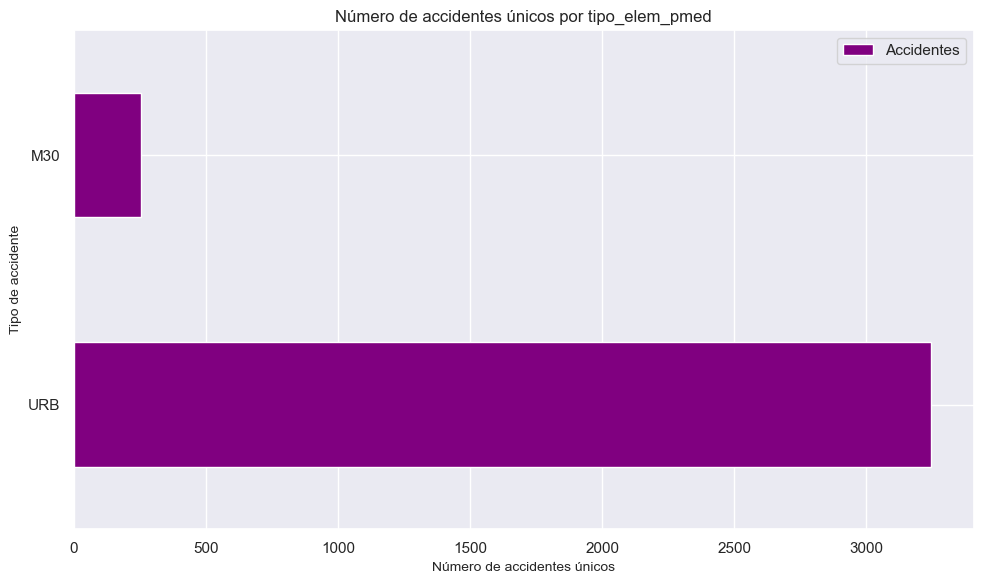

In [514]:
ax = df_accidentes.groupby(by='tipo_elem_pmed').agg({'num_expediente':'nunique'}).sort_values(by='num_expediente', ascending=False).plot(kind='barh', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.ylabel('Tipo de accidente', fontsize=10)
plt.xlabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por tipo_elem_pmed')

labels = [item.get_text() for item in ax.get_xticklabels()]


# Cambiar el label de la leyenda
ax.legend(["Accidentes"])
plt.tight_layout()
plt.show()

                Leve  Grave
tipo_elem_pmed             
URB             3463    130
M30              312     15


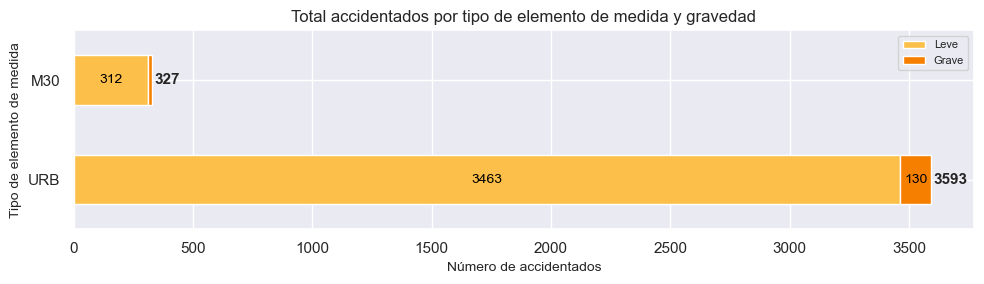

In [515]:
# Calcular el promedio de accidentes únicos por tipo_elem_pmed y gravedad
total_por_tipo_elem_pmed_gravedad = df_accidentes.groupby(['tipo_elem_pmed', 'gravedad'])['num_expediente'].count().unstack(level=1)
total_por_tipo_elem_pmed_gravedad.columns = ['Leve', 'Grave']

# Se ordenan de mayor a menor número de accidentes
total_por_tipo_elem_pmed_gravedad['Total'] = total_por_tipo_elem_pmed_gravedad.sum(axis=1)
total_por_tipo_elem_pmed_gravedad = total_por_tipo_elem_pmed_gravedad.sort_values(['Total'], ascending = False).drop(columns=['Total'])

print(total_por_tipo_elem_pmed_gravedad)

ax = total_por_tipo_elem_pmed_gravedad.fillna(0.01).plot.barh(stacked=True, figsize=(10, 3), color=['#fcbf49','#f77f00'])

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 25 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.xlabel('Número de accidentados', fontsize=10)
plt.ylabel('Tipo de elemento de medida', fontsize=10)
plt.title('Total accidentados por tipo de elemento de medida y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [516]:
(total_por_tipo_elem_pmed_gravedad['Grave'] * 100 / (total_por_tipo_elem_pmed_gravedad['Leve'] )).sort_values(ascending=False)

tipo_elem_pmed
M30    4.807692
URB    3.753971
dtype: float64

In [517]:
df_accidentes.drop_duplicates(['num_expediente'])[['intensidad', 'ocupacion','carga', 'vmed']].skew()

intensidad    3.110866
ocupacion     3.297232
carga         0.848267
vmed          3.673678
dtype: float64

In [518]:
df_accidentes.drop_duplicates(['num_expediente'])[['intensidad', 'ocupacion','carga', 'vmed']].describe()

,intensidad,ocupacion,carga,vmed
count,3498.000000,3498.000000,3498.000000,3498.000000
mean,555.245569,8.008576,24.720412,4.742996
std,656.305747,11.100108,17.760831,17.759457
min,0.000000,0.000000,0.000000,0.000000
25%,152.000000,2.000000,11.000000,0.000000
50%,347.500000,5.000000,22.000000,0.000000
75%,698.750000,9.000000,36.000000,0.000000
max,7080.000000,95.000000,100.000000,108.000000


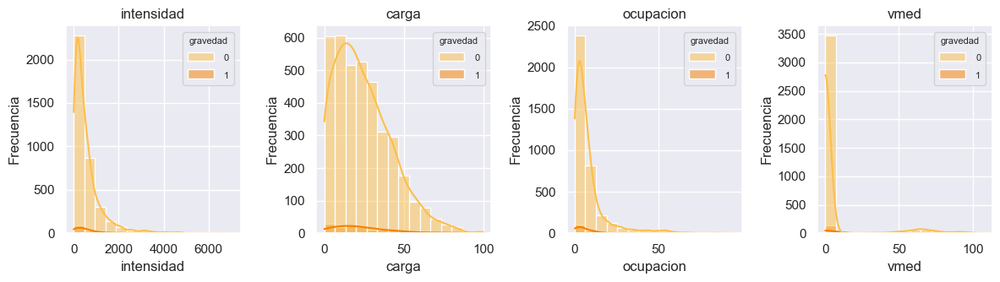

In [519]:
variables = ['intensidad','carga','ocupacion','vmed']

# Crear una matriz de subplots 3x3
fig, axes = plt.subplots(1, 4, figsize=(12, 3.5))
axes = axes.flatten()  # Convertir la matriz en un arreglo 1D

# Iterar sobre las variables y los subplots para crear los gráficos
for i, variable in enumerate(variables):
    ax = axes[i]
    sns.histplot(data=df_accidentes, x=variable, hue='gravedad', bins=15, kde=True, ax=ax, palette=['#fcbf49','#f77f00'], alpha=0.5)
    ax.set_title(variable)
    ax.set_xlabel(variable)
    ax.set_ylabel('Frecuencia')
    plt.setp(ax.get_legend().get_texts(), fontsize='8') # for legend text
    plt.setp(ax.get_legend().get_title(), fontsize='8') # for legend title

# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()


In [520]:
df_accidentes[df_accidentes['gravedad']==1][['intensidad','carga','ocupacion','vmed']].describe()

,intensidad,carga,ocupacion,vmed
count,145.000000,145.000000,145.000000,145.000000
mean,572.227586,23.724138,5.986207,6.903448
std,689.251957,19.313022,8.079455,21.733654
min,0.000000,0.000000,0.000000,0.000000
25%,164.000000,10.000000,2.000000,0.000000
50%,388.000000,19.000000,4.000000,0.000000
75%,736.000000,34.000000,8.000000,0.000000
max,4568.000000,100.000000,61.000000,93.000000


In [521]:
df_accidentes[df_accidentes['gravedad']==0][['intensidad','carga','ocupacion','vmed']].describe()

,intensidad,carga,ocupacion,vmed
count,3775.000000,3775.000000,3775.00000,3775.000000
mean,569.002914,24.477616,7.98543,5.358940
std,695.938638,17.857870,11.00099,18.655231
min,0.000000,0.000000,0.00000,0.000000
25%,152.000000,11.000000,2.00000,0.000000
50%,348.000000,21.000000,5.00000,0.000000
75%,699.500000,35.000000,9.00000,0.000000
max,7080.000000,100.000000,95.00000,108.000000


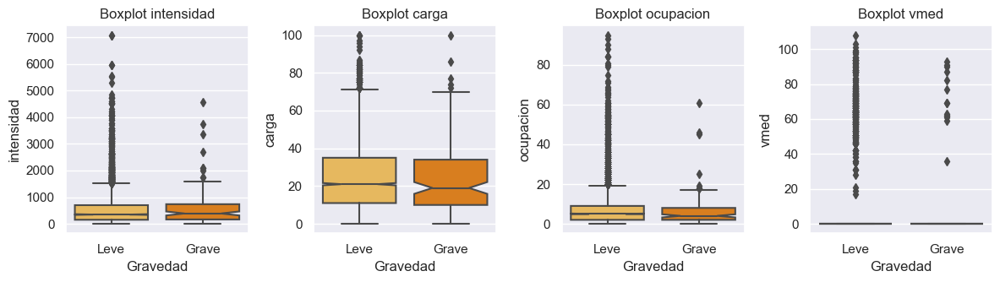

In [522]:
# Crear una matriz de subplots 3x3
fig, axes = plt.subplots(1, 4, figsize=(12, 3.5))
axes = axes.flatten()  # Convertir la matriz en un arreglo 1D

variables = ['intensidad','carga','ocupacion','vmed']

for i, variable in enumerate(variables):

    ax = axes[i]
    sns.boxplot(x='gravedad', y=variable, data=df_accidentes, notch=True, ax=ax, palette=['#fcbf49','#f77f00'])
    ax.set_title('Boxplot '+ variable)
    ax.set_xlabel('Gravedad')
    ax.set_ylabel(variable)
    custom_labels = ['Leve', 'Grave']
    ax.set_xticks(range(len(custom_labels)), custom_labels)


# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()


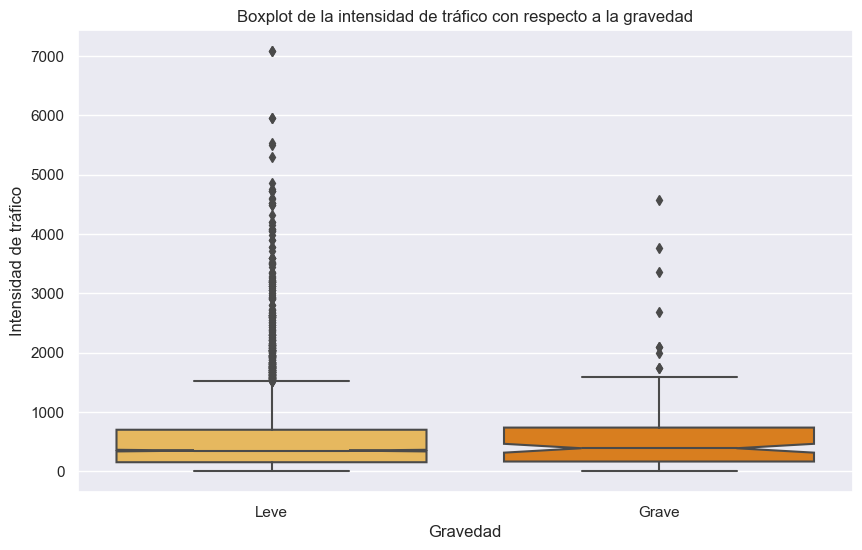

In [523]:
# Box Plot intensidad de tráfico
plt.figure(figsize=(10, 6))
sns.boxplot(x='gravedad', y='intensidad', data=df_accidentes, notch=True, palette=['#fcbf49','#f77f00'])
plt.title('Boxplot de la intensidad de tráfico con respecto a la gravedad')
plt.xlabel('Gravedad')
plt.ylabel('Intensidad de tráfico')
custom_labels = ['Leve', 'Grave']
plt.xticks(range(len(custom_labels)), custom_labels)
plt.show()

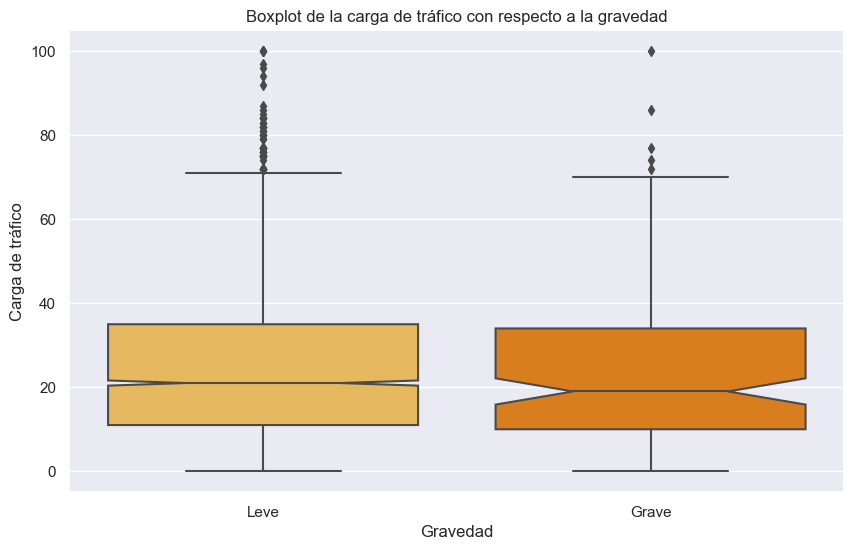

In [524]:
# Box Plot carga de tráfico
plt.figure(figsize=(10, 6))
sns.boxplot(x='gravedad', y='carga', data=df_accidentes, notch=True, palette=['#fcbf49','#f77f00'])
plt.title('Boxplot de la carga de tráfico con respecto a la gravedad')
plt.xlabel('Gravedad')
plt.ylabel('Carga de tráfico')
custom_labels = ['Leve', 'Grave']
plt.xticks(range(len(custom_labels)), custom_labels)
plt.show()

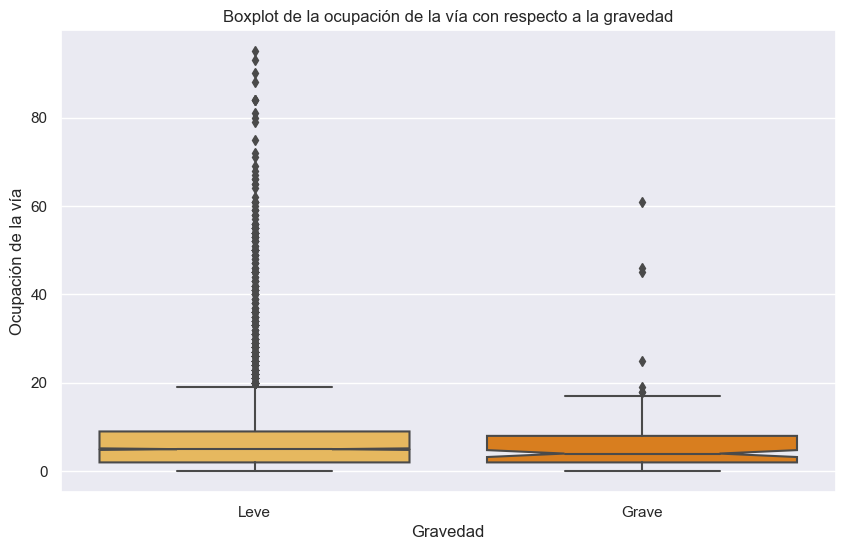

In [525]:
# Box Plot ocupación de la vía
plt.figure(figsize=(10, 6))
sns.boxplot(x='gravedad', y='ocupacion', data=df_accidentes, notch=True, palette=['#fcbf49','#f77f00'])
plt.title('Boxplot de la ocupación de la vía con respecto a la gravedad')
plt.xlabel('Gravedad')
plt.ylabel('Ocupación de la vía')
custom_labels = ['Leve', 'Grave']
plt.xticks(range(len(custom_labels)), custom_labels)
plt.show()

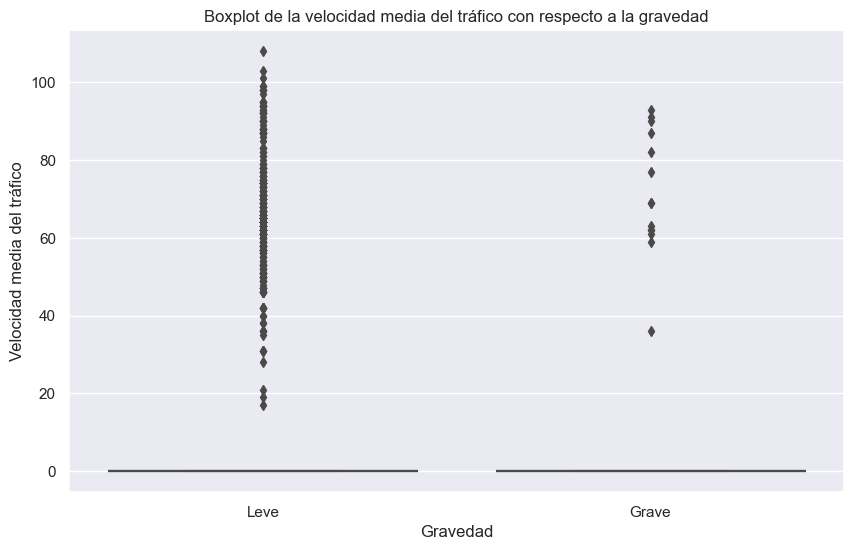

In [526]:
# Box Plot velocidad media
plt.figure(figsize=(10, 6))
sns.boxplot(x='gravedad', y='vmed', data=df_accidentes, notch=True, palette=['#fcbf49','#f77f00'])
plt.title('Boxplot de la velocidad media del tráfico con respecto a la gravedad')
plt.xlabel('Gravedad')
plt.ylabel('Velocidad media del tráfico')
custom_labels = ['Leve', 'Grave']
plt.xticks(range(len(custom_labels)), custom_labels)
plt.show()

In [527]:
df_accidentes.columns

Index(['num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc',
       'numero_acc', 'clase_via_acc_1', 'nombre_via_acc_1', 'numero_via_acc_1',
       'geometry', 'cod_distrito', 'nom_distrito', 'nom_barrio', 'cod_barrio',
       'cod_disbar', 'tipo_ruta', 'tipo_accidente', 'estado_meteorologico',
       'tipo_vehiculo', 'tipo_persona', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'rango_edad', 'sexo', 'cod_lesividad',
       'lesividad', 'utm_x_acc', 'utm_y_acc', 'positiva_alcohol',
       'positiva_droga', 'fecha_hora_med', 'id_pmed_mas_cercano',
       'tipo_elem_pmed', 'intensidad', 'ocupacion', 'carga', 'vmed', 'error',
       'periodo_integracion', 'cod_cent_pmed', 'nombre_pmed', 'utm_x_pmed',
       'utm_y_pmed', 'COD_NDP', 'COD_VIA', 'cruce', 'gravedad', 'mes_año',
       'año', 'mes', 'dia_semana', 'dia

In [528]:
df_accidentes.mes.nunique()

12

#### Implicados en cada accidente

In [529]:
df_accidentes[df_accidentes['gravedad']==1][[
    'implicados',
    'implicados_peatones',
    'implicados_pesados',
    'implicados_turismos',
    'implicados_motocicletas',
    'implicados_bicicletas',
    'implicados_otros',
    'implicados_epac',
    'implicados_ligeros'
]].describe()

,implicados,implicados_peatones,implicados_pesados,implicados_turismos,implicados_motocicletas,implicados_bicicletas,implicados_otros,implicados_epac,implicados_ligeros
count,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.0,145.000000,145.0
mean,1.868966,0.062069,0.075862,0.613793,0.055172,0.937931,0.0,0.124138,0.0
std,0.775091,0.242117,0.290659,0.818079,0.283316,0.394769,0.0,0.351243,0.0
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0
25%,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.000000,0.0
50%,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.000000,0.0
75%,2.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.0,0.000000,0.0
max,5.000000,1.000000,2.000000,4.000000,2.000000,2.000000,0.0,2.000000,0.0


In [530]:
df_accidentes[df_accidentes['gravedad']==0][[
    'implicados',
    'implicados_peatones',
    'implicados_pesados',
    'implicados_turismos',
    'implicados_motocicletas',
    'implicados_bicicletas',
    'implicados_otros',
    'implicados_epac',
    'implicados_ligeros'
]].describe()

,implicados,implicados_peatones,implicados_pesados,implicados_turismos,implicados_motocicletas,implicados_bicicletas,implicados_otros,implicados_epac,implicados_ligeros
count,3775.000000,3775.000000,3775.000000,3775.000000,3775.000000,3775.000000,3775.000000,3775.000000,3775.000000
mean,1.836556,0.140662,0.024636,0.532715,0.045828,0.950464,0.006623,0.139338,0.000265
std,0.694088,0.361175,0.218821,0.680898,0.233105,0.475621,0.081120,0.363515,0.016276
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,2.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,9.000000,2.000000,8.000000,5.000000,4.000000,4.000000,1.000000,2.000000,1.000000


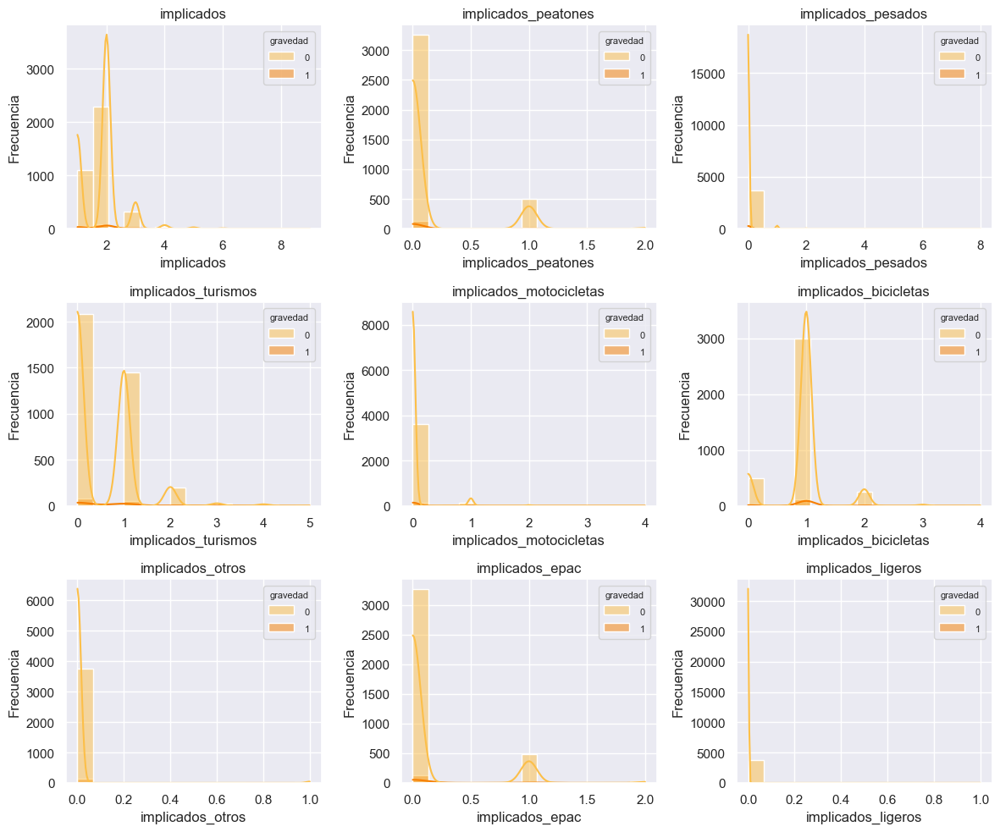

In [531]:
variables = [
    'implicados',
    'implicados_peatones',
    'implicados_pesados',
    'implicados_turismos',
    'implicados_motocicletas',
    'implicados_bicicletas',
    'implicados_otros',
    'implicados_epac',
    'implicados_ligeros'
]

# Crear una matriz de subplots 3x3
fig, axes = plt.subplots(3, 3, figsize=(12, 10))
axes = axes.flatten()  # Convertir la matriz en un arreglo 1D

# Iterar sobre las variables y los subplots para crear los gráficos
for i, variable in enumerate(variables):
    ax = axes[i]
    sns.histplot(data=df_accidentes, x=variable, hue='gravedad', bins=15, kde=True, ax=ax, palette=['#fcbf49','#f77f00'], alpha=0.5)
    ax.set_title(variable)
    ax.set_xlabel(variable)
    ax.set_ylabel('Frecuencia')
    plt.setp(ax.get_legend().get_texts(), fontsize='8') # for legend text
    plt.setp(ax.get_legend().get_title(), fontsize='8') # for legend title

# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()


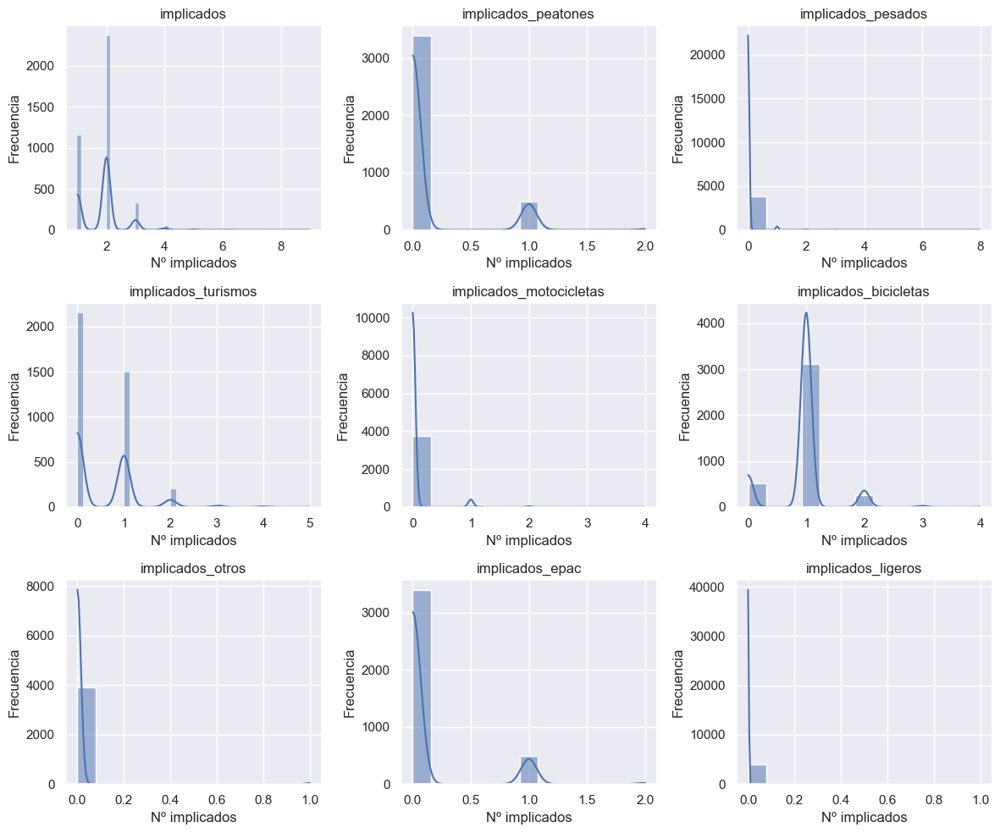

In [532]:
variables = [
    'implicados',
    'implicados_peatones',
    'implicados_pesados',
    'implicados_turismos',
    'implicados_motocicletas',
    'implicados_bicicletas',
    'implicados_otros',
    'implicados_epac',
    'implicados_ligeros'
]

# Crear una matriz de subplots 3x3
fig, axes = plt.subplots(3, 3, figsize=(12, 10))
axes = axes.flatten()  # Convertir la matriz en un arreglo 1D

# Iterar sobre las variables y los subplots para crear los gráficos
for i, variable in enumerate(variables):
    ax = axes[i]
    sns.histplot(df_accidentes[variable], kde=True, ax=ax)
    ax.set_title(variable)
    ax.set_xlabel('Nº implicados')
    ax.set_ylabel('Frecuencia')

# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()

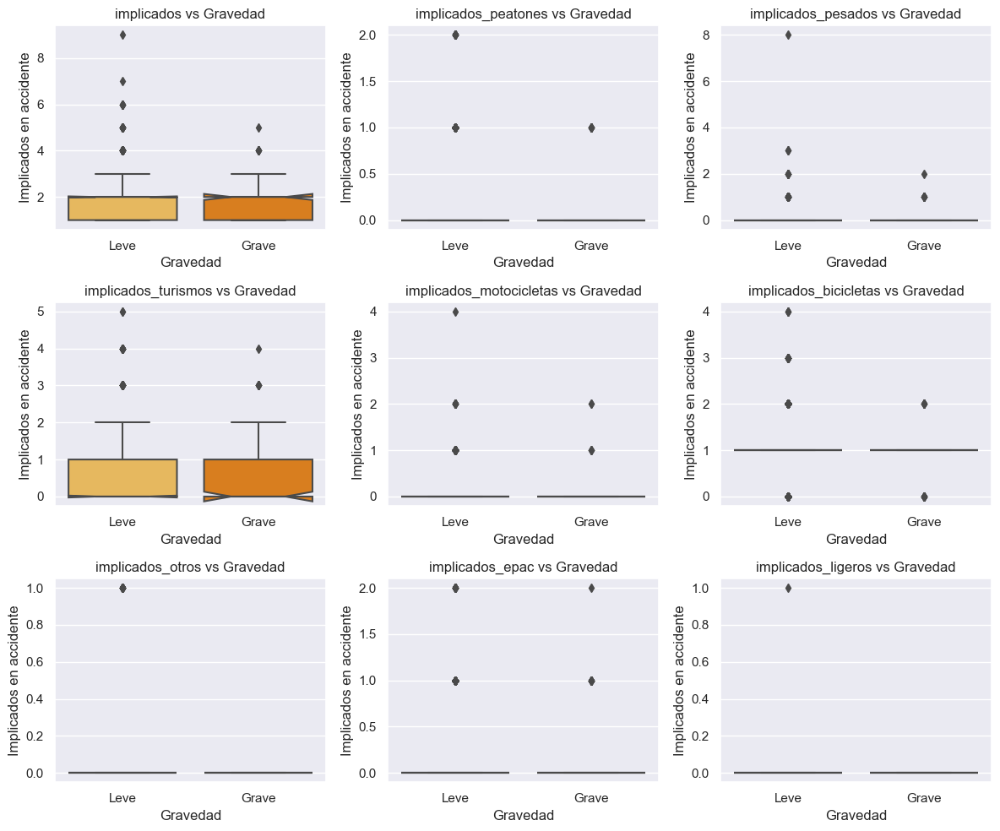

In [533]:
# Crear una matriz de subplots 3x3
fig, axes = plt.subplots(3, 3, figsize=(12, 10))
axes = axes.flatten()  # Convertir la matriz en un arreglo 1D

# Iterar sobre las variables y los subplots para crear los boxplots
for i, variable in enumerate(variables):
    ax = axes[i]
    sns.boxplot(x='gravedad', y=variable, data=df_accidentes, ax=ax, notch=True, palette=['#fcbf49','#f77f00'])
    ax.set_title(f'{variable} vs Gravedad')
    ax.set_xlabel('Gravedad')
    ax.set_ylabel('Implicados en accidente')
    custom_labels = ['Leve', 'Grave']
    ax.set_xticks(range(len(custom_labels)), custom_labels)


# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()

#### Tipo de ruta

In [534]:
df_accidentes.tipo_ruta.value_counts()*100 / df_accidentes.count()[0]

OTRO                     41.658163
VÍA USO COMPARTIDO       31.250000
VÍA EXCLUSIVA BICI       17.270408
ANILLO VERDE CICLISTA     9.566327
VÍA PREFERENTE BICI       0.127551
GIROS Y SENTIDOS          0.127551
Name: tipo_ruta, dtype: float64

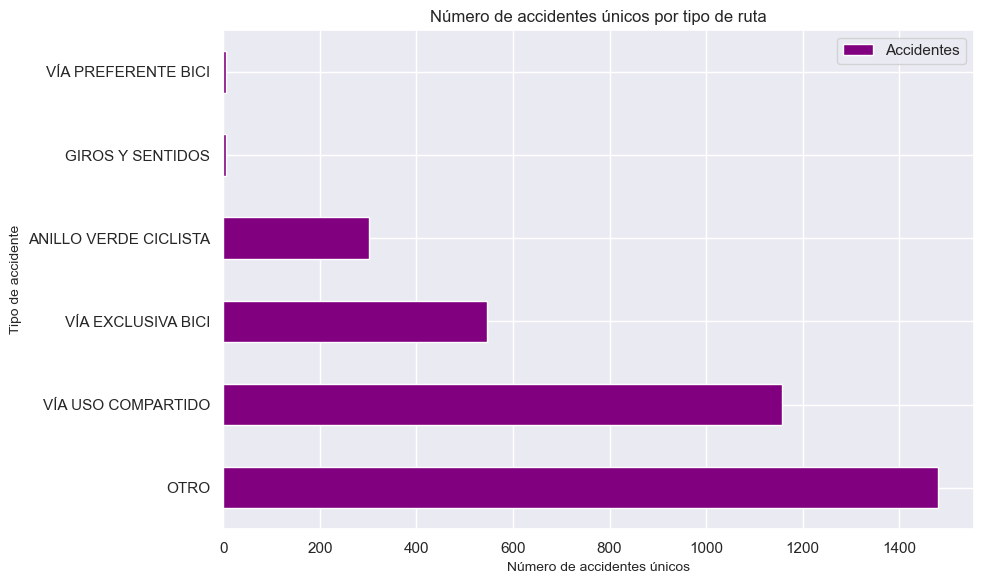

In [535]:
ax = df_accidentes.groupby(by='tipo_ruta').agg({'num_expediente':'nunique'}).sort_values(by='num_expediente', ascending=False).plot(kind='barh', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.ylabel('Tipo de accidente', fontsize=10)
plt.xlabel('Número de accidentes únicos', fontsize=10)
plt.title('Número de accidentes únicos por tipo de ruta')

labels = [item.get_text() for item in ax.get_xticklabels()]


# Cambiar el label de la leyenda
ax.legend(["Accidentes"])
plt.tight_layout()
plt.show()

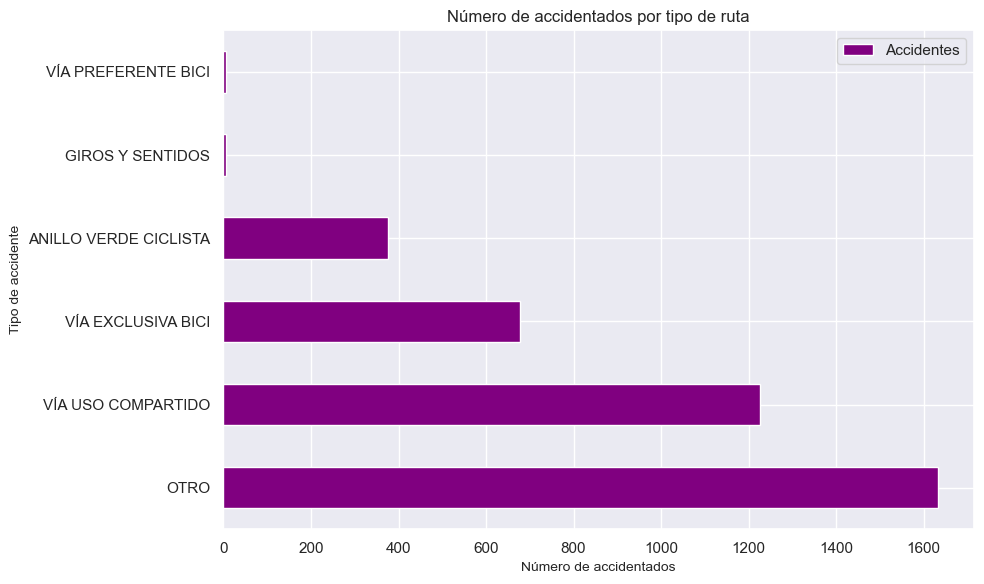

In [536]:
ax = df_accidentes.groupby(by='tipo_ruta').agg({'num_expediente':'count'}).sort_values(by='num_expediente', ascending=False).plot(kind='barh', color='purple', linestyle='-', label='Accidentes únicos', figsize=(10, 6))
plt.ylabel('Tipo de accidente', fontsize=10)
plt.xlabel('Número de accidentados', fontsize=10)
plt.title('Número de accidentados por tipo de ruta')

labels = [item.get_text() for item in ax.get_xticklabels()]


# Cambiar el label de la leyenda
ax.legend(["Accidentes"])
plt.tight_layout()
plt.show()

                         Leve  Grave
tipo_ruta                           
OTRO                   1573.0   60.0
VÍA USO COMPARTIDO     1188.0   37.0
VÍA EXCLUSIVA BICI      650.0   27.0
ANILLO VERDE CICLISTA   354.0   21.0
GIROS Y SENTIDOS          5.0    NaN
VÍA PREFERENTE BICI       5.0    NaN


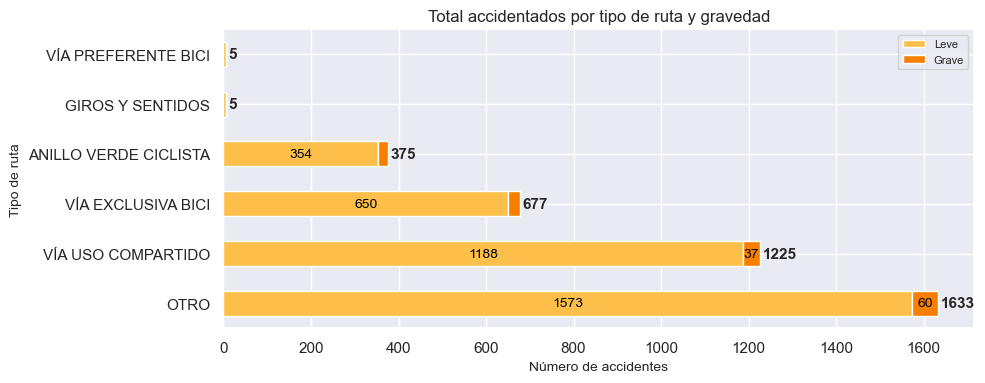

In [537]:
# Calcular el total de accidentes por tipo_vehiculo y gravedad
total_por_tipo_ruta_gravedad = df_accidentes.groupby(['tipo_ruta', 'gravedad'])['num_expediente'].count().unstack(level=1)
total_por_tipo_ruta_gravedad.columns = ['Leve', 'Grave']

# Se ordenan de mayor a menor número de accidentes
total_por_tipo_ruta_gravedad['Total'] = total_por_tipo_ruta_gravedad.sum(axis=1)
total_por_tipo_ruta_gravedad = total_por_tipo_ruta_gravedad.sort_values(['Total'], ascending = False).drop(columns=['Total'])

print(total_por_tipo_ruta_gravedad)

ax = total_por_tipo_ruta_gravedad.fillna(0.01).plot.barh(stacked=True, figsize=(10, 4), color=['#fcbf49','#f77f00'])

ax.bar_label(ax.containers[-1], fmt='%.0f', padding=2, fontsize=11, fontweight='bold') # default on top

for bars in ax.containers:
    labels = [f"{bar.get_width():.0f}" if bar.get_width() > 35 else '' for bar in bars]
    ax.bar_label(bars, labels=labels, label_type='center', color='black', fontsize=10)

plt.xlabel('Número de accidentes', fontsize=10)
plt.ylabel('Tipo de ruta', fontsize=10)
plt.title('Total accidentados por tipo de ruta y gravedad')
plt.xticks(rotation=0)
plt.grid(True)
plt.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [538]:
(total_por_tipo_ruta_gravedad['Grave'] * 100 / (total_por_tipo_ruta_gravedad['Leve'] )).sort_values(ascending=False)

tipo_ruta
ANILLO VERDE CICLISTA    5.932203
VÍA EXCLUSIVA BICI       4.153846
OTRO                     3.814367
VÍA USO COMPARTIDO       3.114478
GIROS Y SENTIDOS              NaN
VÍA PREFERENTE BICI           NaN
dtype: float64

In [539]:
((total_por_tipo_ruta_gravedad['Grave'] * 100 / (total_por_tipo_ruta_gravedad['Leve'] )).sort_values(ascending=False)[2]/(total_por_tipo_ruta_gravedad['Grave'] * 100 / (total_por_tipo_ruta_gravedad['Leve'] )).sort_values(ascending=False)[0])-1

-0.3570066297339025

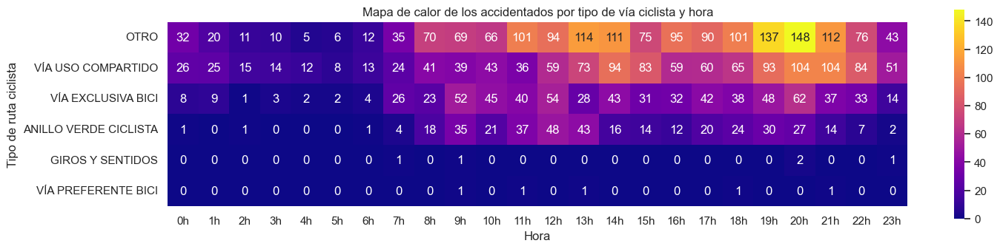

In [540]:
# Convertir la columna 'hora_acc' al formato de tiempo
df_accidentes['hora_acc'] = pd.to_datetime(df_accidentes['hora_acc'], format='%H:%M:%S')

# Extraer solo la hora de la columna 'hora_acc'
df_accidentes['hora_solo_acc'] = df_accidentes['hora_acc'].dt.hour

heatmap_pt = df_accidentes.pivot_table(columns='hora_solo_acc', index='tipo_ruta', aggfunc='size', fill_value=0)

# Se ordenan de mayor a menor número de accidentes
heatmap_pt['Total'] = heatmap_pt.sum(axis=1)
heatmap_pt = heatmap_pt.sort_values(['Total'], ascending = False).drop(columns=['Total']).head(11)

# Si hay alguna hora que no tiene registros, se crea la columna vacía
for i in range(0,24):
    if i not in heatmap_pt.columns:
       heatmap_pt[i] = 0
heatmap_pt = heatmap_pt[list(range(24))]

fig, ax = plt.subplots(figsize=(15,3.5))

sns.set()
ax = sns.heatmap(heatmap_pt, cmap="plasma", annot=True, square=True, cbar=True, fmt='.0f')

# Cambiar etiquetas del eje X (horas)
horas_etiquetas = [f"{hora}h" for hora in range(24)]
ax.set_xticklabels(horas_etiquetas, rotation=0)

plt.xlabel('Hora')
plt.ylabel('Tipo de ruta ciclista')
plt.title('Mapa de calor de los accidentados por tipo de vía ciclista y hora')

plt.tight_layout() 

# Ajustar tamaño de la barra de colores
#cbar_ax = fig.add_axes([0.88, 0.16, 0.012, 0.75])  # Ajusta los valores según tus preferencias
#cbar = fig.colorbar(ax.collections[0], cax=cbar_ax)
#cbar.set_label('Número de accidentes', fontsize=12, loc="center", labelpad=10)

plt.show()

### A.6. Preparación del conjunto de datos para el modelo de clasificación

#### A.6.1. Ingeniería de características

De cara a aplicar algoritmos de aprendizaje automático sobre un conjunto de datos, es vital revisar el tipo de variables del mismo. En este caso, existe una gran cantidad de variables categóricas que dificultan la creación de un modelo de clasificación eficaz. Para salvar este problema, existe una gran variedad de técnicas dentro de la ingeniería de caracterísicas (Feature engineering).

Aunque las alternativas son numerosas, las que se van a emplear en este trabajo son las siguientes:
* Ordinal encoding: is similar to label encoding but preserves the order of the categories. It assigns numerical labels to categories based on their order or some predefined mapping. Ordinal encoding is suitable when the categories have a natural order, such as "low," "medium," and "high." https://www.hopsworks.ai/post/feature-engineering-for-categorical-features-with-pandas
* One hot encoding:  is a widely used technique where each category in a categorical variable is transformed into a binary feature. Each feature represents whether a particular category is present (1) or absent (0) in the original variable. This technique expands the feature space but allows algorithms to effectively utilize categorical information. https://www.hopsworks.ai/post/feature-engineering-for-categorical-features-with-pandas
* Label encoding: assigns a unique numerical label to each category in a categorical variable. It replaces the original categories with their corresponding numerical labels. https://www.hopsworks.ai/post/feature-engineering-for-categorical-features-with-pandas
* Replacing values: Se utiliza para asignar un valor numérico a cada categoría. Un ejemplo muy claro es transformar los meses del año en números.
* Target encoding: is any kind of encoding that replaces a feature's categories with some number derived from the target. A simple and effective version is to apply a group aggregation like the mean.
* Miscellaneous features: un ejemplo es la conversión de rangos de edades a valores numéricos medios. De esta forma, para el rango de 70 a 74 años, el valor resultante sería 72.

A continuación, se recoge el tratamiento que se aplicará a cada una de las variables existentes para obtener el conjunto de datos para el modelo de clasificación:
* 'num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc', 'geometry', 'numero_acc', 'cod_distrito', 'cod_barrio', 'cod_disbar', 'cod_lesividad', 'lesividad', 'fecha_hora_med', 'id_pmed_mas_cercano', 'error', 'periodo_integracion', 'cod_cent_pmed', 'nombre_pmed', 'utm_x_pmed', 'utm_y_pmed', 'COD_NDP', 'COD_VIA', 'mes_año', 'via_acc_1': Se eliminan
* 'numero_acc', 'utm_x_acc', 'utm_y_acc', 'intensidad', 'ocupacion', 'carga', 'vmed', 'gravedad', 'año', 'mes', 'dia_mes', 'hora_solo_acc', 'cruce', 'positiva_droga', 'implicados_peatones', 'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas', 'implicados_bicicletas','implicados_otros', 'implicados_epac', 'implicados_ligeros': No se aplica ninguna transformación. 
* **'clase_via_acc_1'**: Target encoding, label encoding
* **'nombre_via_acc_1'**: Target encoding.
* **'nom_distrito'**: Target encoding, One-hot encoding, label encoding.
* **'nom_barrio'**: Target encoding, label encoding.
* **'tipo_accidente'**: One-hot encoding
* **'estado_meteorologico'**: One-hot encoding
* **'tipo_vehiculo'**: One-hot encoding
* **'tipo_persona'**: One-hot encoding
* **'sexo'**: One-hot encoding
* **'positiva_alcohol'**: One-hot encoding
* **'tipo_elem_pmed'**: One-hot encoding
* **'rango_edad'**: Miscellaneous features
* **'dia_semana'**: Replacing values
* **'momento_dia_acc'**: Ordinal encoding, one-hot encoding
* **'tipo_ruta'**: One-hot encoding

In [541]:
df_accidentes.momento_dia_acc.unique()

array(['Noche', 'Mañana', 'Madrugada', 'Tarde'], dtype=object)

In [542]:
df_accidentes.shape

(3920, 61)

In [543]:
df_accidentes.columns

Index(['num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc',
       'numero_acc', 'clase_via_acc_1', 'nombre_via_acc_1', 'numero_via_acc_1',
       'geometry', 'cod_distrito', 'nom_distrito', 'nom_barrio', 'cod_barrio',
       'cod_disbar', 'tipo_ruta', 'tipo_accidente', 'estado_meteorologico',
       'tipo_vehiculo', 'tipo_persona', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'rango_edad', 'sexo', 'cod_lesividad',
       'lesividad', 'utm_x_acc', 'utm_y_acc', 'positiva_alcohol',
       'positiva_droga', 'fecha_hora_med', 'id_pmed_mas_cercano',
       'tipo_elem_pmed', 'intensidad', 'ocupacion', 'carga', 'vmed', 'error',
       'periodo_integracion', 'cod_cent_pmed', 'nombre_pmed', 'utm_x_pmed',
       'utm_y_pmed', 'COD_NDP', 'COD_VIA', 'cruce', 'gravedad', 'mes_año',
       'año', 'mes', 'dia_semana', 'dia

Documentación:
* https://www.kaggle.com/code/ryanholbrook/target-encoding/tutorial
* https://www.kaggle.com/code/ponybiam/feature-engineering-3-target-encoding

In [544]:

def aplica_target_encoding(columna, df=df_accidentes, target="gravedad", fecha_particion='2020-06-01', m = 5.0, grafico=False):
    
    # Se extrae el orden de las columnas
    columnas_ordenadas = df.columns

    # Se crea un dataset de train, separando entre target y variables
    X = df.copy(deep=True)
    y = X.pop(target)

    #X_encode = X.sample(frac=.25)
    # Separamos los datos para train y test
    X_encode = X[X.fecha_acc < fecha_particion]
    y_encode = y[X_encode.index]

    X_pretest = X.drop(X_encode.index)
    y_test = y[X_pretest.index]

    # Se crea el encoder, indicando las columnas sobre las que aplicar el Target Encoder y el factor de suavizado m
    encoder = MEstimateEncoder(cols=[columna], m=m)

    # Se ajusta el encoder sobre el dataset de train
    encoder.fit(X_encode, y_encode)

    # Se aplica en encode sobre el dataset de test
    X_test = encoder.transform(X_pretest)

    # Solo si se pide, se muestra el gráfico
    if grafico:
        plt.figure(dpi=90)
        g = sns.displot(y, kde=False, stat="density", bins=20, color='b', height=4, aspect=2)  # Distribución original

        # Agregar la distribución KDE usando sns.kdeplot
        sns.kdeplot(X_test[columna], color='r', ax=g.ax)

        # Configurar etiquetas y leyenda
        g.ax.set_xlabel(target)
        g.ax.legend(labels=[columna, target])

        plt.show()

    # Devolver el dataframe completo unido y ordenado
    df_resultante = encoder.transform(X).join(y)[columnas_ordenadas]

    return df_resultante

<Figure size 576x432 with 0 Axes>

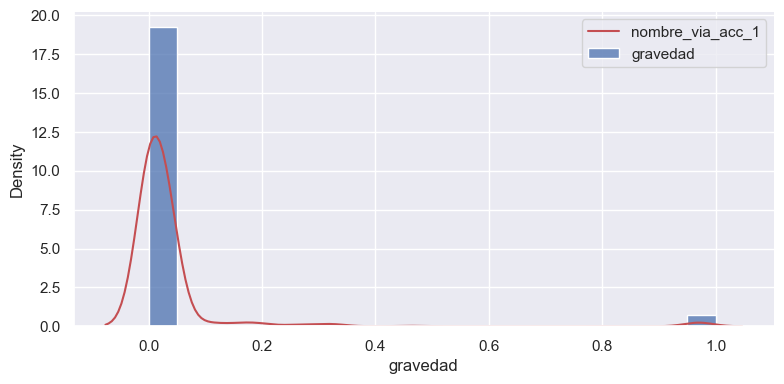

<Figure size 576x432 with 0 Axes>

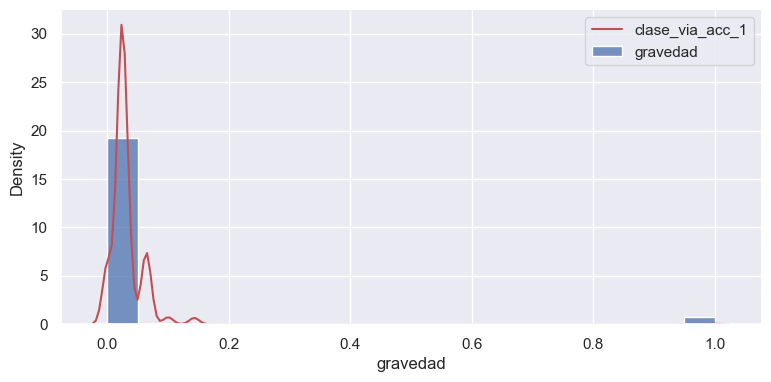

<Figure size 576x432 with 0 Axes>

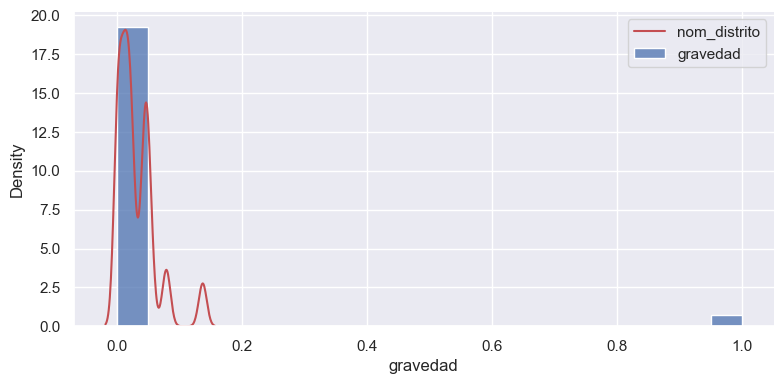

<Figure size 576x432 with 0 Axes>

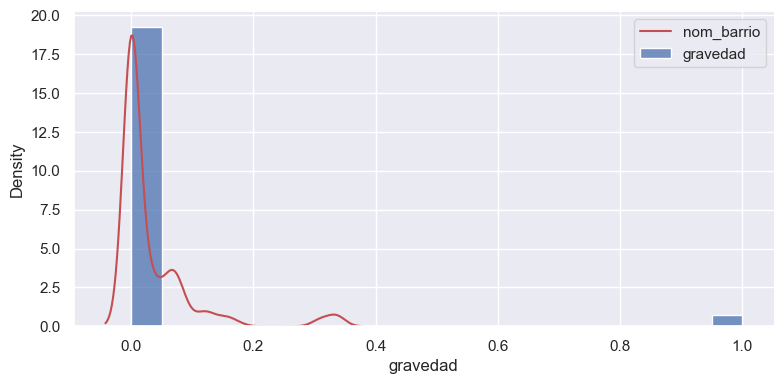

In [548]:
# OPCIÓN 1
# Tratamiento target encoding
columnas_target_encoding = ['nombre_via_acc_1','clase_via_acc_1','nom_distrito','nom_barrio']
m_target_encoding = [0.5, 0.0000000001, 3, 1]
for columna, m in zip(columnas_target_encoding, m_target_encoding):
    df_accidentes = aplica_target_encoding(columna,df=df_accidentes, m=m, grafico=True)

In [210]:
# OPCIÓN 2
# Tratamiento label encoding
#for col in columnas_target_encoding:
#    lb=LabelEncoder()
#    df_accidentes[col]=lb.fit_transform(df_accidentes[col])

In [549]:
# Tratamiento one-hot encoding
columnas_one_hot_encoding = ['tipo_accidente','estado_meteorologico','tipo_vehiculo','tipo_persona','sexo','positiva_alcohol', 'tipo_elem_pmed', 'tipo_ruta']
etiquetas_one_hot_encoding = ['tipo_accidente','estado_meteorologico','tipo_vehiculo','tipo_persona','sexo','positiva_alcohol', 'tipo_elem_pmed', 'tipo_ruta']
for columna in columnas_one_hot_encoding:
    print(f"La columna {columna} tiene {df_accidentes[columna].nunique()} valores distintos")

df_accidentes = pd.get_dummies(df_accidentes,prefix=etiquetas_one_hot_encoding, columns=columnas_one_hot_encoding, dtype=int)

La columna tipo_accidente tiene 12 valores distintos
La columna estado_meteorologico tiene 6 valores distintos
La columna tipo_vehiculo tiene 2 valores distintos
La columna tipo_persona tiene 3 valores distintos
La columna sexo tiene 3 valores distintos
La columna positiva_alcohol tiene 2 valores distintos
La columna tipo_elem_pmed tiene 2 valores distintos
La columna tipo_ruta tiene 6 valores distintos


In [550]:
# Tratamiento rango_edad

# Diccionario de valores a reemplazar
reemplazos = {'Más de 74 años': 'De 74 a 100 años', 'Menor de 5 años': 'De 3 a 5 años'}

# Reemplazar valores utilizando el método replace()
df_accidentes['rango_edad'] = df_accidentes['rango_edad'].replace(reemplazos)

# Función para extraer las edades de los rangos de edad y calcular la media
def calcular_media(rango_edad):
    if rango_edad == "Desconocido":
        return np.nan  # Devolver vacío para "Desconocido"
    
    numeros = re.findall(r'\d+', rango_edad)  # Encontrar todos los números en la cadena
    numeros = [int(numero) for numero in numeros]  # Convertir los números en enteros
    media = sum(numeros) / len(numeros)  # Calcular la media
    return media

# Crear nueva columna con edad_media
df_accidentes['media_edad'] = df_accidentes['rango_edad'].apply(calcular_media)

# Se reemplazan los rangos de edad "Desconocido" con 0
df_accidentes['media_edad'].fillna(0, inplace=True)

In [551]:
# Tratamiento dia_semana
df_accidentes['dia_semana']
dias_semana = {"Lunes": 1, "Martes": 2, "Miércoles": 3, "Jueves": 4, "Viernes": 5, "Sábado": 6, "Domingo": 7}

# Reemplazar valores utilizando el método replace()
df_accidentes['dia_semana'] = df_accidentes['dia_semana'].replace(dias_semana)

In [552]:
# Tratamiento momento_dia_acc

momentos_dia = ['Madrugada', 'Mañana', 'Tarde', 'Noche']

enc = OrdinalEncoder(categories=[momentos_dia])

df_accidentes['momento_dia_acc'] = enc.fit_transform(df_accidentes[['momento_dia_acc']])

df_accidentes['momento_dia_acc']

0       3.0
1       1.0
2       3.0
3       3.0
4       3.0
       ... 
3915    1.0
3916    1.0
3917    0.0
3918    1.0
3919    1.0
Name: momento_dia_acc, Length: 3920, dtype: float64

In [553]:
# Se eliminan las columnas 'num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc', 'geometry', 'rango_edad', 'numero_acc', 'cod_distrito', 'cod_barrio', 'cod_disbar', 'cod_lesividad', 'lesividad', 'fecha_hora_med', 'id_pmed_mas_cercano', 'error', 'periodo_integracion', 'cod_cent_pmed', 'nombre_pmed', 'utm_x_pmed', 'utm_y_pmed', 'COD_NDP', 'COD_VIA', 'mes_año', 'via_acc_1'

columnas_a_eliminar = ['num_expediente', 'fecha_acc', 'hora_acc', 'localizacion_acc', 'geometry', 'rango_edad', 'numero_acc', 'cod_distrito', 'cod_barrio', 'cod_disbar', 'cod_lesividad', 'fecha_hora_med', 'id_pmed_mas_cercano', 'error', 'periodo_integracion', 'cod_cent_pmed', 'nombre_pmed', 'utm_x_pmed', 'utm_y_pmed', 'COD_NDP', 'COD_VIA', 'mes_año', 'via_acc_1']
df_accidentes.drop(columns=columnas_a_eliminar, inplace=True)

In [554]:
df_accidentes.columns

Index(['clase_via_acc_1', 'nombre_via_acc_1', 'numero_via_acc_1',
       'nom_distrito', 'nom_barrio', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'lesividad', 'utm_x_acc', 'utm_y_acc',
       'positiva_droga', 'intensidad', 'ocupacion', 'carga', 'vmed', 'cruce',
       'gravedad', 'año', 'mes', 'dia_semana', 'dia_mes', 'hora_solo_acc',
       'momento_dia_acc', 'tipo_accidente_Alcance',
       'tipo_accidente_Atropello a animal',
       'tipo_accidente_Atropello a persona', 'tipo_accidente_Caída',
       'tipo_accidente_Choque contra obstáculo fijo',
       'tipo_accidente_Colisión frontal',
       'tipo_accidente_Colisión fronto-lateral',
       'tipo_accidente_Colisión lateral', 'tipo_accidente_Colisión múltiple',
       'tipo_accidente_Otro', 'tipo_accidente_Solo salida de la vía',
       'tipo_accidente_Vuelco',

In [555]:
# Se renombran las columnas
nombres_columnas = ['clase_via_acc', 'nombre_via_acc', 'numero_via_acc',
       'nom_distrito', 'nom_barrio', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_epac',
       'implicados_ligeros', 'lesividad', 'utm_x_acc', 'utm_y_acc',
       'prueba_droga_pos', 'intensidad_trafico', 'ocupacion_via', 'carga_via', 'vmed', 'cruce',
       'gravedad', 'año_acc', 'mes_acc', 'dia_semana_acc', 'dia_mes_acc', 'hora_acc',
       'momento_dia_acc', 'tipo_accidente_alcance',
       'atropello_a_animal',
       'atropello_a_persona', 'caida',
       'choque_contra_obstaculo_fijo',
       'colision_frontal',
       'colision_fronto-lateral',
       'colisión_lateral', 'colision_multiple',
       'tipo_accidente_otro', 'solo_salida_de_la_via',
       'vuelco', 'cielo_despejado',
       'granizando', 'lluvia_debil',
       'lluvia_intensa', 'cielo_nublado',
       'estado_meteo_desconocido', 'bicicleta',
       'bicicleta_EPAC',
       'es_conductor', 'es_pasajero',
       'es_peaton', 'sexo_desconocido', 'sexo_hombre', 'sexo_mujer', 
       'prueba_alcohol_neg', 'prueba_alcohol_pos',
       'pmed_M30', 'pmed_URB', 'anillo_verde_ciclista', 'giros_y_sentidos',
       'ruta_no_ciclista', 'via_exclusiva_bici',
       'via_preferente_bici', 'via_uso_compartido', 'media_edad']
df_accidentes.columns = nombres_columnas

In [556]:
len(df_accidentes.columns)

67

#### A.6.2. Correlación entre características

In [557]:
umbral = 0.6

dataf = df_accidentes._get_numeric_data().corr()[abs(df_accidentes._get_numeric_data().corr())>umbral]

data = [
    go.Heatmap(
        z= dataf.values,
        x= dataf.columns.values,
        y= dataf.columns.values,
        colorscale='sunset',
        reversescale = False,
        opacity = 1.0 )
]

layout = go.Layout(
    title='Pearson Correlation of features',
    xaxis = dict(ticks='', nticks=36),
    yaxis = dict(ticks='' ),
    width = 1200, height = 1000,
margin=dict(
    l=240,
),)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='labelled-heatmap')

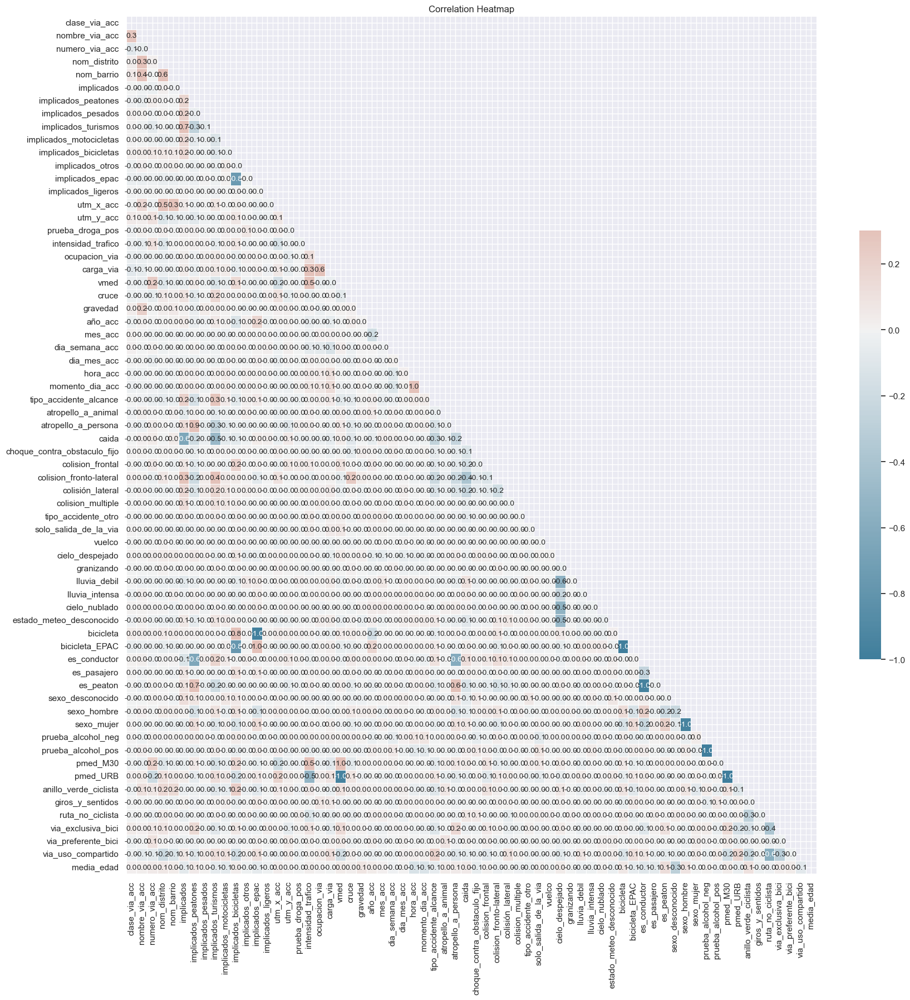

In [558]:
# Compute the correlation matrix
corr = df_accidentes._get_numeric_data().corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(20, 20))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot_kws={'size': 10}, fmt='.1f',
            square=False, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.title('Correlation Heatmap')
plt.show()

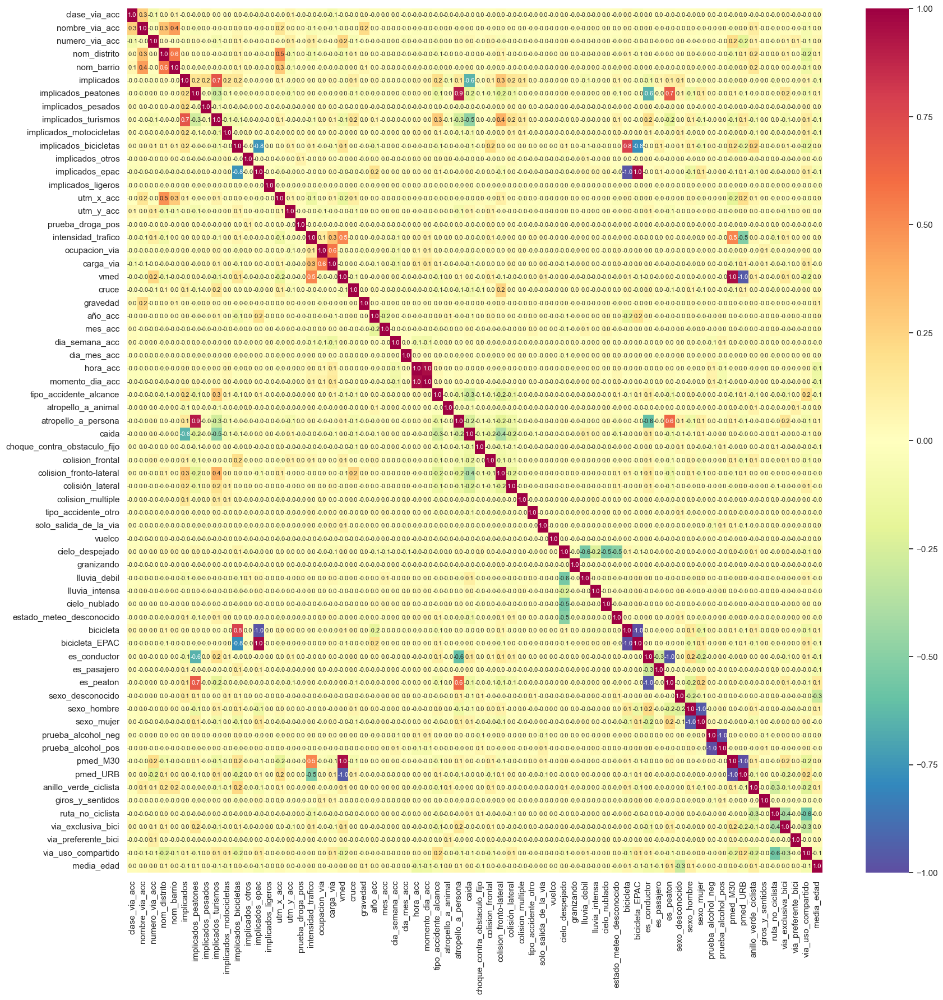

In [559]:
# El mapa de calor se puede utilizar para conocer el coeficiente de correlación entre las distintas variables
# con la target (gravedad). Aquí se puede corroborar que la mejor relación se encuentra entre gravedad y el campo nombre_via_acc 
corrmat = df_accidentes._get_numeric_data().corr(method='pearson')
plt.figure(figsize=(20,20))
hm = sns.heatmap(corrmat, 
                 cbar=True, 
                 annot=True, 
                 square=False, 
                 fmt='.1f', 
                 annot_kws={'size': 8}, 
                 yticklabels=df_accidentes._get_numeric_data().columns, 
                 xticklabels=df_accidentes._get_numeric_data().columns, 
                 cmap="Spectral_r")
plt.style.use('ggplot')

plt.show()

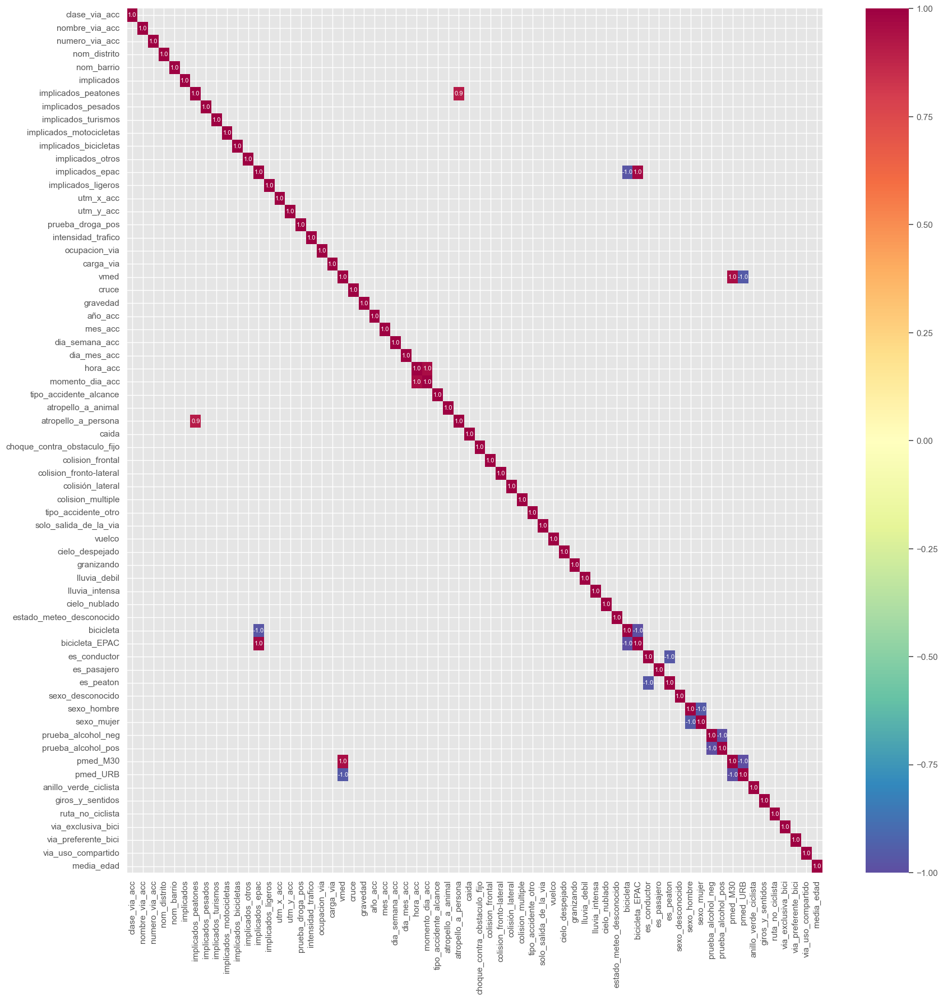

In [560]:
# Dado que hay tantas variables, se va a definir un umbral de correlación y se filtrará la matriz para ver solo las correlaciones por encima de dicho umbral
umbral = 0.8

corrmat_filtered  = corrmat[abs(corrmat) > umbral]

plt.figure(figsize=(20, 20))

# Crea un mapa de calor con las correlaciones filtradas
hm = sns.heatmap(corrmat_filtered, 
                 cbar=True, 
                 annot=True, 
                 square=False, 
                 fmt='.1f', 
                 annot_kws={'size': 8}, 
                 yticklabels=corrmat_filtered.columns, 
                 xticklabels=corrmat_filtered.columns, 
                 cmap="Spectral_r")
plt.style.use('ggplot')

plt.show()

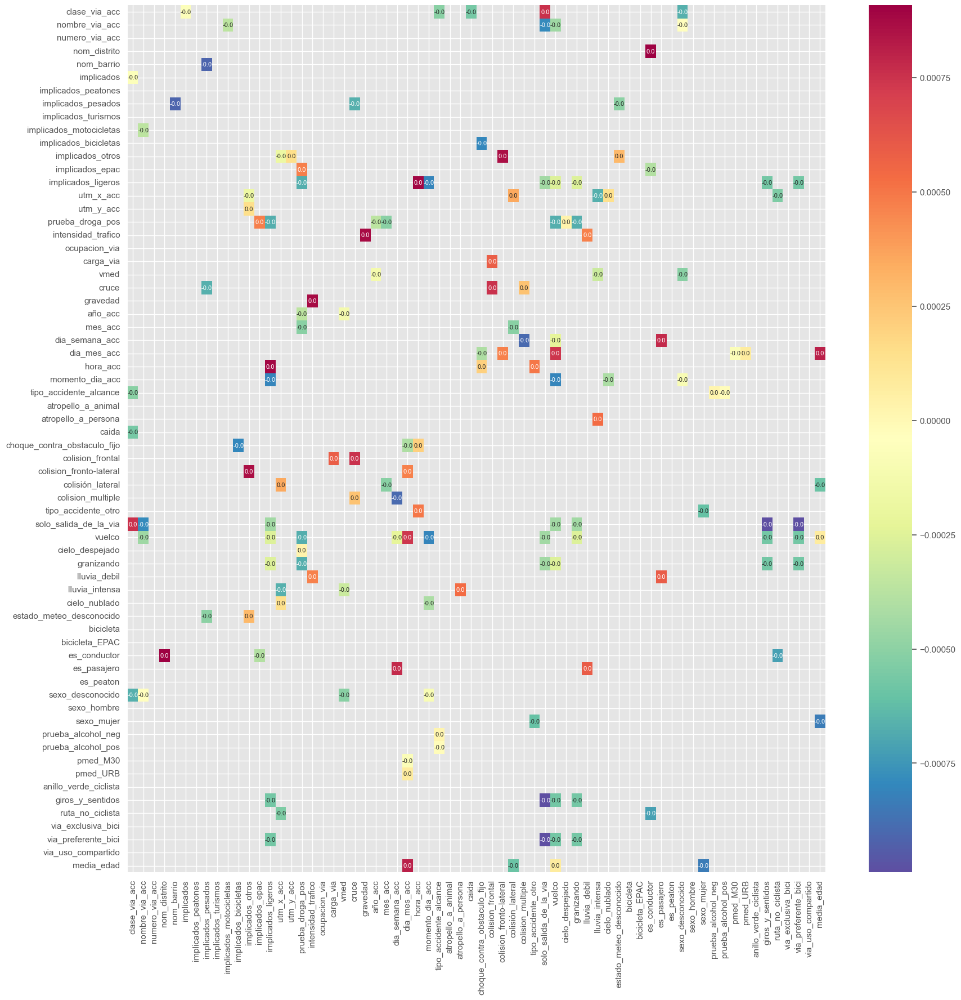

In [561]:
# Dado que hay tantas variables, se va a definir un umbral de correlación y se filtrará la matriz para ver solo las correlaciones por debajo de dicho umbral, buscando las que
# no tienen a penas relación con la target
umbral = 0.001

corrmat_filtered  = corrmat[abs(corrmat) < umbral]

plt.figure(figsize=(20, 20))

# Crea un mapa de calor con las correlaciones filtradas
hm = sns.heatmap(corrmat_filtered, 
                 cbar=True, 
                 annot=True, 
                 square=False, 
                 fmt='.1f', 
                 annot_kws={'size': 8}, 
                 yticklabels=corrmat_filtered.columns, 
                 xticklabels=corrmat_filtered.columns, 
                 cmap="Spectral_r")
plt.style.use('ggplot')

plt.show()

In [562]:
# Se definen las columnas a eliminar
#columnas_correlacionadas = ['atropello_a_persona','pmed_URB','pmed_M30','prueba_alcohol_neg','sexo_mujer', 'es_peaton','bicicleta','implicados_epac', 'momento_dia_acc'] # 
columnas_correlacionadas = ['atropello_a_persona','pmed_URB','prueba_alcohol_neg','sexo_mujer', 'es_peaton','bicicleta','implicados_epac'] # 'pmed_M30'

df_accidentes.drop(columns=columnas_correlacionadas, inplace=True)

In [563]:
len(df_accidentes.columns)

60

In [564]:
df_accidentes.columns

Index(['clase_via_acc', 'nombre_via_acc', 'numero_via_acc', 'nom_distrito',
       'nom_barrio', 'implicados', 'implicados_peatones', 'implicados_pesados',
       'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_ligeros',
       'lesividad', 'utm_x_acc', 'utm_y_acc', 'prueba_droga_pos',
       'intensidad_trafico', 'ocupacion_via', 'carga_via', 'vmed', 'cruce',
       'gravedad', 'año_acc', 'mes_acc', 'dia_semana_acc', 'dia_mes_acc',
       'hora_acc', 'momento_dia_acc', 'tipo_accidente_alcance',
       'atropello_a_animal', 'caida', 'choque_contra_obstaculo_fijo',
       'colision_frontal', 'colision_fronto-lateral', 'colisión_lateral',
       'colision_multiple', 'tipo_accidente_otro', 'solo_salida_de_la_via',
       'vuelco', 'cielo_despejado', 'granizando', 'lluvia_debil',
       'lluvia_intensa', 'cielo_nublado', 'estado_meteo_desconocido',
       'bicicleta_EPAC', 'es_conductor', 'es_pasajero', 'sexo_desconocido',
 

In [565]:
# Si se ha elegido la OPCIÓN 1
# Se guarda el dataframe resultante tras EDA y feature engineering, con target encoding
df_accidentes.to_csv('./Datasets/accidentes_limpio_v3.csv', sep=';', encoding='latin-1', index=False)

In [513]:
# Si se ha elegido la OPCIÓN 2
# Se guarda el dataframe resultante tras EDA y feature engineering. con label encoding
df_accidentes.to_csv('./Datasets/accidentes_limpio_v2_le.csv', sep=';', encoding='latin-1', index=False)

Se pasa de 68 a 58 características

In [286]:
df_accidentes.columns.sort_values()

Index(['anillo_verde_ciclista', 'atropello_a_animal', 'año_acc',
       'bicicleta_EPAC', 'caida', 'carga_via', 'choque_contra_obstaculo_fijo',
       'cielo_despejado', 'cielo_nublado', 'clase_via_acc', 'colision_frontal',
       'colision_fronto-lateral', 'colision_multiple', 'colisión_lateral',
       'cruce', 'dia_mes_acc', 'dia_semana_acc', 'es_conductor', 'es_pasajero',
       'estado_meteo_desconocido', 'giros_y_sentidos', 'granizando',
       'gravedad', 'hora_acc', 'implicados', 'implicados_bicicletas',
       'implicados_ligeros', 'implicados_motocicletas', 'implicados_otros',
       'implicados_peatones', 'implicados_pesados', 'implicados_turismos',
       'lesividad', 'lluvia_debil', 'lluvia_intensa', 'media_edad', 'mes_acc',
       'nom_barrio', 'nom_distrito', 'nombre_via_acc', 'numero_via_acc',
       'ocupacion_via', 'prueba_alcohol_pos', 'prueba_droga_pos',
       'ruta_no_ciclista', 'sexo_desconocido', 'sexo_hombre',
       'solo_salida_de_la_via', 'tipo_accidente_alc

### A.7. Clustering

La primera celda es para cargar los accidentes, por si no se han cargado antes

In [ ]:
# Cargamos los accidentes
df_accidentes = pd.read_csv('./Datasets/accidentes_limpio_v3.csv', delimiter=';', encoding='latin-1')

In [275]:
# Se divide entre variables y target
target = df_accidentes[["gravedad","lesividad"]]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

In [276]:
# Así quedaría el nuevo dataset de variables sin la target
variables.head()

,clase_via_acc,nombre_via_acc,numero_via_acc,nom_distrito,nom_barrio,implicados,implicados_peatones,implicados_pesados,implicados_turismos,implicados_motocicletas,...,sexo_desconocido,sexo_hombre,prueba_alcohol_pos,anillo_verde_ciclista,giros_y_sentidos,ruta_no_ciclista,via_exclusiva_bici,via_preferente_bici,via_uso_compartido,media_edad
0,0.063953,0.943021,32,0.080276,0.290194,3,0.0,0.0,0.0,2.0,...,0,1,0,0,0,0,0,0,1,72.0
1,0.023256,0.000154,2,0.080276,0.290194,2,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,1,0,0,47.0
2,0.023256,0.000100,37,0.080276,0.290194,1,0.0,0.0,0.0,0.0,...,0,1,0,0,0,1,0,0,0,27.0
3,0.023256,0.031359,23,0.080276,0.290194,2,1.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,0,32.0
4,0.023256,0.031359,23,0.080276,0.290194,2,1.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,0,32.0


In [277]:
variables.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3920 entries, 0 to 3919
Data columns (total 55 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   clase_via_acc                 3920 non-null   float64
 1   nombre_via_acc                3920 non-null   float64
 2   numero_via_acc                3920 non-null   int64  
 3   nom_distrito                  3920 non-null   float64
 4   nom_barrio                    3920 non-null   float64
 5   implicados                    3920 non-null   int64  
 6   implicados_peatones           3920 non-null   float64
 7   implicados_pesados            3920 non-null   float64
 8   implicados_turismos           3920 non-null   float64
 9   implicados_motocicletas       3920 non-null   float64
 10  implicados_bicicletas         3920 non-null   float64
 11  implicados_otros              3920 non-null   float64
 12  implicados_ligeros            3920 non-null   float64
 13  utm

In [278]:
variables.nunique()

clase_via_acc                     13
nombre_via_acc                    24
numero_via_acc                   311
nom_distrito                      21
nom_barrio                        39
implicados                         8
implicados_peatones                3
implicados_pesados                 5
implicados_turismos                6
implicados_motocicletas            4
implicados_bicicletas              5
implicados_otros                   2
implicados_ligeros                 2
utm_x_acc                       3479
utm_y_acc                       3490
prueba_droga_pos                   2
ocupacion_via                     80
carga_via                         91
vmed                              66
cruce                              2
año_acc                            5
mes_acc                           12
dia_semana_acc                     7
dia_mes_acc                       31
hora_acc                          24
tipo_accidente_alcance             2
atropello_a_animal                 2
c

In [279]:
print(f'Hay {variables.shape[0]} filas y {variables.shape[1]} columnas en el dataset.')

Hay 3920 filas y 55 columnas en el dataset.


In [280]:
## Comprobamos el tamaño del dataset, las filas, columnas, duplicados y valores faltantes 
print(f'\033[94mNúmero de registros (filas) en el dataset: {variables.shape[0]}')
print(f'\033[94mNúmero de features (columnas) en el dataset: {variables.shape[1]}')
print(f'\033[94mNúmero de registros duplicados en el dataset: {variables.duplicated().sum()}')
print(f'\033[94mNúmero de valores faltantes en el dataset: {sum(variables.isna().sum())}')

Número de registros (filas) en el dataset: 3920
Número de features (columnas) en el dataset: 55
Número de registros duplicados en el dataset: 18
Número de valores faltantes en el dataset: 0


In [281]:
variables.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
clase_via_acc,3920.0,3.146036e-02,0.038755,5.807201e-14,2.325581e-02,2.325581e-02,3.361345e-02,1.000000e+00
nombre_via_acc,3920.0,3.418627e-02,0.121239,1.001881e-04,1.544773e-04,6.817149e-04,3.135889e-02,9.430211e-01
numero_via_acc,3920.0,2.997298e+02,2193.823935,1.000000e+00,6.000000e+00,2.400000e+01,6.700000e+01,5.700000e+04
nom_distrito,3920.0,3.165436e-02,0.030425,1.363430e-03,1.163911e-02,2.249493e-02,4.652360e-02,1.376777e-01
nom_barrio,3920.0,3.320372e-02,0.064813,5.501559e-04,7.648509e-04,1.254355e-03,4.911233e-02,3.359466e-01
implicados,3920.0,1.837755e+00,0.697170,1.000000e+00,1.000000e+00,2.000000e+00,2.000000e+00,9.000000e+00
implicados_peatones,3920.0,1.377551e-01,0.357764,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00
implicados_pesados,3920.0,2.653061e-02,0.222056,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,8.000000e+00
implicados_turismos,3920.0,5.357143e-01,0.686508,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,5.000000e+00
implicados_motocicletas,3920.0,4.617347e-02,0.235117,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00


In [282]:
variables.skew()

clase_via_acc                   16.325146
nombre_via_acc                   6.397042
numero_via_acc                  14.177198
nom_distrito                     1.739908
nom_barrio                       3.010377
implicados                       1.398237
implicados_peatones              2.399847
implicados_pesados              16.753895
implicados_turismos              1.495209
implicados_motocicletas          6.022437
implicados_bicicletas            0.352386
implicados_otros                12.406620
implicados_ligeros              62.609903
utm_x_acc                        0.511030
utm_y_acc                        0.516133
prueba_droga_pos                23.609921
ocupacion_via                    3.333103
carga_via                        0.860547
vmed                             3.369637
cruce                            0.260441
año_acc                          0.158292
mes_acc                          0.019703
dia_semana_acc                  -0.017882
dia_mes_acc                      0

#### A.7.2. Preprocesamiento

In [522]:
scaler = MinMaxScaler()
variables_scaled = scaler.fit_transform(variables)
variables_scaled = pd.DataFrame(variables_scaled)
variables_scaled.columns = list(variables.columns)

In [523]:
# Veamos cómo queda el dataset normalizado
variables_scaled.head()

,clase_via_acc,nombre_via_acc,numero_via_acc,nom_distrito,nom_barrio,implicados,implicados_peatones,implicados_pesados,implicados_turismos,implicados_motocicletas,...,prueba_alcohol_pos,pmed_C30,pmed_URB,anillo_verde_ciclista,giros_y_sentidos,otra_ruta,via_exclusiva_bici,via_preferente_bici,via_uso_compartido,media_edad
0,0.055556,0.410912,0.000544,0.4,0.169231,0.250,0.0,0.0,0.0,0.5,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.827586
1,0.166667,0.075874,0.000018,0.4,0.169231,0.125,0.0,0.0,0.2,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.540230
2,0.166667,0.189258,0.000632,0.4,0.169231,0.000,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.310345
3,0.166667,0.776641,0.000386,0.4,0.169231,0.125,0.5,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.367816
4,0.166667,0.776641,0.000386,0.4,0.169231,0.125,0.5,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.367816


In [524]:
# Aplicamos PCA para reducir la dimensionalidad
pca = PCA(random_state=42)  # Empezamos con todos los componentes
variables_pca = pca.fit_transform(variables_scaled)

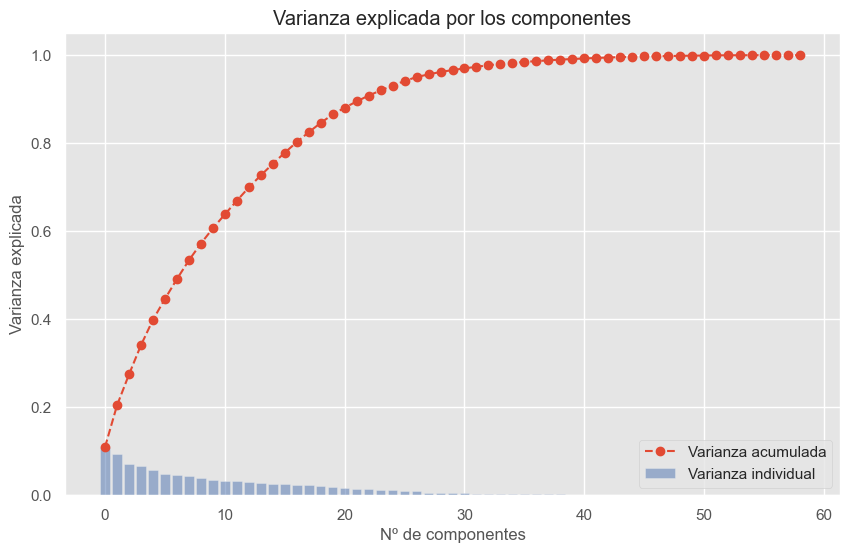

In [525]:
# Vamos a obtener el número óptimo de componentes
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
plt.figure(figsize=(10,6))

plt.bar(range(len(explained_variance_ratio)), explained_variance_ratio, alpha=0.5, align='center', label='Varianza individual', color='b')
plt.plot(range(len(explained_variance_ratio)), cumulative_variance_ratio, marker='o', linestyle= "--", label='Varianza acumulada')
plt.title('Varianza explicada por los componentes')
plt.xlabel('Nº de componentes')
plt.ylabel('Varianza explicada')
plt.legend(loc='lower right')
plt.show()

In [526]:
# Por lo general, se suele elegir el número de componentes que supera el 80-90% de la varianza explicada acumulada
# En este caso, elegiremos un 90%
n_components_optimal = np.argmax(cumulative_variance_ratio >= 0.90) + 1 

# De esta forma, nos quedamos con 10 componentes
print(f"El número óptimo de componentes es {n_components_optimal}")

El número óptimo de componentes es 23


In [527]:
# Aplicamos PCA con el número óptimo de componentes
pca_optimal = PCA(n_components=n_components_optimal)
variables_pca = pca_optimal.fit_transform(variables_scaled)

#### A.7.3. K-Means

In [528]:
## Aplcamos el método del codo para determinar el número de clusters
SEED=15
wcss = []

for cluster in range(1,11):
    kmeans = KMeans(n_clusters = cluster, init = 'k-means++', random_state = SEED)
    kmeans.fit(variables_pca)
    wcss.append(kmeans.inertia_)

wcss

c:\Users\alke-\anaconda3\envs\dl\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\alke-\anaconda3\envs\dl\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\alke-\anaconda3\envs\dl\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\alke-\anaconda3\envs\dl\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\alke-\anaconda3\envs\dl\lib\site-packages\sklearn\cluster\_kmeans.py:14

[12285.00371098892,
 10935.408723217408,
 9988.846401326671,
 9491.324579579898,
 9055.53519477946,
 8693.313203487209,
 8414.087646330554,
 8231.61912096522,
 8012.900085998372,
 7758.438627539935]

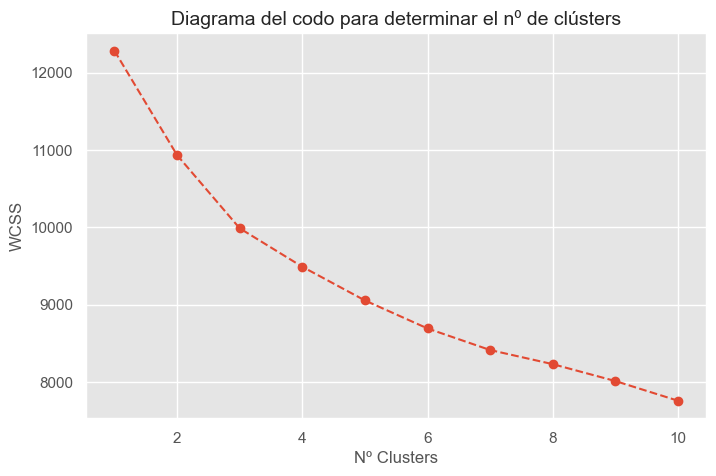

In [529]:
## Representamos el diagrama del codo para determinar el número ideal de clústers
plt.figure(figsize=(8,5))

plt.plot(range(1,11), wcss, 'o--')
plt.title('Diagrama del codo para determinar el nº de clústers', fontsize=14)
plt.xlabel('Nº Clusters')
plt.ylabel('WCSS')

plt.show()

In [530]:
# Aplicamos el método Silhouette para determinar el número de clusters
silhouette_coef = []

for cluster in range(2,11):
    kmeans = KMeans(n_clusters = cluster, init = 'k-means++', random_state = SEED)
    kmeans.fit(variables_pca)
    score = silhouette_score(variables_pca, kmeans.labels_)
    silhouette_coef.append(score)

silhouette_coef

c:\Users\alke-\anaconda3\envs\dl\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\alke-\anaconda3\envs\dl\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\alke-\anaconda3\envs\dl\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\alke-\anaconda3\envs\dl\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\alke-\anaconda3\envs\dl\lib\site-packages\sklearn\cluster\_kmeans.py:14

[0.10832920585810091,
 0.143745272807459,
 0.15600422598860117,
 0.12349302578961542,
 0.117580290211605,
 0.11524942400643222,
 0.1115551878377827,
 0.12139753481383204,
 0.13544137175778498]

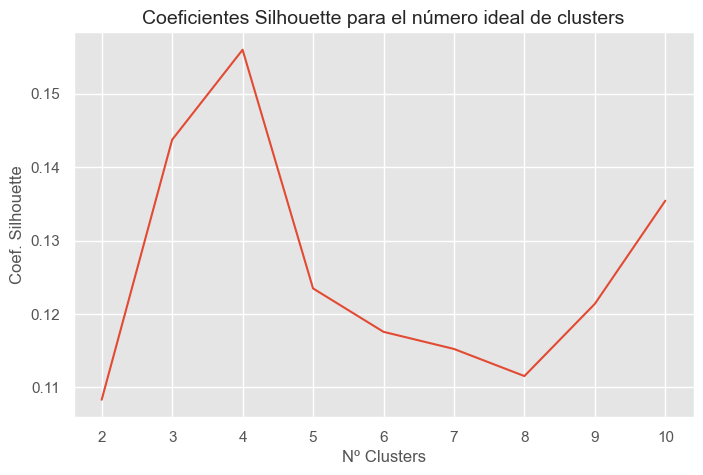

In [531]:
## Representamos los coeficientes Silhouette
plt.figure(figsize=(8,5))
plt.plot(range(2,11), silhouette_coef)
plt.xticks(range(2,11))
plt.title('Coeficientes Silhouette para el número ideal de clusters', fontsize=14)
plt.xlabel('Nº Clusters')
plt.ylabel('Coef. Silhouette')
plt.show()

Siguiendo el método del codo, el número de clústers sería 3 o 4, mientras que según el método Silhouette el número óptimo de clústers es 3. De esta forma, se concluye que el número óptimo de clústers es 3

In [283]:
## Entrenamos el modelo KMeans con 3 clústers 
clusters = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
y_kmeans = clusters.fit_predict(variables_pca)
y_kmeans

c:\Users\alke-\anaconda3\envs\dl\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



array([0, 1, 2, ..., 0, 1, 1])

In [284]:
# Añadimos al dataset original los componentes calculados por PCA y el segmento obtenido por KMeans
df_segm_pca_kmeans = pd.concat([variables.reset_index(drop=True), pd.DataFrame(variables_pca)], axis=1)
df_segm_pca_kmeans.columns.values[-21:] = ["Component " + str(i) for i in range (1,22)]
df_segm_pca_kmeans['Segment K-means PCA'] = clusters.labels_

In [285]:
# Mostramos las primeras filas
df_segm_pca_kmeans.head()

,clase_via_acc,nombre_via_acc,numero_via_acc,nom_distrito,nom_barrio,implicados,implicados_peatones,implicados_pesados,implicados_turismos,implicados_motocicletas,...,Component 13,Component 14,Component 15,Component 16,Component 17,Component 18,Component 19,Component 20,Component 21,Segment K-means PCA
0,0.063953,0.943021,32,0.080276,0.310105,3,0.0,0.0,0.0,2.0,...,-0.295910,-0.146928,0.433080,-0.159299,0.719981,0.777467,0.177502,-0.003143,-0.042063,0
1,0.023256,0.000154,2,0.080276,0.310105,2,0.0,0.0,1.0,0.0,...,0.009591,0.244902,0.088957,-0.431927,0.029552,0.511931,0.073247,0.022257,-0.023622,1
2,0.023256,0.000100,37,0.080276,0.310105,1,0.0,0.0,0.0,0.0,...,-0.422906,-0.004609,-0.174606,0.062840,0.253895,0.558180,0.172125,0.002323,0.082225,2
3,0.023256,0.031359,23,0.080276,0.310105,2,1.0,0.0,0.0,0.0,...,-0.388944,0.291685,0.168482,0.142981,0.230464,0.279674,-0.043359,-0.005454,0.078376,1
4,0.023256,0.031359,23,0.080276,0.310105,2,1.0,0.0,0.0,0.0,...,-0.433421,0.209186,0.514815,0.717614,0.262974,0.350260,-0.294316,0.040319,0.119870,1


In [286]:
# Creamos el campo Cluster a partir de los segmentos
df_segm_pca_kmeans['Cluster'] = df_segm_pca_kmeans['Segment K-means PCA'].map({0:'Grupo 1', 1:'Grupo 2', 2:'Grupo 3', 3:'Grupo 4', 4:'Grupo 5'})

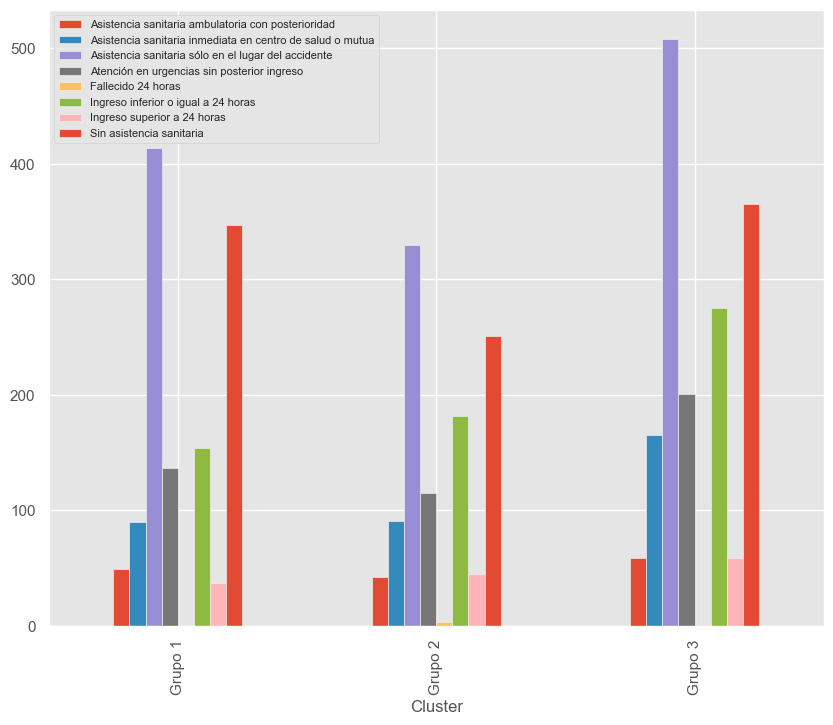

In [287]:
# Analizamos cómo se relacionan los 5 clusters con la lesividad
pd.DataFrame(df_segm_pca_kmeans).join(target).groupby(['Cluster','lesividad'])['clase_via_acc'].count().unstack(level=1).plot(kind='bar', figsize=(10,8))
plt.legend(loc='best', fontsize=8)
plt.show()

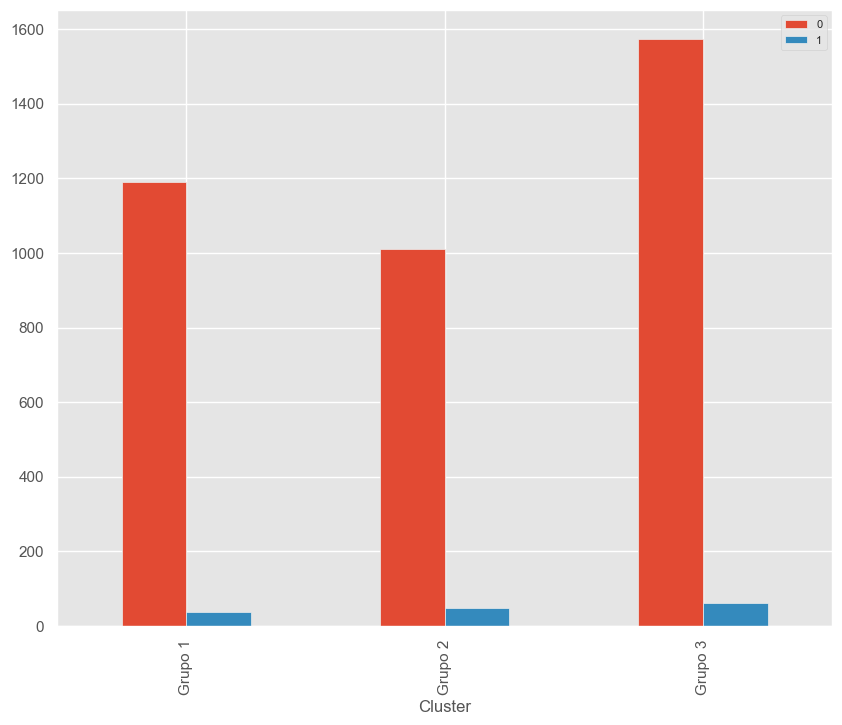

In [290]:
# Analizamos cómo se relacionan los 5 clusters con la gravedad
pd.DataFrame(df_segm_pca_kmeans).join(target).groupby(['Cluster','gravedad'])['clase_via_acc'].count().unstack(level=1).plot(kind='bar', figsize=(10,8))
plt.legend(loc='best', fontsize=8)
plt.show()

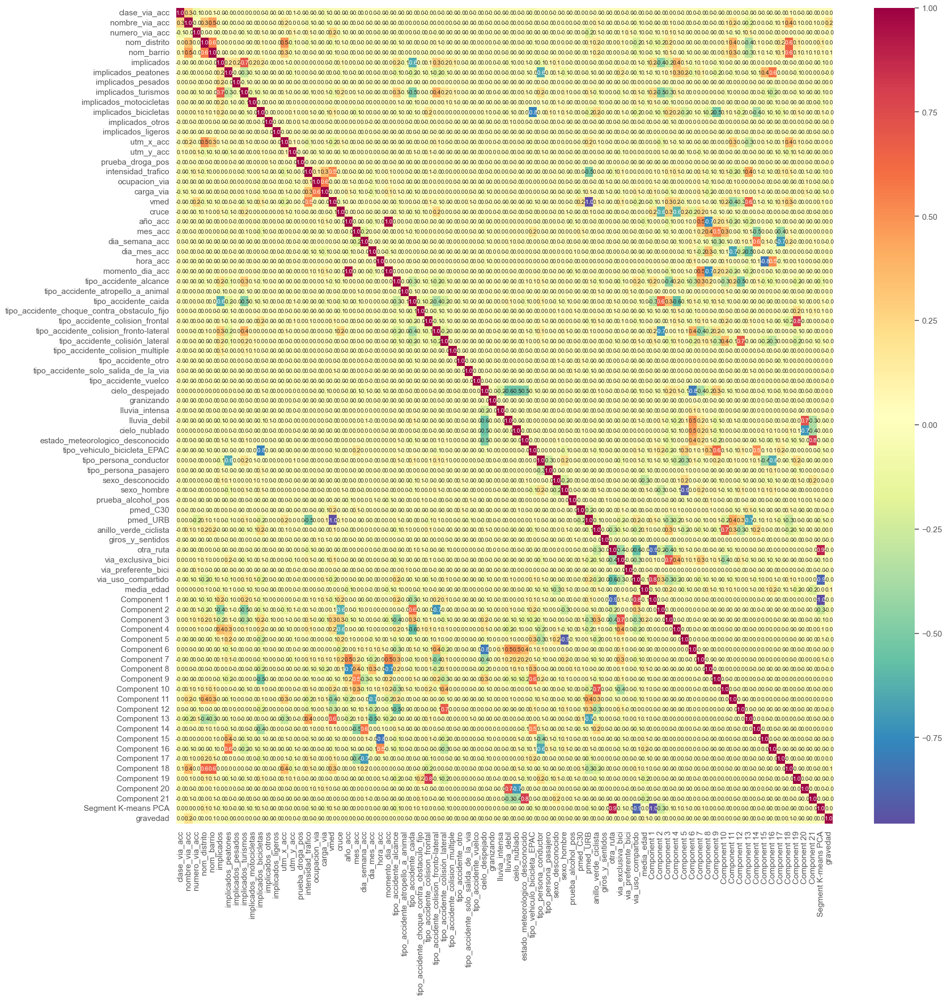

In [297]:
# Dado que hay tantas variables, se va a definir un umbral de correlación y se filtrará la matriz para ver solo las correlaciones por encima de dicho umbral
umbral = 0.6
a = pd.DataFrame(df_segm_pca_kmeans).join(target)._get_numeric_data().corr()
a_filtered  = a[abs(a) > umbral]

plt.figure(figsize=(20, 20))

# Crea un mapa de calor con las correlaciones filtradas
hm = sns.heatmap(a, 
                 cbar=True, 
                 annot=True, 
                 square=False, 
                 fmt='.1f', 
                 annot_kws={'size': 8}, 
                 yticklabels=a.columns, 
                 xticklabels=a.columns, 
                 cmap="Spectral_r")
plt.style.use('ggplot')

plt.show()

In [298]:
# Mostramos las primeras filas
df_segm_pca_kmeans.head()

,clase_via_acc,nombre_via_acc,numero_via_acc,nom_distrito,nom_barrio,implicados,implicados_peatones,implicados_pesados,implicados_turismos,implicados_motocicletas,...,Component 14,Component 15,Component 16,Component 17,Component 18,Component 19,Component 20,Component 21,Segment K-means PCA,Cluster
0,0.063953,0.943021,32,0.080276,0.310105,3,0.0,0.0,0.0,2.0,...,-0.146928,0.433080,-0.159299,0.719981,0.777467,0.177502,-0.003143,-0.042063,0,Grupo 1
1,0.023256,0.000154,2,0.080276,0.310105,2,0.0,0.0,1.0,0.0,...,0.244902,0.088957,-0.431927,0.029552,0.511931,0.073247,0.022257,-0.023622,1,Grupo 2
2,0.023256,0.000100,37,0.080276,0.310105,1,0.0,0.0,0.0,0.0,...,-0.004609,-0.174606,0.062840,0.253895,0.558180,0.172125,0.002323,0.082225,2,Grupo 3
3,0.023256,0.031359,23,0.080276,0.310105,2,1.0,0.0,0.0,0.0,...,0.291685,0.168482,0.142981,0.230464,0.279674,-0.043359,-0.005454,0.078376,1,Grupo 2
4,0.023256,0.031359,23,0.080276,0.310105,2,1.0,0.0,0.0,0.0,...,0.209186,0.514815,0.717614,0.262974,0.350260,-0.294316,0.040319,0.119870,1,Grupo 2


C:\Users\alke-\AppData\Local\Temp\ipykernel_31812\353199992.py:5: UserWarning:

The palette list has more values (5) than needed (3), which may not be intended.



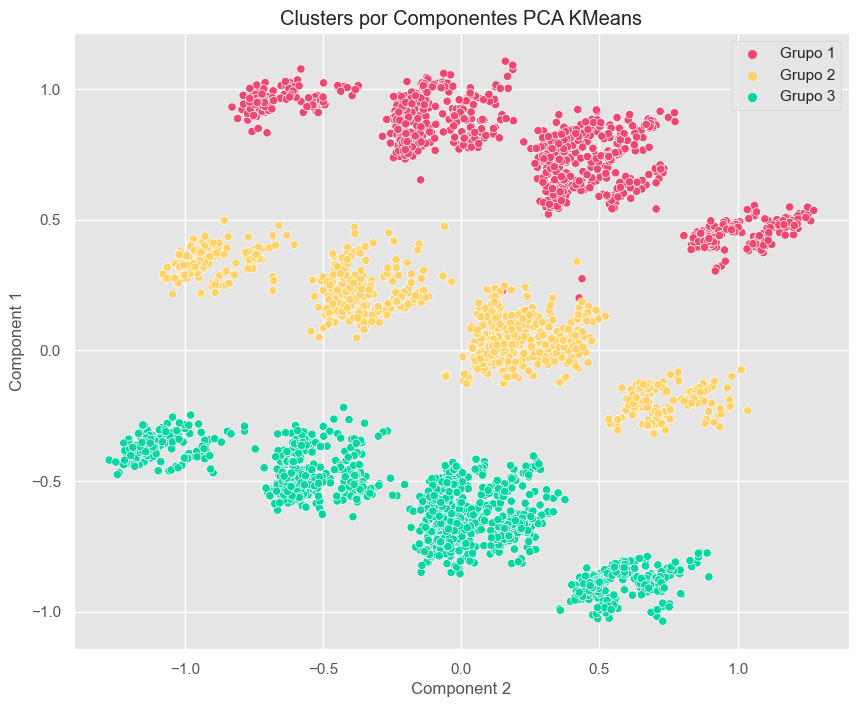

In [299]:
# Representamos los clústers a partir de los dos primeros componentes calculados por PCA
x_axis = df_segm_pca_kmeans['Component 2']
y_axis = df_segm_pca_kmeans['Component 1']
plt.figure(figsize=(10,8))
sns.scatterplot(x=x_axis, y=y_axis, hue=df_segm_pca_kmeans['Cluster'], palette=['#ef476f','#ffd166','#06d6a0','#118ab2','#073b4c'])
plt.title('Clusters por Componentes PCA KMeans')
plt.legend(loc='upper right')
plt.show()

In [639]:
# BORRAR
# Calcula la proporción de accidentes graves por categoría
gravedad_por_categoria = df_accidentes.groupby('clase_via_acc_1')['gravedad'].mean()

# Define el valor de suavizado (alpha)
alpha = 2.0

# Calcula el suavizado de Laplace para cada categoría
n_categorias = len(df_accidentes['clase_via_acc_1'].unique())
n_total = len(df_accidentes)
smoothed_ratios = (gravedad_por_categoria * n_total + alpha) / (n_categorias + alpha)

# Crea un diccionario de mapeo para reemplazar los valores originales por los suavizados
mapping = smoothed_ratios.to_dict()

# Aplica el reemplazo de valores en la columna 'tipo_via'
df_accidentes['tipo_via_encoded'] = df_accidentes['clase_via_acc_1'].map(mapping)
df_accidentes[['clase_via_acc_1', 'tipo_via_encoded']]



KeyError: 'clase_via_acc_1'

### A.8 Selección de variables

In [300]:
# Se divide entre variables y target
target = df_accidentes["gravedad"]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

In [301]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

k = 19
columnas_kbest = []

chi2 = SelectKBest(chi2, k=k).fit(variables._get_numeric_data(), target)
for (col, sel) in zip(variables._get_numeric_data().columns.values, chi2.get_support()):
    if sel:
        print(col)
        columnas_kbest.append(col)
seleccion = chi2.transform(variables._get_numeric_data())

nombre_via_acc
numero_via_acc
nom_barrio
implicados_peatones
implicados_pesados
implicados_turismos
utm_x_acc
utm_y_acc
intensidad_trafico
ocupacion_via
carga_via
vmed
tipo_accidente_choque_contra_obstaculo_fijo
tipo_accidente_colision_fronto-lateral
estado_meteorologico_desconocido
sexo_desconocido
anillo_verde_ciclista
via_uso_compartido
media_edad


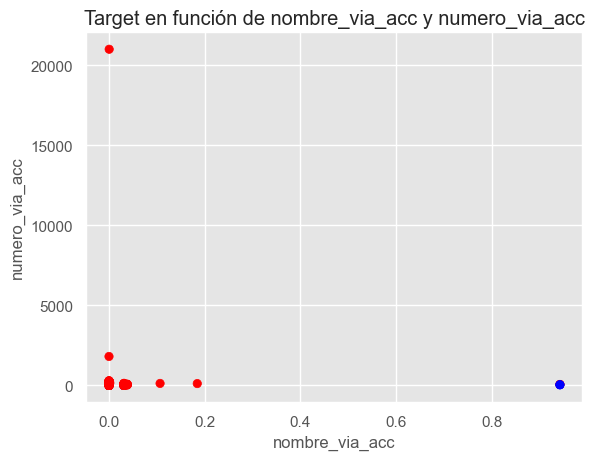

In [302]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

variables_a_representar = (0,1)

cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])
plt.scatter(seleccion[1:200, variables_a_representar[0]], seleccion[1:200, variables_a_representar[1]], c=target[1:200], cmap=cm_bright)
plt.xlabel(columnas_kbest[variables_a_representar[0]])
plt.ylabel(columnas_kbest[variables_a_representar[1]])
plt.title('Target en función de ' + columnas_kbest[variables_a_representar[0]] + ' y ' + columnas_kbest[variables_a_representar[1]])
plt.show()

Transformación de variables

In [304]:
from sklearn.decomposition import PCA

pca = PCA(n_components=21)
pca.fit(variables._get_numeric_data())
print(pca.components_)
print(pca.explained_variance_ratio_)
transformacion = pca.transform(variables._get_numeric_data())

[[ 4.32335275e-07  2.11687806e-06  8.32748784e-02 ...  3.73642218e-07
   3.15097022e-06  6.34870301e-05]
 [-1.89871262e-07  5.42769968e-06 -6.33304259e-02 ... -2.15311998e-07
  -6.30432991e-06  1.39008645e-04]
 [-1.82533263e-06 -1.60950934e-06  9.93827698e-01 ...  1.50658211e-06
  -1.79599612e-05  3.77780331e-04]
 ...
 [ 4.14989175e-03  1.64401793e-02 -8.18750375e-06 ...  3.25581413e-04
  -3.90701105e-01 -9.65852802e-04]
 [ 2.15787550e-03  6.41993673e-03 -1.68819679e-06 ...  2.84739710e-03
  -3.12192916e-02  2.05519631e-03]
 [-5.68460059e-04 -4.76885115e-03  3.08159947e-06 ...  3.07594351e-04
   1.68618133e-01  4.62274170e-04]]
[4.68990814e-01 3.61010281e-01 1.54633173e-01 1.53314053e-02
 1.20112691e-05 9.22728376e-06 6.73614010e-06 2.58367918e-06
 2.19238886e-06 9.51031125e-07 3.23351323e-07 1.27930361e-07
 5.29258240e-08 3.06297724e-08 1.19738736e-08 1.05646002e-08
 9.53564198e-09 7.89780977e-09 6.07937443e-09 5.49950519e-09
 5.17317638e-09]


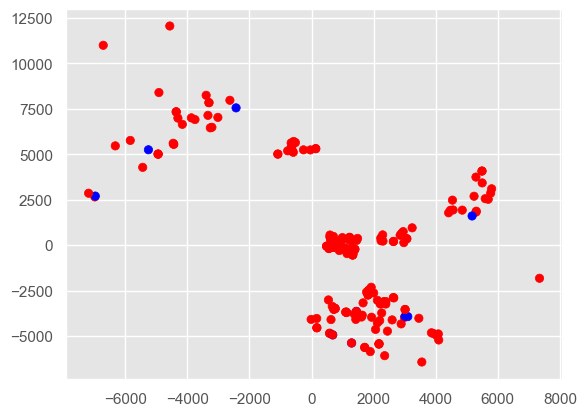

In [305]:
cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])
plt.scatter(transformacion[1:200, 0], transformacion[1:200, 1], c=target[1:200], cmap=cm_bright)
plt.show()

In [307]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(solver="lbfgs", max_iter=1000, class_weight='balanced')
rfe = RFE(lr, n_features_to_select=19).fit(variables._get_numeric_data(), target)
for (col, sel) in zip(variables._get_numeric_data().columns.values, rfe.get_support()):
    if sel:
        print(col)
seleccion_rfe = rfe.transform(variables._get_numeric_data())

nombre_via_acc
numero_via_acc
implicados_peatones
implicados_turismos
utm_x_acc
utm_y_acc
intensidad_trafico
ocupacion_via
carga_via
vmed
año_acc
mes_acc
dia_semana_acc
dia_mes_acc
hora_acc
tipo_accidente_colision_fronto-lateral
sexo_hombre
via_uso_compartido
media_edad


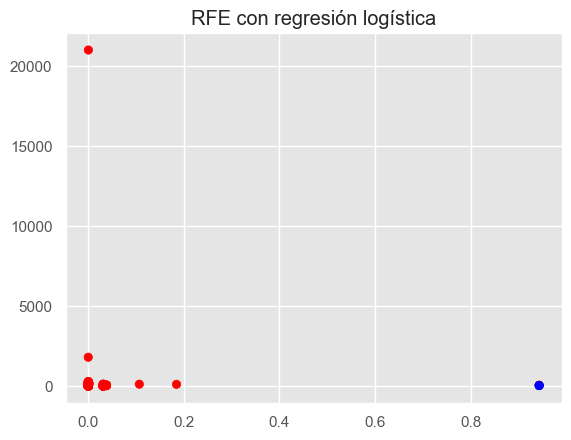

Como se observa, la separación del target en base a este método no es buena, por lo que se va a seguir probando.


In [310]:
# Siguiendo los ejemplos anteriores, se va a representar en un mismo gráfico las dos mejores variables, en función de la target (color)
cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])
plt.title("RFE con regresión logística")
plt.scatter(seleccion_rfe[1:200, 0], seleccion_rfe[1:200, 1], c=target[1:200], cmap=cm_bright)
plt.show()
print("Como se observa, la separación del target en base a este método no es buena, por lo que se va a seguir probando.")

In [311]:
# Antes de abandonar el RFE, se va a probar con un modelo de árbol de decisión como estimador
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()
rfe_dtc = RFE(dtc, n_features_to_select=10).fit(variables._get_numeric_data(), target)
for (col, sel) in zip(variables._get_numeric_data().columns.values, rfe_dtc.get_support()):
    if sel:
        print(col)
seleccion_rfe_dtc = rfe_dtc.transform(variables._get_numeric_data())

nombre_via_acc
numero_via_acc
utm_x_acc
utm_y_acc
intensidad_trafico
carga_via
año_acc
mes_acc
dia_semana_acc
hora_acc


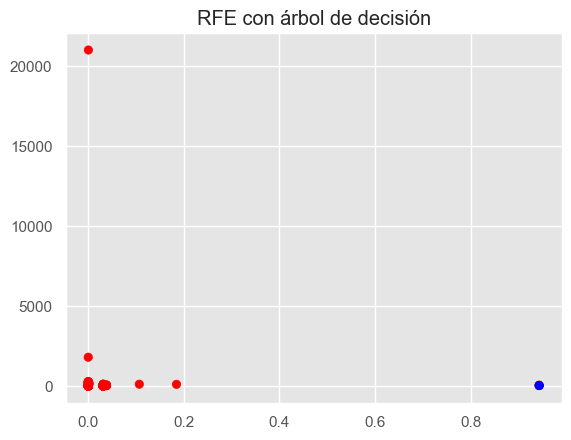

Como se observa, la separación del target en base a las 2 mejores variables del RFE con estimador de árbol de decisión mejora notoriamente respecto a un estimador de regresión logística


In [312]:
# En este caso, las variables son distintas. Se van a representar las dos mejores variables
cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])
plt.title("RFE con árbol de decisión")
plt.scatter(seleccion_rfe_dtc[1:200, 0], seleccion_rfe_dtc[1:200, 1], c=target[1:200], cmap=cm_bright)
plt.show()
print("Como se observa, la separación del target en base a las 2 mejores variables del RFE con estimador de árbol de decisión mejora notoriamente respecto a un estimador de regresión logística")

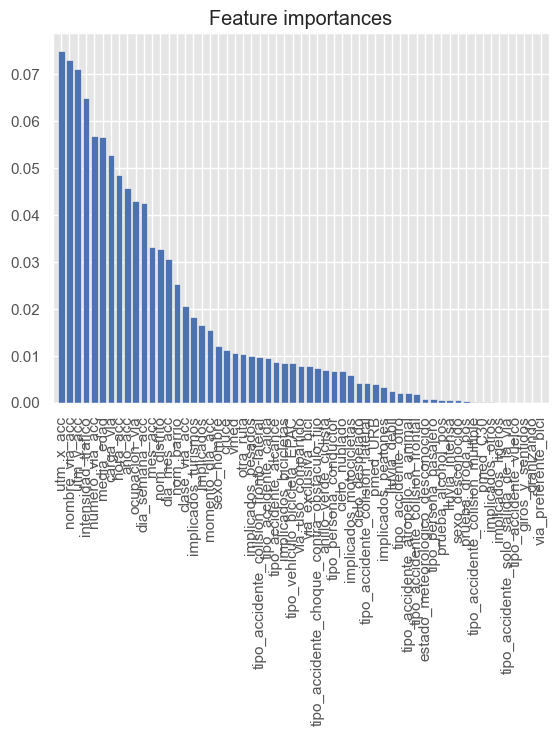

Se puede observar que las 3 primeras variables coinciden con las obtenidas con el RFE con árbol de decisión como estimador


In [313]:
# Otra alternativa es utilizar el método de Feature Importance al construir un modelo de Random Forest
from sklearn.ensemble import RandomForestClassifier
import numpy as np

fi = RandomForestClassifier().fit(variables._get_numeric_data(), target).feature_importances_
indices = np.argsort(fi)[::-1]

plt.figure()
plt.title("Feature importances")
plt.bar(range(variables._get_numeric_data().shape[1]), fi[indices],
        color="b", align="center")
plt.xticks(range(variables._get_numeric_data().shape[1]), variables._get_numeric_data().columns[indices])
plt.xticks(rotation=90)
plt.xlim([-1, variables._get_numeric_data().shape[1]])
plt.show()

print("Se puede observar que las 3 primeras variables coinciden con las obtenidas con el RFE con árbol de decisión como estimador")

In [314]:
# Se puede aplicar también el método de SelectFromModel para seleccionar las variables más importantes en base a un modelo de aprendizaje automático
# En este caso, se va a probar con un Random Forest Classifier 

from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
import numpy as np

# Se escalan los datos con StandardScaler
ss = StandardScaler()
variables_escaladas = ss.fit_transform(variables._get_numeric_data())

# Se crea un modelo de Random Forest Classifier
rfc = RandomForestClassifier(n_estimators=100, random_state=99)

# Y se aplica en el método SelectFromModel
sfm = SelectFromModel(estimator = rfc, threshold='median')
variables_seleccionadas = sfm.fit_transform(variables_escaladas, target)

# Se muestran las variables seleccionadas
nombres_variables = variables._get_numeric_data().columns[sfm.get_support()]
print("Variables seleccionadas por SelectFromModel: ")
for v in nombres_variables.tolist():
    print(v)

print("En este caso, se observa que las 3 técnicas anteriores tienen en común las 3 primeras variables")

Variables seleccionadas por SelectFromModel: 
clase_via_acc
nombre_via_acc
numero_via_acc
nom_distrito
nom_barrio
implicados
implicados_pesados
implicados_turismos
implicados_bicicletas
utm_x_acc
utm_y_acc
intensidad_trafico
ocupacion_via
carga_via
vmed
cruce
año_acc
mes_acc
dia_semana_acc
dia_mes_acc
hora_acc
momento_dia_acc
tipo_accidente_alcance
tipo_accidente_caida
tipo_accidente_colision_fronto-lateral
tipo_persona_conductor
sexo_hombre
otra_ruta
via_exclusiva_bici
media_edad
En este caso, se observa que las 3 técnicas anteriores tienen en común las 3 primeras variables


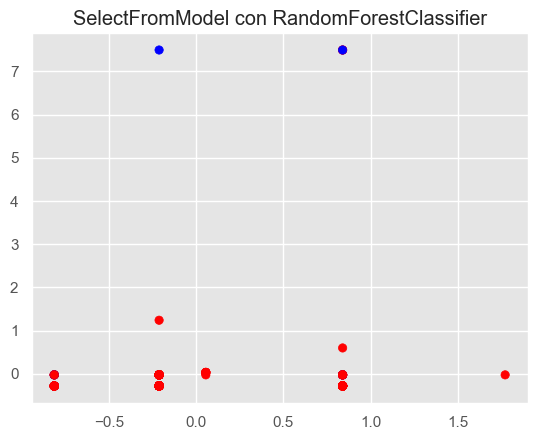

El gráfico mostrado es idéntico al obtenido con RFE (estimador: árbol de decisión), pero con los datos estandarizados.


In [315]:
cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])
plt.title("SelectFromModel con RandomForestClassifier")
plt.scatter(variables_seleccionadas[1:200, 0], variables_seleccionadas[1:200, 1], c=target[1:200], cmap=cm_bright)
plt.show()

print("El gráfico mostrado es idéntico al obtenido con RFE (estimador: árbol de decisión), pero con los datos estandarizados.")

In [316]:
# Otra técnica que se podría utilizar para seleccionar las variables es la eliminación de variables con baja varianza
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=3)
sel.fit_transform(variables._get_numeric_data())
lst1 = list(sel.get_feature_names_out())
lst2 = list(variables._get_numeric_data().columns.values)

# Si se considera un umbral en la varianza de 3, se consigue reducir la lista de variables en 5 variables aleatorias
for x in lst2:
    if x not in lst1:
        print(x)

# No obstante, esta técnica no es muy útil en este conjunto de datos ya que hay muchas variables con poca varianza

clase_via_acc
nombre_via_acc
nom_distrito
nom_barrio
implicados
implicados_peatones
implicados_pesados
implicados_turismos
implicados_motocicletas
implicados_bicicletas
implicados_otros
implicados_ligeros
prueba_droga_pos
cruce
mes_acc
momento_dia_acc
tipo_accidente_alcance
tipo_accidente_atropello_a_animal
tipo_accidente_caida
tipo_accidente_choque_contra_obstaculo_fijo
tipo_accidente_colision_frontal
tipo_accidente_colision_fronto-lateral
tipo_accidente_colisión_lateral
tipo_accidente_colision_multiple
tipo_accidente_otro
tipo_accidente_solo_salida_de_la_via
tipo_accidente_vuelco
cielo_despejado
granizando
lluvia_intensa
lluvia_debil
cielo_nublado
estado_meteorologico_desconocido
tipo_vehiculo_bicicleta_EPAC
tipo_persona_conductor
tipo_persona_pasajero
sexo_desconocido
sexo_hombre
prueba_alcohol_pos
pmed_C30
pmed_URB
anillo_verde_ciclista
giros_y_sentidos
otra_ruta
via_exclusiva_bici
via_preferente_bici
via_uso_compartido


In [317]:
# PCA utilizando SVD aleatorio
from sklearn.decomposition import PCA

pca_svd = PCA(n_components=10, svd_solver='randomized')
pca_svd.fit(variables._get_numeric_data())
print(pca_svd.components_)
print(pca_svd.explained_variance_ratio_)
transformacion2 = pca_svd.transform(variables._get_numeric_data())

[[ 4.32335274e-07  2.11687806e-06  8.32748784e-02  4.83075646e-08
   3.18229064e-08 -4.01113248e-06 -8.11760248e-06 -1.37973729e-06
  -1.44533906e-06  9.95895765e-07  1.01272433e-05 -6.47007236e-09
  -1.01201188e-07  2.61573814e-01  9.61531603e-01 -5.94121112e-08
  -1.00667377e-02 -1.62435467e-04 -1.23016103e-04 -1.52481439e-04
  -3.80947682e-06 -3.97089318e-05  3.09985911e-06  8.40107144e-06
   1.17342509e-05 -2.03112975e-05 -7.06282598e-06 -1.64160482e-06
  -4.43382114e-07  6.07487776e-06 -1.26745327e-07  3.69631646e-06
   1.56992173e-06 -6.19477016e-07 -1.82474242e-07 -4.92653182e-07
  -9.39567993e-08 -1.16913815e-07  1.21470085e-06  2.52441700e-08
   1.29357288e-08 -1.55081273e-07  1.83407021e-07 -1.28120650e-06
  -3.95925128e-06  4.39234029e-06 -3.40012207e-07 -1.53228474e-08
   1.99334169e-06 -6.99855323e-07 -7.42629024e-07  4.81433266e-06
   3.53838060e-06 -1.08772351e-08 -1.08453522e-06 -5.96758059e-06
   3.73642218e-07  3.15097022e-06  6.34870301e-05]
 [-1.89871262e-07  5.4276

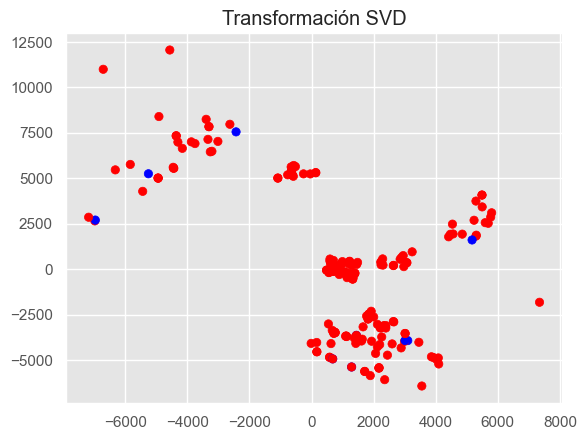

In [318]:
# La representación de las dos mejores variables tras aplicar SVD muestra una buena separación del target
cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])
plt.title("Transformación SVD")
plt.scatter(transformacion2[1:200, 0], transformacion2[1:200, 1], c=target[1:200], cmap=cm_bright)
plt.show()

In [319]:
# Por último, se va a probar con varios Kernel PCA
from sklearn.decomposition import KernelPCA
from sklearn.metrics.pairwise import pairwise_kernels

# Se crea un objeto de la clase KernelPCA con distintos tipos de Kernel
kpca_g = KernelPCA(n_components=None, kernel="rbf", gamma=20, fit_inverse_transform=True, alpha=0.1, random_state=1)
kpca_l = KernelPCA(n_components=10, kernel="linear", random_state=1)
kpca_p = KernelPCA(n_components=10, kernel="poly", degree=4, coef0=1, random_state=1)
kpca_s = KernelPCA(n_components=10, kernel="sigmoid", coef0=1, random_state=1)
kpca_c = KernelPCA(n_components=10, kernel="cosine", random_state=1)

K = pairwise_kernels(variables._get_numeric_data(), metric='rbf', gamma=10)
kpca_pc = KernelPCA(n_components=10, kernel="precomputed", random_state=1)

# Se aplica la transformación a variables
transformacion_kpca_g = kpca_g.fit_transform(variables._get_numeric_data())
transformacion_kpca_l = kpca_l.fit_transform(variables._get_numeric_data())
transformacion_kpca_p = kpca_p.fit_transform(variables._get_numeric_data())
transformacion_kpca_s = kpca_s.fit_transform(variables._get_numeric_data())
transformacion_kpca_c = kpca_c.fit_transform(variables._get_numeric_data())
transformacion_kpca_pc = kpca_pc.fit_transform(K)

Se observa que los kernel que mejor separan la target son el lineal (es como un PCA normal, por lo que podríamos ahorrarnos aplicar un Kernel) y el polinómico (deja en medio los valores True)


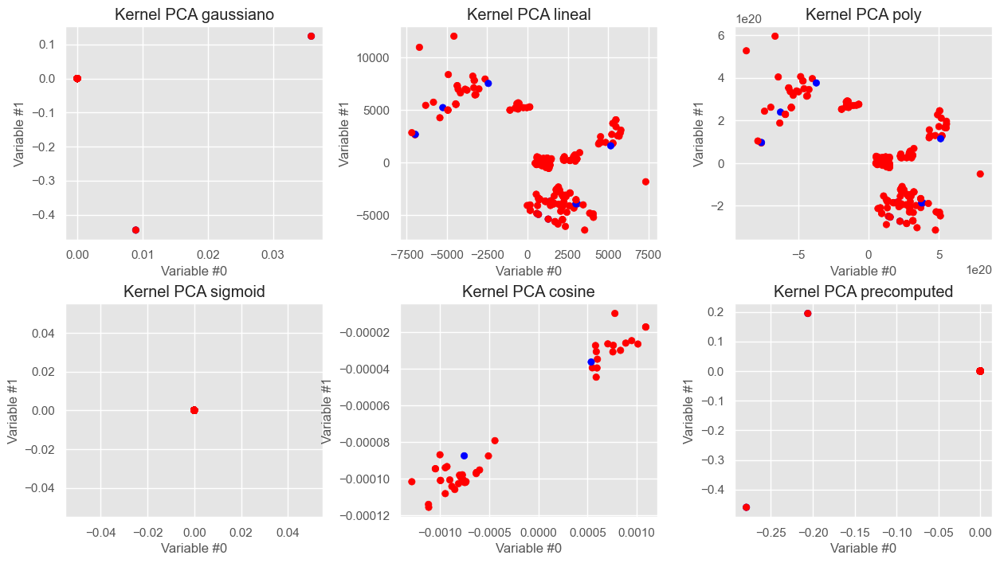

In [320]:
cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 8))
fig.subplots_adjust(wspace=0.3, hspace=0.3)

axs[0,0].scatter(transformacion_kpca_g[1:200, 0], transformacion_kpca_g[1:200, 1], c=target[1:200], cmap=cm_bright)
axs[0,0].set_ylabel("Variable #1")
axs[0,0].set_xlabel("Variable #0")
axs[0,0].set_title("Kernel PCA gaussiano")

axs[0,1].scatter(transformacion_kpca_l[1:200, 0], transformacion_kpca_l[1:200, 1], c=target[1:200], cmap=cm_bright)
axs[0,1].set_ylabel("Variable #1")
axs[0,1].set_xlabel("Variable #0")
axs[0,1].set_title("Kernel PCA lineal")

axs[0,2].scatter(transformacion_kpca_p[1:200, 0], transformacion_kpca_p[1:200, 1], c=target[1:200], cmap=cm_bright)
axs[0,2].set_ylabel("Variable #1")
axs[0,2].set_xlabel("Variable #0")
axs[0,2].set_title("Kernel PCA poly")

axs[1,0].scatter(transformacion_kpca_s[1:200, 0], transformacion_kpca_s[1:200, 1], c=target[1:200], cmap=cm_bright)
axs[1,0].set_ylabel("Variable #1")
axs[1,0].set_xlabel("Variable #0")
axs[1,0].set_title("Kernel PCA sigmoid")

axs[1,1].scatter(transformacion_kpca_c[1:50, 0], transformacion_kpca_c[1:50, 1], c=target[1:50], cmap=cm_bright)
axs[1,1].set_ylabel("Variable #1")
axs[1,1].set_xlabel("Variable #0")
axs[1,1].set_title("Kernel PCA cosine")

axs[1,2].scatter(transformacion_kpca_pc[1:200, 0], transformacion_kpca_pc[1:200, 1], c=target[1:200], cmap=cm_bright)
axs[1,2].set_ylabel("Variable #1")
axs[1,2].set_xlabel("Variable #0")
axs[1,2].set_title("Kernel PCA precomputed")

print("Se observa que los kernel que mejor separan la target son el lineal (es como un PCA normal, por lo que podríamos ahorrarnos aplicar un Kernel) y el polinómico (deja en medio los valores True)")